## Module Import & Data Load

In [1]:
import sys

from pathlib import Path
from datetime import timedelta

import dateutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from tqdm.notebook import trange
from TaPR_pkg import etapr
from src import dataset
import random
import pickle
from torchinfo import summary
# import wandb

In [2]:
# wandb.init(project="HAI-GPTLARGE", reinit=True)

In [3]:
import datetime
now = datetime.datetime.now()
# wandb.run.name = now.strftime("%Y/%m/%d %H:%m:%S")

In [4]:
import transformers
from src.models.gpt2 import GPT2Model

In [5]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.backends.cudnn.benchmark = True

In [6]:
def set_seed(random_seed):
    torch.manual_seed(random_seed)
    torch.cuda.manual_seed(random_seed)
    torch.cuda.manual_seed_all(random_seed)  # if use multi-GPU
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    np.random.seed(random_seed)
    random.seed(random_seed)

set_seed(72)

In [7]:
# wandb.init(config={
#     "WINDOW_GIVEN": 254, 
#     "WINDOW_SIZE": 255,
#     "epochs": 500,
# })

In [8]:
WINDOW_GIVEN = 254
WINDOW_SIZE = 255

class HaiDataset(Dataset):
    def __init__(self, timestamps, df, stride=1, attacks=None):
        self.ts = np.array(timestamps)
        self.tag_values = np.array(df, dtype=np.float32)
        self.valid_idxs = []
        for L in trange(len(self.ts) - WINDOW_SIZE + 1):
            R = L + WINDOW_SIZE - 1
            if dateutil.parser.parse(self.ts[R]) - dateutil.parser.parse(
                self.ts[L]
            ) == timedelta(seconds=WINDOW_SIZE - 1):
                self.valid_idxs.append(L)
        self.valid_idxs = np.array(self.valid_idxs, dtype=np.int32)[::stride]
        self.n_idxs = len(self.valid_idxs)
        print(f"# of valid windows: {self.n_idxs}")
        if attacks is not None:
            self.attacks = np.array(attacks, dtype=np.float32)
            self.with_attack = True
        else:
            self.with_attack = False

    def __len__(self):
        return self.n_idxs

    def __getitem__(self, idx):
        i = self.valid_idxs[idx]
        last = i + WINDOW_SIZE - 1
        item = {"attack": self.attacks[last]} if self.with_attack else {}
        item["ts"] = self.ts[i + WINDOW_SIZE - 1]
        item["given"] = torch.from_numpy(self.tag_values[i : i + WINDOW_GIVEN])
        item["answer"] = torch.from_numpy(self.tag_values[last])
        return item

In [9]:
def boundary_check(df):
    x = np.array(df, dtype=np.float32)
    return np.any(x > 1.0), np.any(x < 0), np.any(np.isnan(x))

In [10]:
TRAIN_DATASET = sorted([x for x in Path("HAICon2021_dataset/train/").glob("*.csv")])
TRAIN_DATASET

[PosixPath('HAICon2021_dataset/train/train1.csv'),
 PosixPath('HAICon2021_dataset/train/train2.csv'),
 PosixPath('HAICon2021_dataset/train/train3.csv'),
 PosixPath('HAICon2021_dataset/train/train4.csv'),
 PosixPath('HAICon2021_dataset/train/train5.csv'),
 PosixPath('HAICon2021_dataset/train/train6.csv')]

In [11]:
TEST_DATASET = sorted([x for x in Path("HAICon2021_dataset/test/").glob("*.csv")])
TEST_DATASET

[PosixPath('HAICon2021_dataset/test/test1.csv'),
 PosixPath('HAICon2021_dataset/test/test2.csv'),
 PosixPath('HAICon2021_dataset/test/test3.csv')]

In [12]:
VALIDATION_DATASET = sorted([x for x in Path("HAICon2021_dataset/validation/").glob("*.csv")])
VALIDATION_DATASET

[PosixPath('HAICon2021_dataset/validation/validation.csv')]

In [13]:
def dataframe_from_csv(target):
    return pd.read_csv(target).rename(columns=lambda x: x.strip())

def dataframe_from_csvs(targets):
    return pd.concat([dataframe_from_csv(x) for x in targets])

In [14]:
TRAIN_DF_RAW = dataframe_from_csvs(TRAIN_DATASET)
TRAIN_DF_RAW

,timestamp,C01,C02,C03,C04,C05,C06,C07,C08,C09,...,C77,C78,C79,C80,C81,C82,C83,C84,C85,C86
0,2021-07-11 10:00:00,-2.2642,0,12.26196,-0.00087,12.01019,0.2254,12.66931,70,1,...,0.92255,30.08042,7.08818,595.06104,276.40338,1,1014.79321,12.0,50,3506
1,2021-07-11 10:00:01,-2.4923,0,12.26196,0.00058,12.56714,-0.0711,12.66931,70,1,...,0.92255,30.08423,7.08818,531.50317,276.18634,1,1014.79321,12.0,50,3493
2,2021-07-11 10:00:02,-2.8460,0,12.26196,-0.00072,14.48975,0.0051,12.66931,70,1,...,0.91873,30.09148,7.08818,451.06253,279.85754,1,1014.79321,12.0,50,3490
3,2021-07-11 10:00:03,-2.1235,0,12.26196,0.00101,15.93170,0.1842,12.66931,70,1,...,0.91644,30.10407,7.08818,404.38739,281.50317,1,1014.79321,12.0,50,3525
4,2021-07-11 10:00:04,-2.9074,0,12.26196,0.00043,16.10718,0.1842,12.66931,70,1,...,0.91797,30.10331,7.08818,382.53925,281.34039,1,1014.79321,12.0,50,3503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259195,2021-08-09 08:59:56,-2.0065,0,12.26196,0.00051,100.28228,0.5977,12.53358,70,1,...,1.17355,35.05434,10.00000,3178.48877,370.02679,1,986.05908,12.0,50,136
259196,2021-08-09 08:59:57,-2.2101,0,12.26196,-0.00029,100.28228,0.5509,12.53358,70,1,...,1.16898,35.03488,10.00000,3175.36084,370.40656,1,986.05908,12.0,50,89
259197,2021-08-09 08:59:58,-2.3325,0,12.26196,0.00152,100.28228,0.5425,12.53358,70,1,...,1.16974,35.02840,10.00000,3175.73608,368.12787,1,986.05908,12.0,50,90
259198,2021-08-09 08:59:59,-2.3049,0,12.26196,0.00058,100.26703,0.6266,12.53358,70,1,...,1.16974,35.02420,10.00000,3176.61182,368.01941,1,986.05908,12.0,50,74


In [15]:
TIMESTAMP_FIELD = "timestamp"
IDSTAMP_FIELD = 'id'
ATTACK_FIELD = "attack"
VALID_COLUMNS_IN_TRAIN_DATASET = TRAIN_DF_RAW.columns.drop([TIMESTAMP_FIELD])
VALID_COLUMNS_IN_TRAIN_DATASET

Index(['C01', 'C02', 'C03', 'C04', 'C05', 'C06', 'C07', 'C08', 'C09', 'C10',
       'C11', 'C12', 'C13', 'C14', 'C15', 'C16', 'C17', 'C18', 'C19', 'C20',
       'C21', 'C22', 'C23', 'C24', 'C25', 'C26', 'C27', 'C28', 'C29', 'C30',
       'C31', 'C32', 'C33', 'C34', 'C35', 'C36', 'C37', 'C38', 'C39', 'C40',
       'C41', 'C42', 'C43', 'C44', 'C45', 'C46', 'C47', 'C48', 'C49', 'C50',
       'C51', 'C52', 'C53', 'C54', 'C55', 'C56', 'C57', 'C58', 'C59', 'C60',
       'C61', 'C62', 'C63', 'C64', 'C65', 'C66', 'C67', 'C68', 'C69', 'C70',
       'C71', 'C72', 'C73', 'C74', 'C75', 'C76', 'C77', 'C78', 'C79', 'C80',
       'C81', 'C82', 'C83', 'C84', 'C85', 'C86'],
      dtype='object')

In [16]:
TAG_MIN = TRAIN_DF_RAW[VALID_COLUMNS_IN_TRAIN_DATASET].min()
TAG_MAX = TRAIN_DF_RAW[VALID_COLUMNS_IN_TRAIN_DATASET].max()

In [17]:
def normalize(df):
    ndf = df.copy()
    for c in df.columns:
        if TAG_MIN[c] == TAG_MAX[c]:
            ndf[c] = df[c] - TAG_MIN[c]
        else:
            ndf[c] = (df[c] - TAG_MIN[c]) / (TAG_MAX[c] - TAG_MIN[c])
    return ndf

In [18]:
TRAIN_DF = normalize(TRAIN_DF_RAW[VALID_COLUMNS_IN_TRAIN_DATASET]).ewm(alpha=0.9).mean()
TRAIN_DF

,C01,C02,C03,C04,C05,C06,C07,C08,C09,C10,...,C77,C78,C79,C80,C81,C82,C83,C84,C85,C86
0,0.433107,0.0,0.056338,0.501686,0.116706,0.447955,0.816071,0.0,0.0,0.0,...,0.240561,0.194185,0.708818,0.183693,0.169066,0.0,0.538147,0.0,0.0,0.276078
1,0.395098,0.0,0.056338,0.517560,0.121738,0.397053,0.816071,0.0,0.0,0.0,...,0.240561,0.194535,0.708818,0.165517,0.168332,0.0,0.538147,0.0,0.0,0.275176
2,0.333267,0.0,0.056338,0.504886,0.139408,0.405431,0.816071,0.0,0.0,0.0,...,0.238319,0.195226,0.708818,0.141083,0.180570,0.0,0.538147,0.0,0.0,0.274889
3,0.446345,0.0,0.056338,0.522383,0.154058,0.436703,0.816071,0.0,0.0,0.0,...,0.236754,0.196440,0.708818,0.125447,0.187292,0.0,0.538147,0.0,0.0,0.277264
4,0.328324,0.0,0.056338,0.517845,0.157091,0.439827,0.816071,0.0,0.0,0.0,...,0.237495,0.196492,0.708818,0.117700,0.187419,0.0,0.538147,0.0,0.0,0.275990
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259195,0.485034,0.0,0.056340,0.515751,0.994085,0.520004,0.640361,0.0,0.0,0.0,...,0.403941,0.696846,1.000000,0.996289,0.517805,0.0,0.414192,0.0,0.0,0.018717
259196,0.447224,0.0,0.056338,0.509379,0.994085,0.510481,0.640361,0.0,0.0,0.0,...,0.401381,0.695028,1.000000,0.995484,0.518674,0.0,0.414192,0.0,0.0,0.015676
259197,0.423251,0.0,0.056338,0.528358,0.994085,0.508101,0.640361,0.0,0.0,0.0,...,0.401571,0.694256,1.000000,0.995510,0.511131,0.0,0.414192,0.0,0.0,0.015440
259198,0.425407,0.0,0.056338,0.520068,0.993949,0.522157,0.640361,0.0,0.0,0.0,...,0.401590,0.693797,1.000000,0.995761,0.510014,0.0,0.414192,0.0,0.0,0.014318


In [19]:
HAI_DATASET_TRAIN = HaiDataset(TRAIN_DF_RAW[TIMESTAMP_FIELD], TRAIN_DF, stride=10)
HAI_DATASET_TRAIN[0]


# of valid windows: 100288


{'ts': '2021-07-11 10:04:14',
 'given': tensor([[0.4331, 0.0000, 0.0563,  ..., 0.0000, 0.0000, 0.2761],
         [0.3951, 0.0000, 0.0563,  ..., 0.0000, 0.0000, 0.2752],
         [0.3333, 0.0000, 0.0563,  ..., 0.0000, 0.0000, 0.2749],
         ...,
         [0.3126, 0.0000, 0.0563,  ..., 0.0000, 0.0000, 0.0091],
         [0.4151, 0.0000, 0.0563,  ..., 0.0000, 0.0000, 0.0091],
         [0.4197, 0.0000, 0.0563,  ..., 0.0000, 0.0000, 0.0091]]),
 'answer': tensor([0.4201, 0.0000, 0.0563, 0.4333, 0.1376, 0.4077, 0.8161, 0.0000, 0.0000,
         0.0000, 0.7641, 0.3990, 0.4475, 0.3553, 0.2482, 0.2243, 0.0000, 0.0000,
         0.0000, 0.3050, 0.3530, 0.0000, 0.2908, 0.6291, 0.0067, 0.0000, 0.2951,
         0.2689, 0.0000, 0.9763, 0.5345, 0.2550, 0.3436, 0.0000, 0.9009, 0.0000,
         0.2097, 0.0000, 0.0000, 0.0340, 0.2541, 0.8280, 0.4356, 0.3652, 1.0000,
         1.0000, 0.4115, 1.0000, 0.0000, 0.0297, 0.4960, 0.0000, 0.6607, 0.1375,
         0.0000, 0.2578, 0.7985, 0.1781, 0.2675, 0.3467, 1.

In [20]:
VALIDATION_DF_RAW = dataframe_from_csvs(VALIDATION_DATASET)
VALIDATION_DF_RAW

,timestamp,C01,C02,C03,C04,C05,C06,C07,C08,C09,...,C78,C79,C80,C81,C82,C83,C84,C85,C86,attack
0,2021-07-10 00:00:01,-2.0395,0,11.78894,0.00058,16.32080,0.4010,12.903438,70,1,...,31.52100,0.716042,386.51172,356.64423,1,1034.712769,12.0,50,161,0
1,2021-07-10 00:00:02,-2.1750,0,11.78894,-0.00282,15.95459,0.4187,12.903438,70,1,...,31.51756,0.716042,411.33905,352.08698,1,1034.712769,12.0,50,155,0
2,2021-07-10 00:00:03,-2.5854,0,11.78131,-0.00398,14.79492,0.0691,12.903438,70,1,...,31.50269,0.716042,438.15259,347.63818,1,1034.712769,12.0,50,149,0
3,2021-07-10 00:00:04,-2.4722,0,11.78894,-0.00152,14.72626,0.3306,12.903438,70,1,...,31.47942,0.716042,465.95908,340.33203,1,1034.712769,12.0,50,148,0
4,2021-07-10 00:00:05,-2.2319,0,11.78131,0.00072,14.78729,0.2150,12.903438,70,1,...,31.47942,0.716042,452.05582,335.17798,1,1034.712769,12.0,50,148,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86395,2021-07-10 23:59:56,-2.8150,0,12.26196,0.00130,15.53497,-0.0507,12.669310,70,1,...,31.79814,0.716042,1193.48230,347.58386,1,1018.394040,12.0,50,7,0
86396,2021-07-10 23:59:57,-2.6272,0,12.26196,0.00109,15.53497,0.1829,12.669310,70,1,...,31.79738,0.716042,1179.76929,348.03607,1,1018.394040,12.0,50,7,0
86397,2021-07-10 23:59:58,-2.3564,0,12.26196,-0.00101,15.53497,0.2907,12.669310,70,1,...,31.78784,0.716042,1152.66187,348.81366,1,1018.394040,12.0,50,7,0
86398,2021-07-10 23:59:59,-2.1541,0,12.26196,-0.00166,15.53497,0.3280,12.669310,70,1,...,31.77029,0.716042,1130.65723,349.13916,1,1018.394040,12.0,50,7,0


In [21]:
VALIDATION_DF = normalize(VALIDATION_DF_RAW[VALID_COLUMNS_IN_TRAIN_DATASET]).ewm(alpha=0.9).mean()

In [22]:
HAI_DATASET_VALIDATION = HaiDataset(
    VALIDATION_DF_RAW[TIMESTAMP_FIELD], VALIDATION_DF, attacks=VALIDATION_DF_RAW[ATTACK_FIELD]
)
HAI_DATASET_VALIDATION[0]


# of valid windows: 86146


{'attack': 0.0,
 'ts': '2021-07-10 00:04:15',
 'given': tensor([[ 0.4743,  0.0000, -0.0407,  ...,  0.0000,  0.0000,  0.0208],
         [ 0.4517,  0.0000, -0.0407,  ...,  0.0000,  0.0000,  0.0204],
         [ 0.3819,  0.0000, -0.0421,  ...,  0.0000,  0.0000,  0.0200],
         ...,
         [ 0.4617,  0.0000, -0.0407,  ...,  0.0000,  0.0000,  0.0090],
         [ 0.4217,  0.0000, -0.0407,  ...,  0.0000,  0.0000,  0.0090],
         [ 0.4203,  0.0000, -0.0407,  ...,  0.0000,  0.0000,  0.0090]]),
 'answer': tensor([ 0.3607,  0.0000, -0.0407,  0.5273,  0.1291,  0.4473,  1.1192,  0.0000,
          0.0000,  0.0000,  0.4830,  0.4335,  0.5163,  0.5091,  0.3884,  0.2852,
          0.0000,  0.0000,  0.0000,  0.8439,  0.5102,  0.0000,  0.3838,  0.4311,
          0.0064,  0.0000,  0.3743,  0.3058,  0.0000,  0.9956,  0.6145,  0.3052,
          0.3306,  0.0000,  0.9909,  0.0000,  0.3079,  0.0000,  0.0000,  0.0324,
          0.1955,  0.5278,  0.4322,  0.3636,  1.0000,  1.0000,  0.4405,  1.0000,
       

In [23]:
boundary_check(VALIDATION_DF)

(True, True, False)

In [24]:
TEST_DF_RAW = dataframe_from_csvs(TEST_DATASET)
TEST_DF_RAW

,timestamp,C01,C02,C03,C04,C05,C06,C07,C08,C09,...,C77,C78,C79,C80,C81,C82,C83,C84,C85,C86
0,2021-07-13 16:00:01,-2.1424,0,12.37640,-0.00275,8.02002,0.1524,12.58874,70,1,...,1.13464,29.09910,2.85153,227.61664,333.51416,1,981.36951,12.0,50,2100
1,2021-07-13 16:00:02,-2.0449,0,12.37640,-0.00087,8.02002,0.1281,12.58874,70,1,...,1.13312,29.14869,2.85153,231.58908,340.18738,1,981.36951,12.0,50,2165
2,2021-07-13 16:00:03,-2.1287,0,12.37640,-0.00260,8.02002,0.0148,12.58874,70,1,...,1.13388,29.18836,2.85153,229.60286,347.14990,1,981.36951,12.0,50,2209
3,2021-07-13 16:00:04,-2.1287,0,12.37640,-0.00282,8.02002,0.0148,12.58874,70,1,...,1.13541,29.24558,2.85153,229.60286,355.90277,1,981.36951,12.0,50,2233
4,2021-07-13 16:00:05,-2.5969,0,12.37640,0.00058,8.02002,-0.2225,12.58874,70,1,...,1.13541,29.24558,2.85153,222.65125,358.23566,1,981.36951,12.0,50,2290
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129595,2021-07-16 23:59:56,-1.8328,0,12.07123,0.00036,15.03143,0.8050,12.58870,70,1,...,0.92941,29.45263,2.40398,1056.03259,373.20966,1,1015.06964,12.0,50,22
129596,2021-07-16 23:59:57,-1.8328,0,12.07123,-0.00470,13.74206,0.8050,12.58870,70,1,...,0.92255,29.45758,2.40398,1026.05530,376.66376,1,1015.06964,12.0,50,22
129597,2021-07-16 23:59:58,-1.5833,0,12.07123,-0.00130,13.64288,0.9984,12.58870,70,1,...,0.92255,29.45034,2.40398,981.37659,377.76691,1,1015.06964,12.0,50,22
129598,2021-07-16 23:59:59,-1.4022,0,12.07123,0.00087,13.62762,1.0595,12.58870,70,1,...,0.92255,29.43088,2.40398,919.62439,378.99664,1,1015.06964,12.0,50,22


In [25]:
TEST_DF = normalize(TEST_DF_RAW[VALID_COLUMNS_IN_TRAIN_DATASET]).ewm(alpha=0.9).mean()
TEST_DF

,C01,C02,C03,C04,C05,C06,C07,C08,C09,C10,...,C77,C78,C79,C80,C81,C82,C83,C84,C85,C86
0,0.455432,0.0,0.079812,0.479046,0.077046,0.434169,0.711769,0.0,0.0,0.0,...,0.378726,0.095024,0.285153,0.068104,0.381526,0.0,0.393961,0.0,0.0,0.168791
1,0.471678,0.0,0.079812,0.499628,0.077046,0.429998,0.711769,0.0,0.0,0.0,...,0.377826,0.099579,0.285153,0.069240,0.404094,0.0,0.393961,0.0,0.0,0.173300
2,0.459304,0.0,0.079812,0.482713,0.077046,0.410346,0.711769,0.0,0.0,0.0,...,0.378191,0.103601,0.285153,0.068779,0.429462,0.0,0.393961,0.0,0.0,0.176731
3,0.458079,0.0,0.079812,0.478654,0.077046,0.408400,0.711769,0.0,0.0,0.0,...,0.379124,0.109204,0.285153,0.068734,0.461282,0.0,0.393961,0.0,0.0,0.178719
4,0.380719,0.0,0.079812,0.515098,0.077046,0.367874,0.711769,0.0,0.0,0.0,...,0.379218,0.109763,0.285153,0.066761,0.472272,0.0,0.393961,0.0,0.0,0.182832
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129595,0.511523,0.0,0.017216,0.516825,0.147339,0.557125,0.711717,0.0,0.0,0.0,...,0.245764,0.130889,0.240398,0.327644,0.529605,0.0,0.539339,0.0,0.0,0.010225
129596,0.512114,0.0,0.017216,0.461690,0.135262,0.557380,0.711717,0.0,0.0,0.0,...,0.241081,0.131212,0.240398,0.320111,0.540804,0.0,0.539339,0.0,0.0,0.010225
129597,0.553332,0.0,0.017216,0.493026,0.133167,0.590276,0.711717,0.0,0.0,0.0,...,0.240613,0.130586,0.240398,0.306708,0.545617,0.0,0.539339,0.0,0.0,0.010225
129598,0.587329,0.0,0.017216,0.519678,0.132821,0.603950,0.711717,0.0,0.0,0.0,...,0.240566,0.128753,0.240398,0.287885,0.550216,0.0,0.539339,0.0,0.0,0.010225


In [26]:
boundary_check(TEST_DF)

(True, True, False)

In [27]:
HAI_DATASET_TEST = HaiDataset(
    TEST_DF_RAW[TIMESTAMP_FIELD], TEST_DF, attacks=None
)
HAI_DATASET_VALIDATION[0]


# of valid windows: 274038


{'attack': 0.0,
 'ts': '2021-07-10 00:04:15',
 'given': tensor([[ 0.4743,  0.0000, -0.0407,  ...,  0.0000,  0.0000,  0.0208],
         [ 0.4517,  0.0000, -0.0407,  ...,  0.0000,  0.0000,  0.0204],
         [ 0.3819,  0.0000, -0.0421,  ...,  0.0000,  0.0000,  0.0200],
         ...,
         [ 0.4617,  0.0000, -0.0407,  ...,  0.0000,  0.0000,  0.0090],
         [ 0.4217,  0.0000, -0.0407,  ...,  0.0000,  0.0000,  0.0090],
         [ 0.4203,  0.0000, -0.0407,  ...,  0.0000,  0.0000,  0.0090]]),
 'answer': tensor([ 0.3607,  0.0000, -0.0407,  0.5273,  0.1291,  0.4473,  1.1192,  0.0000,
          0.0000,  0.0000,  0.4830,  0.4335,  0.5163,  0.5091,  0.3884,  0.2852,
          0.0000,  0.0000,  0.0000,  0.8439,  0.5102,  0.0000,  0.3838,  0.4311,
          0.0064,  0.0000,  0.3743,  0.3058,  0.0000,  0.9956,  0.6145,  0.3052,
          0.3306,  0.0000,  0.9909,  0.0000,  0.3079,  0.0000,  0.0000,  0.0324,
          0.1955,  0.5278,  0.4322,  0.3636,  1.0000,  1.0000,  0.4405,  1.0000,
       

In [28]:
params = {'batch_size': 512,
          'shuffle': True,
          'num_workers': 4,
          'pin_memory' : True}
trainloader = DataLoader(HAI_DATASET_TRAIN, **params)
params['shuffle'] = False
validloader = DataLoader(HAI_DATASET_VALIDATION, **params)
testloader = DataLoader(HAI_DATASET_TEST, **params)

In [29]:
train_shape = next(iter(trainloader))['given'].shape
print(train_shape)

torch.Size([512, 254, 86])


In [30]:
next(iter(trainloader))['answer'].shape

torch.Size([512, 86])

## Model

In [31]:
class HAIGPT(nn.Module):

    def __init__(
            self,
            input_dim,
            hidden_size,
            max_len=WINDOW_GIVEN,
            device='cuda',
            **kwargs
    ):
        super().__init__()
        self.input_dim = input_dim
        self.hidden_size = hidden_size
        self.device = device
        config = transformers.GPT2Config(
            vocab_size=1,  # doesn't matter -- we don't use the vocab
            n_embd=hidden_size,
            **kwargs
        )

        # note: the only difference between this GPT2Model and the default Huggingface version
        # is that the positional embeddings are removed (since we'll add those ourselves)
        self.transformer = GPT2Model(config)

        self.pos_embedding = nn.Parameter(torch.randn(1, max_len, hidden_size))
        self.embed_token = nn.Linear(self.input_dim, hidden_size)

        self.embed_ln = nn.LayerNorm(hidden_size)

        self.predict = nn.Linear(hidden_size, self.input_dim)

    def forward(self, token, attention_mask=None):

        batch_size, seq_length = token.shape[0], token.shape[1]

        if attention_mask is None:
            # attention mask for GPT: 1 if can be attended to, 0 if not
            attention_mask = torch.ones((batch_size, seq_length), dtype=torch.long).to(self.device)

        # embed each modality with a different head
        token_embeddings = self.embed_token(token)

        # time embeddings are treated similar to positional embeddings
        token_embeddings = token_embeddings + self.pos_embedding

        # which works nice in an autoregressive sense since states predict actions
        inputs = self.embed_ln(token_embeddings)

        # we feed in the input embeddings (not word indices as in NLP) to the model
        transformer_outputs = self.transformer(
            inputs_embeds=inputs,
            attention_mask=attention_mask,
        )
        x = transformer_outputs['last_hidden_state']
        
        # get predictions
        preds = self.predict(x)  

        return preds[:,-1]

In [32]:
train_shape[1:]

torch.Size([254, 86])

In [33]:
input_shape = train_shape[1:]
model = HAIGPT(
    input_dim=input_shape[-1],
    hidden_size=128,
    max_len=WINDOW_GIVEN,
    n_layer=3,
    n_head=4,
    n_inner=4*128,
    activation_function='relu',
    n_positions=1024,
    resid_pdrop=0.1,
    attn_pdrop=0.1,
).to(device)


In [34]:
print(model)

HAIGPT(
  (transformer): GPT2Model(
    (wte): Embedding(1, 128)
    (drop): Dropout(p=0.1, inplace=False)
    (h): ModuleList(
      (0): Block(
        (ln_1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (attn): Attention(
          (c_attn): Conv1D()
          (c_proj): Conv1D()
          (attn_dropout): Dropout(p=0.1, inplace=False)
          (resid_dropout): Dropout(p=0.1, inplace=False)
        )
        (ln_2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (mlp): MLP(
          (c_fc): Conv1D()
          (c_proj): Conv1D()
          (dropout): Dropout(p=0.1, inplace=False)
        )
      )
      (1): Block(
        (ln_1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (attn): Attention(
          (c_attn): Conv1D()
          (c_proj): Conv1D()
          (attn_dropout): Dropout(p=0.1, inplace=False)
          (resid_dropout): Dropout(p=0.1, inplace=False)
        )
        (ln_2): LayerNorm((128,), eps=1e-05, elementwise_affine=T

In [35]:
optimizer = optim.AdamW(model.parameters())
loss_fn = nn.MSELoss()

In [36]:
def train(model, train_data, optimizer, loss_fn, use_fp16=True, max_norm=None):
    
    epoch_loss = 0
    
    model.train() 

    for idx, batch in enumerate(train_data):
        
        optimizer.zero_grad(set_to_none=True)
        scaler = torch.cuda.amp.GradScaler()
                
        input = batch['given'].to(device)
        answer = batch["answer"].to(device)
        
        with torch.cuda.amp.autocast(enabled=use_fp16):
            predictions = model.forward(input)
            train_loss = loss_fn(predictions, answer)
        if use_fp16:
            scaler.scale(train_loss).backward()
            if max_norm is not None:
                scaler.unscale_(optimizer)
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm)
            scaler.step(optimizer)
            scaler.update()
        else:
            train_loss.backward()
            optimizer.step()
        
        epoch_loss += train_loss.item()
        
    return epoch_loss

In [37]:
def validation(model, val_data, loss_fn):
    model.eval()
    val_loss = 0
    for idx, batch in enumerate(val_data):
        input = batch['given'].to(device)
        answer = batch["answer"].to(device)
        with torch.no_grad():
            predictions = model.forward(input)
            val_loss += loss_fn(predictions, answer).item()
        
    return val_loss

In [38]:
class EarlyStopping():
    def __init__(self, patience=0, verbose=0):
        self._step = 0
        self._loss = float('inf')
        self.patience = patience
        self.verbose = verbose

    def validate(self, loss):
        if self._loss < loss:
            self._step += 1
            if self._step > self.patience:
                if self.verbose:
                    print(f'\n Training process is stopped early....')
                return True
        else:
            self._step = 0
            self._loss = loss

        return False

In [39]:
def inference(dataloader, model):
    model.eval()
    ts, pred, dist, att = [], [], [], []
    with torch.no_grad():
        for batch in dataloader:
            given = batch['given'].to(device)
            answer = batch["answer"].to(device)
            guess = model(given)
            ts.append(np.array(batch["ts"]))
            pred.append(guess.cpu().numpy())
            dist.append(torch.abs(answer - guess).cpu().numpy())
#             dist.append(torch.sum(torch.abs(guess-given), 1).cpu().numpy())
            try:
                att.append(np.array(batch["attack"]))
            except:
                att.append(np.zeros(given.shape[0]))
            
    return (
        np.concatenate(ts),
        np.concatenate(pred),
        np.concatenate(dist),
        np.concatenate(att),
    )

In [81]:
def check_graph(xs, att, piece=2, THRESHOLD=None, title = False, title_nm = None):
    l = xs.shape[0]
    chunk = l // piece
    fig, axs = plt.subplots(piece, figsize=(20, 4 * piece))
    for i in range(piece):
        L = i * chunk
        R = min(L + chunk, l)
        xticks = range(L, R)
        axs[i].plot(xticks, xs[L:R])
        if len(xs[L:R]) > 0:
            peak = max(xs[L:R])
            axs[i].plot(xticks, att[L:R] * peak * 0.3)
        if THRESHOLD!=None:
            axs[i].axhline(y=THRESHOLD, color='r')
    
    if title == True:
        plt.title(f'{title_nm}')
        
    plt.show()
    
    return plt

In [41]:
def check_graph2(xs, att, piece=2, THRESHOLD=None):
    l = xs.shape[1]
    chunk = l // piece
    for j in range(xs.shape[0]):
        print(j)
        fig, axs = plt.subplots(piece, figsize=(20, 4 * piece))
        score = range_check(xs[j], size=30)
        for i in range(piece):
            L = i * chunk
            R = min(L + chunk, l)
            xticks = range(L, R)
            axs[i].plot(xticks, score[L:R])
            if len(score[L:R]) > 0:
                peak = max(score[L:R])
                axs[i].plot(xticks, att[L:R] * peak * 0.3)
            if THRESHOLD!=None:
                axs[i].axhline(y=THRESHOLD, color='r')
        plt.show()
    
    return plt

In [42]:
def range_check(series, size):
    size = size
    data = []

    for i in range(len(series)-size+1):
        if i == 0 :
            check_std = np.std(series[i:i+size])
        std = np.std(series[i:i+size])
        mean = np.mean(series[i:i+size])
        max = np.max(series[i:i+size])
        if check_std * 2 >= std:
            check_std = std
            data.append(mean)
        elif max == series[i]:
            data.append(max*5)
            check_std = std
        else:
            data.append(series[i]*3)
    for _ in range(size-1):
        data.append(mean)

    return np.array(data)

In [43]:
# %%time
# epochs = wandb.config["epochs"]
# history = dict()
# best = {"loss": sys.float_info.max}
# early_stopping = EarlyStopping(patience=30, verbose=1)
# for epoch in range(1, epochs+1):
#     epoch_loss = train(model, trainloader, optimizer, loss_fn, use_fp16=False)
#     val_loss = validation(model, validloader, loss_fn)
    
#     history.setdefault('loss', []).append(epoch_loss) 
#     history.setdefault('val_loss', []).append(val_loss) 
    
#     sys.stdout.write(
#         "\r" + f"[Train] Epoch : {epoch:^3}"\
#         f"  Train Loss: {epoch_loss:.4}"\
#         f"  Validation Loss: {val_loss:.4}"\
#                     )
# #     print(f"[Train] Epoch : {epoch:^3}"\
# #         f"  Train Loss: {epoch_loss:.4}"\
# #         f"  Validation Loss: {val_loss:.4}")

#     if epoch_loss < best["loss"]:
#             best["state"] = model.state_dict()
#             best["loss"] = epoch_loss
#             best["epoch"] = epoch + 1
            
#     wandb.log({
#         "Train Loss" : epoch_loss,
#         "Validation Loss" : val_loss
#     })
    
#     if epoch % 10 == 0:
#         CHECK_TS, CHECK_DIST, CHECK_ATT = inference(validloader, model)
#         ANOMALY_SCORE = np.mean(CHECK_DIST, axis=1)
#         C_ANOMALY_SCORE = range_check(ANOMALY_SCORE, size=30)
#         THRESHOLD = 0.023
#         graph = check_graph(C_ANOMALY_SCORE, CHECK_ATT, piece=4, THRESHOLD=THRESHOLD)
#         wandb.log({"valid_check_graph": graph})
#         torch.save({'model': model.state_dict(),
#                     "Train Loss" : epoch_loss,
#                     "Validation Loss" : val_loss,
#                     'Threshold': THRESHOLD, 
#                }, f'./checkpoints/GPTLARGE_1024_{epoch}.tar')
        
#     if early_stopping.validate(epoch_loss):
#         break

In [44]:
# plt.plot(history["loss"], label="Training Loss")
# plt.plot(history["val_loss"], label="Validation Loss")
# plt.legend()
# plt.show()

In [45]:
# model.load_state_dict(best["state"])

In [46]:
# model.load_state_dict(torch.load('./checkpoints/GPT_254.tar')['model'])

In [47]:
# load chkpoint
# model.load_state_dict(torch.load('./checkpoints/GPT_89.tar')['model'])
model.load_state_dict(torch.load('GPT_254.tar')['model'])

<All keys matched successfully>

---

## Inference

In [49]:
from einops import rearrange, repeat

In [51]:
%%time
model.eval()
T_CHECK_TS, T_PRED, T_CHECK_DIST, T_CHECK_ATT = inference(trainloader, model)

CPU times: user 23.1 s, sys: 1.28 s, total: 24.3 s
Wall time: 16.1 s


In [52]:
T_CHECK_DIST.shape

(100288, 86)

In [54]:
T_ANOMALY_SCORE = np.mean(T_CHECK_DIST, axis=1)
T_ANOMALY_SCORE.shape

(100288,)

In [53]:
T_CHECK_ATT.shape

(100288,)

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py'>

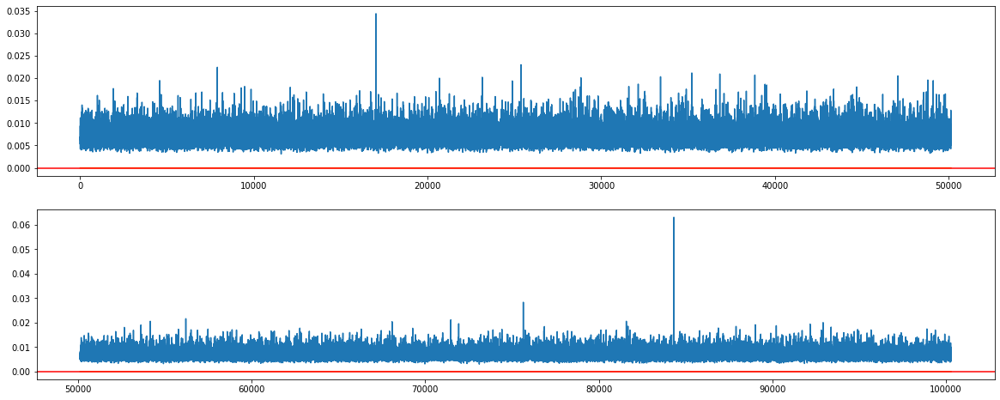

In [56]:
THRESHOLD = 0
check_graph(T_ANOMALY_SCORE, T_CHECK_ATT, piece=2, THRESHOLD=THRESHOLD)

In [67]:
pd.DataFrame(T_CHECK_DIST).shape

(100288, 86)

In [68]:
pd.DataFrame(T_CHECK_DIST).head()

,0,1,2,3,4,5,6,7,8,9,...,76,77,78,79,80,81,82,83,84,85
0,0.029844,0.000004,0.002348,0.002254,0.007828,0.029719,0.000174,0.011749,0.000024,0.000002,...,0.005536,0.000425,0.008186,0.000268,0.016170,0.000011,0.000162,0.001206,0.000009,0.006280
1,0.006110,0.000131,0.001018,0.002902,0.003964,0.001796,0.005322,0.004831,0.000172,0.000186,...,0.008508,0.001311,0.006741,0.000799,0.009258,0.000111,0.012639,0.000458,0.000152,0.007784
2,0.013743,0.000076,0.000493,0.027911,0.019442,0.021413,0.010134,0.001596,0.000069,0.000129,...,0.017326,0.000235,0.001045,0.018435,0.013533,0.000097,0.010926,0.000170,0.000129,0.001153
3,0.005333,0.000048,0.001880,0.007615,0.003522,0.006070,0.011651,0.000562,0.000008,0.000004,...,0.007254,0.000972,0.006531,0.001636,0.001801,0.000063,0.009032,0.000368,0.000038,0.008278
4,0.005437,0.000010,0.002096,0.021681,0.000430,0.013018,0.002942,0.015303,0.000011,0.000011,...,0.008173,0.001078,0.006397,0.003654,0.008003,0.000031,0.007630,0.001281,0.000028,0.011694


In [69]:
pd.DataFrame(T_CHECK_DIST)[0]

0         0.029844
1         0.006110
2         0.013743
3         0.005333
4         0.005437
            ...   
100283    0.018271
100284    0.014660
100285    0.018944
100286    0.003052
100287    0.004397
Name: 0, Length: 100288, dtype: float32

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py'>

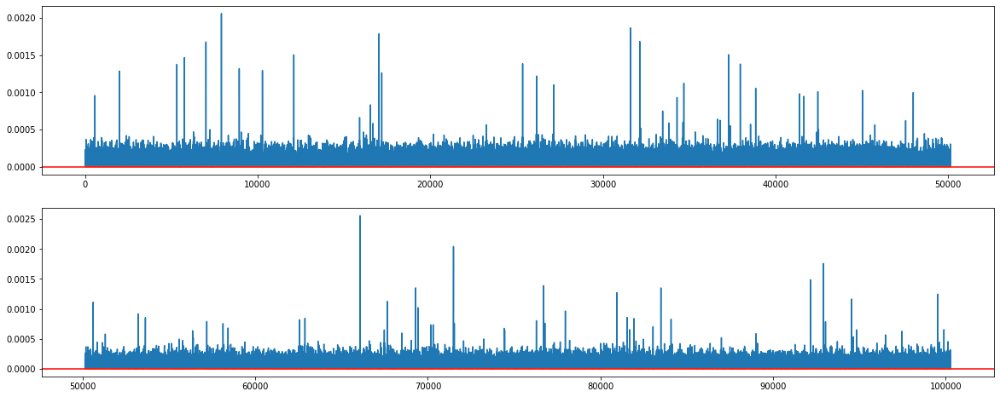

In [73]:
T_CHECK_DIST = pd.DataFrame(T_CHECK_DIST)
T_ANOMALY_SCORE = T_CHECK_DIST[1].to_numpy()
check_graph(T_ANOMALY_SCORE, T_CHECK_ATT, piece=2, THRESHOLD=THRESHOLD)

plotting col 0


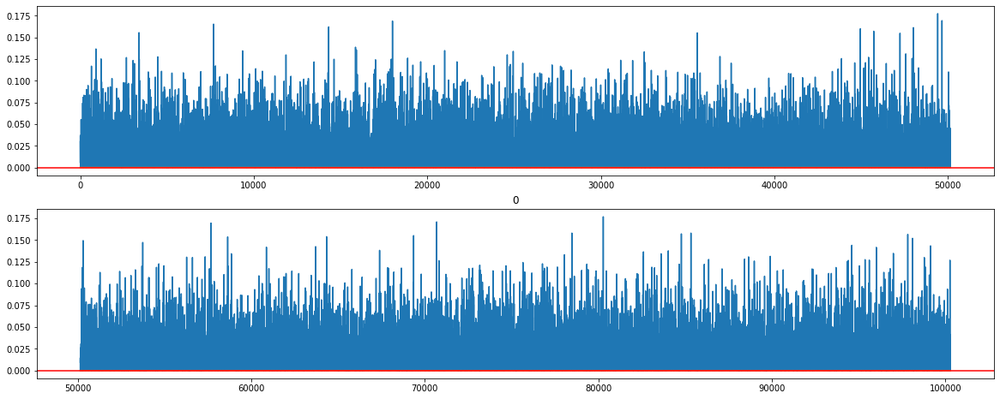

-------------------------------------------
plotting col 1


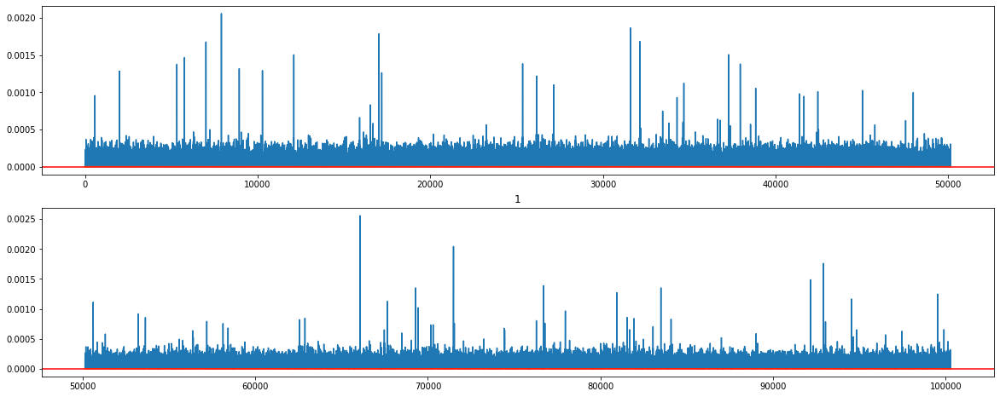

-------------------------------------------
plotting col 2


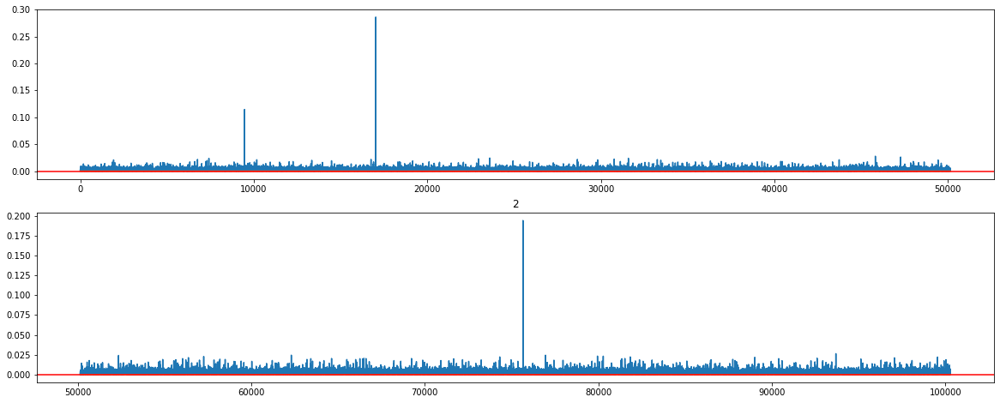

-------------------------------------------
plotting col 3


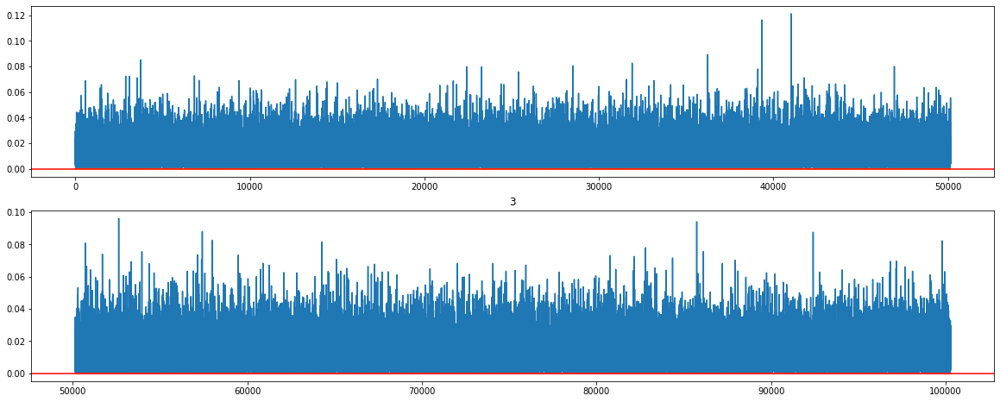

-------------------------------------------
plotting col 4


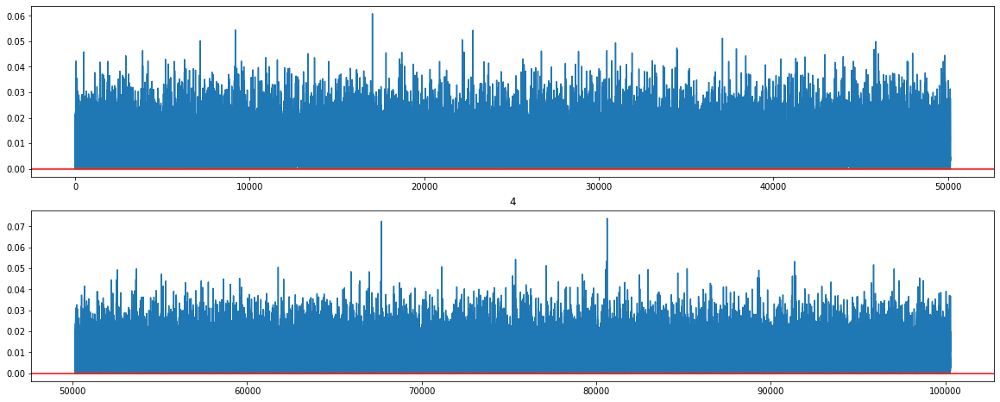

-------------------------------------------
plotting col 5


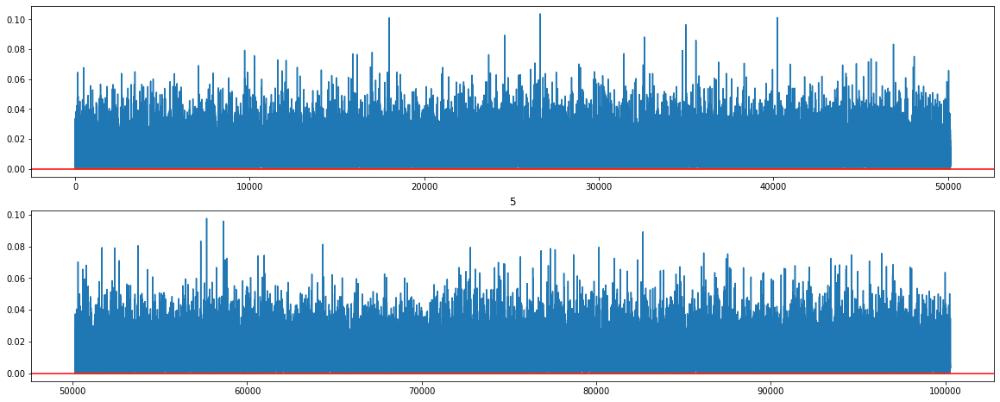

-------------------------------------------
plotting col 6


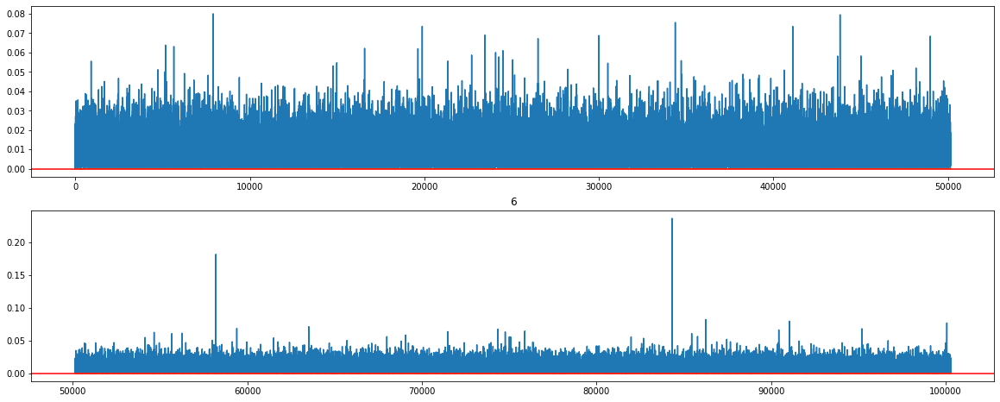

-------------------------------------------
plotting col 7


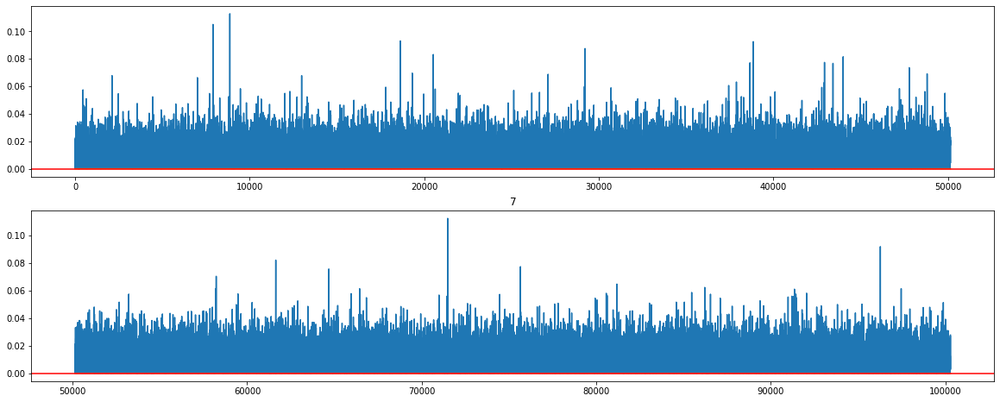

-------------------------------------------
plotting col 8


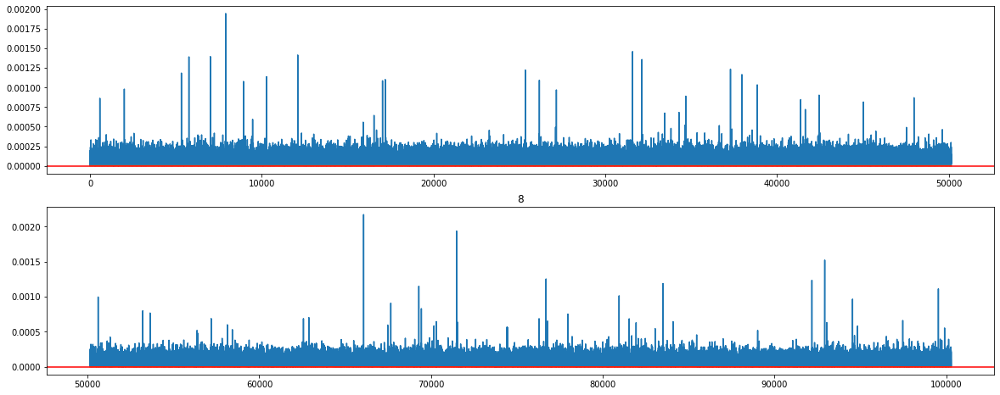

-------------------------------------------
plotting col 9


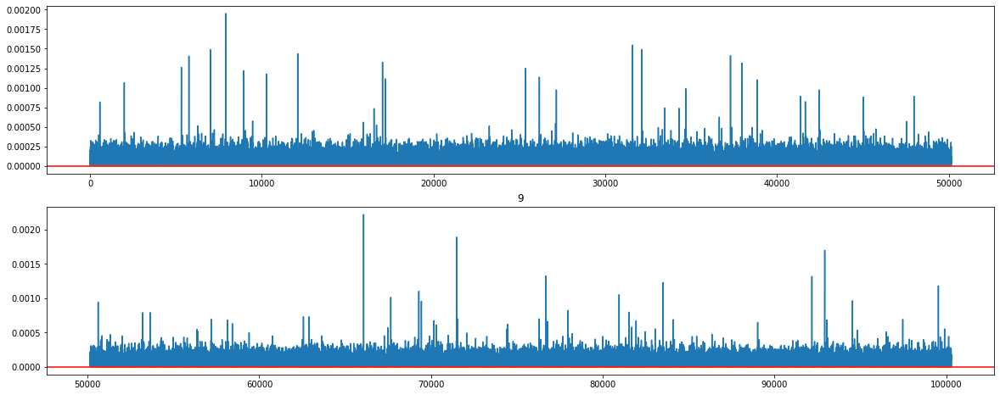

-------------------------------------------
plotting col 10


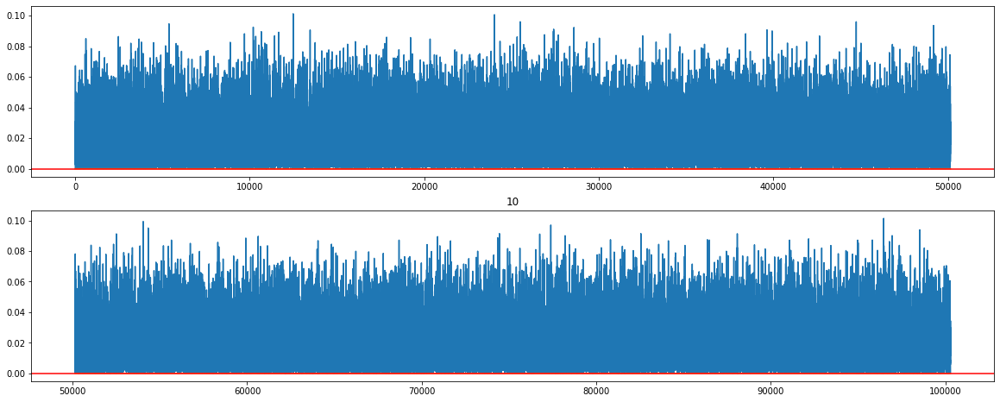

-------------------------------------------
plotting col 11


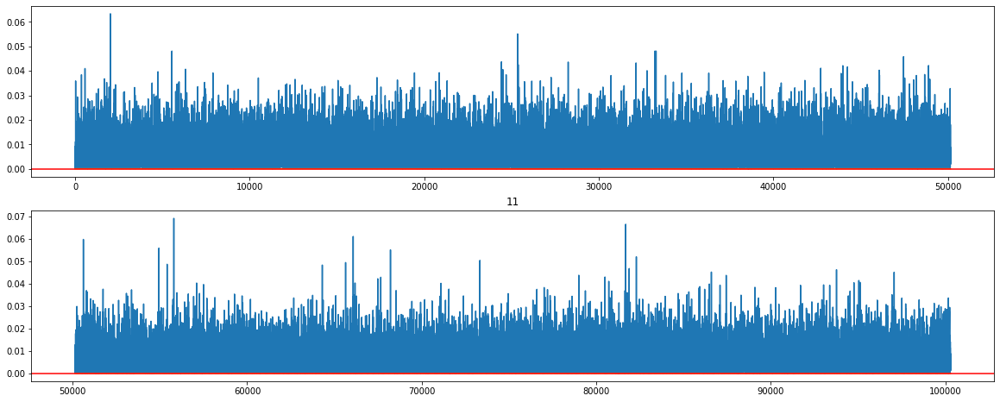

-------------------------------------------
plotting col 12


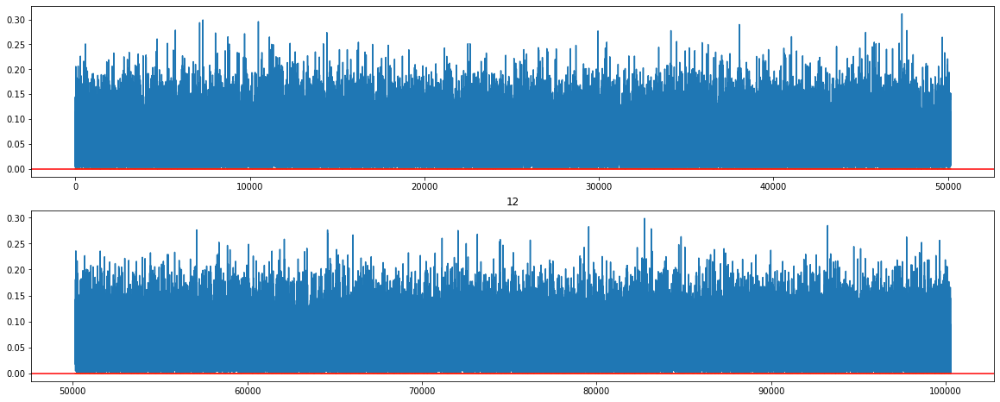

-------------------------------------------
plotting col 13


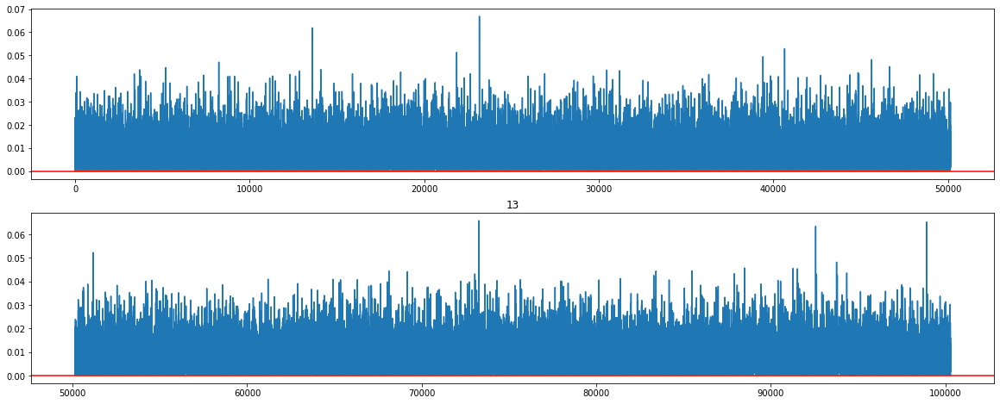

-------------------------------------------
plotting col 14


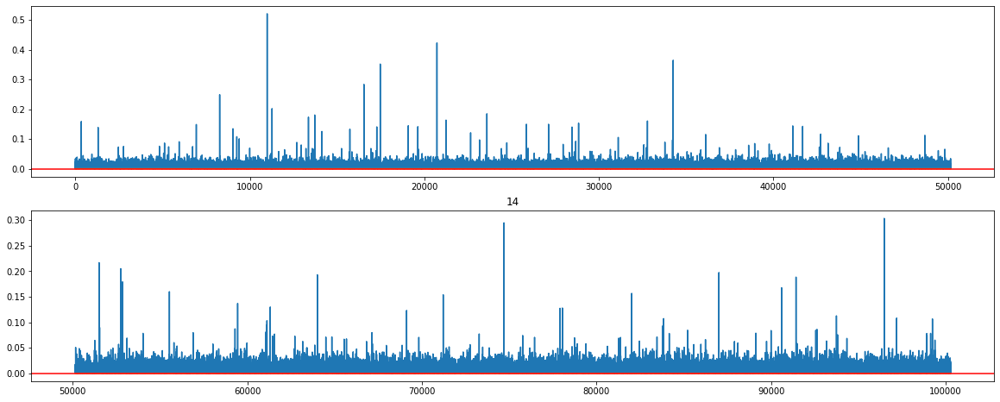

-------------------------------------------
plotting col 15


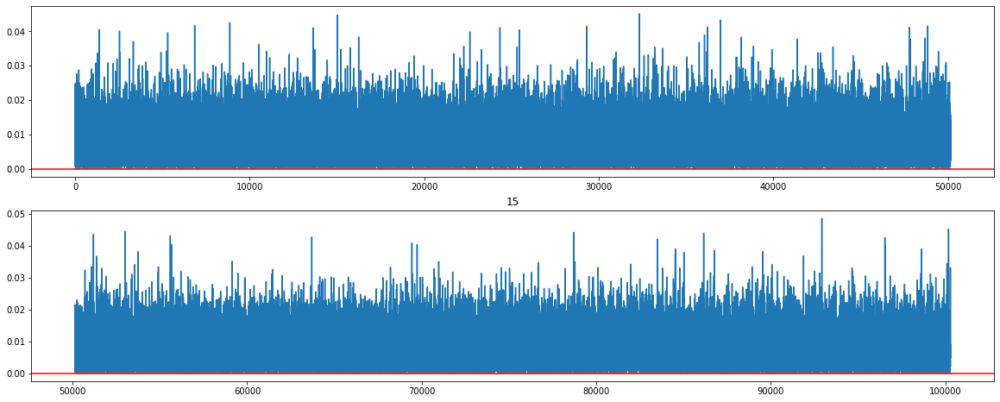

-------------------------------------------
plotting col 16


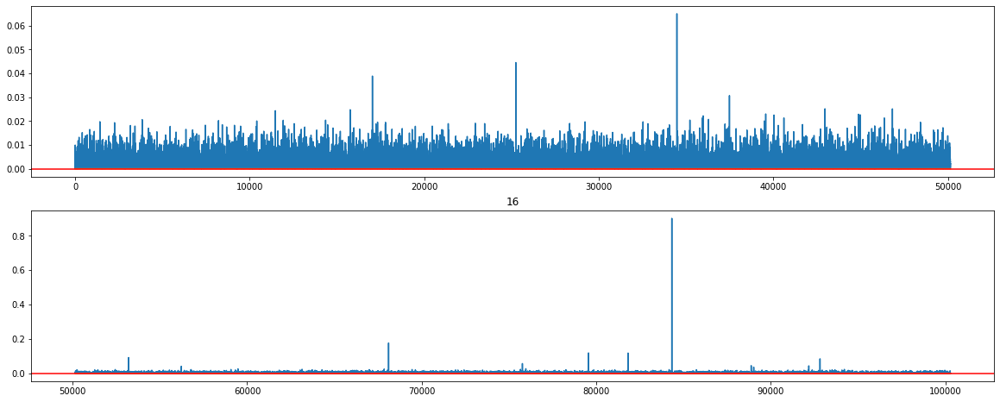

-------------------------------------------
plotting col 17


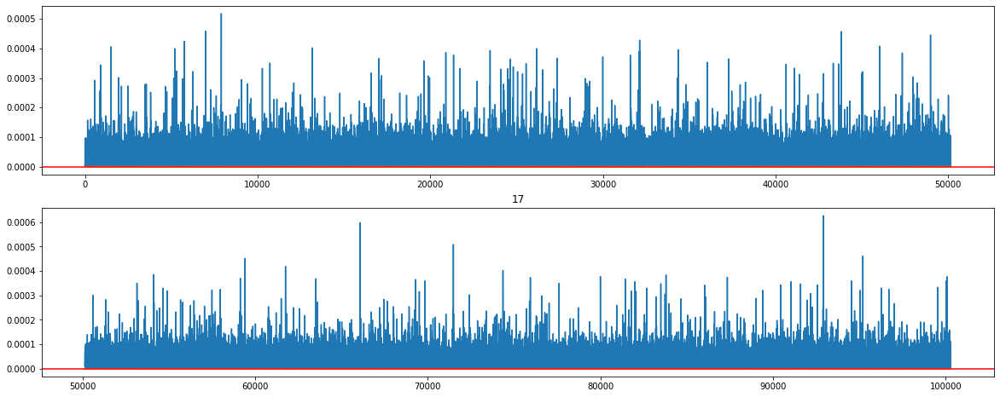

-------------------------------------------
plotting col 18


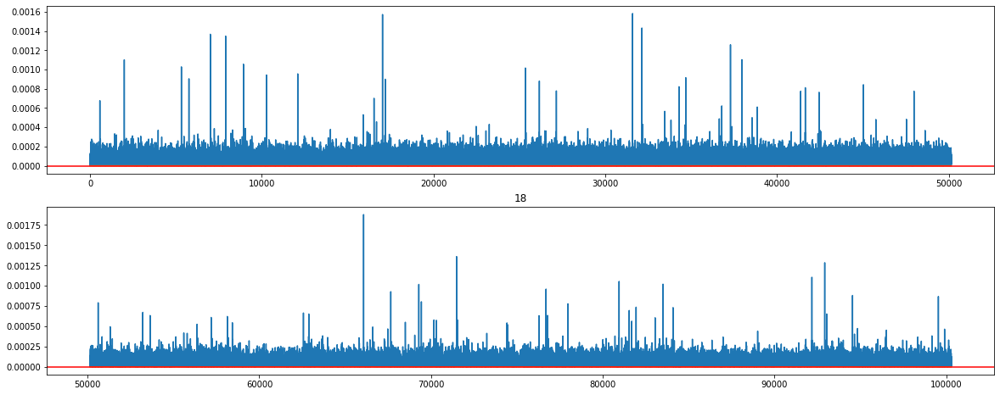

-------------------------------------------
plotting col 19


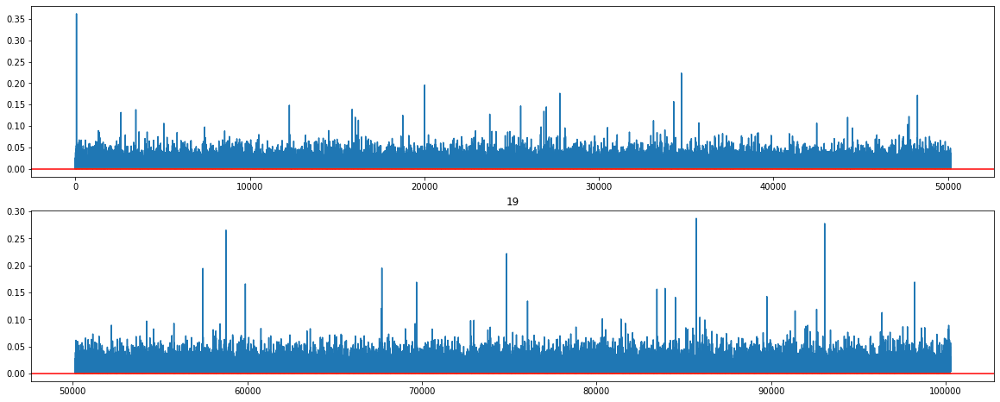

-------------------------------------------
plotting col 20


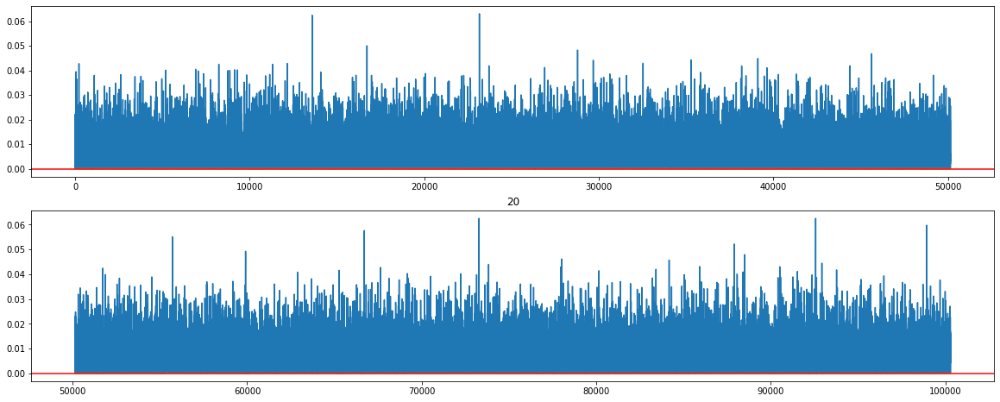

-------------------------------------------
plotting col 21


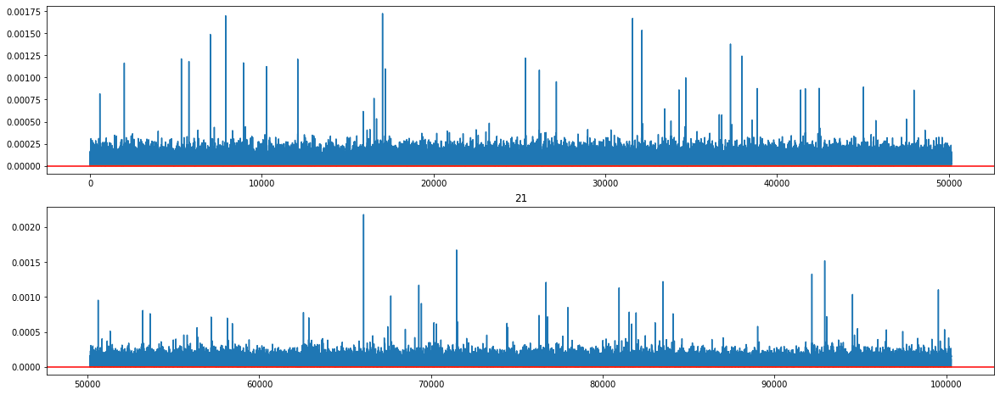

-------------------------------------------
plotting col 22


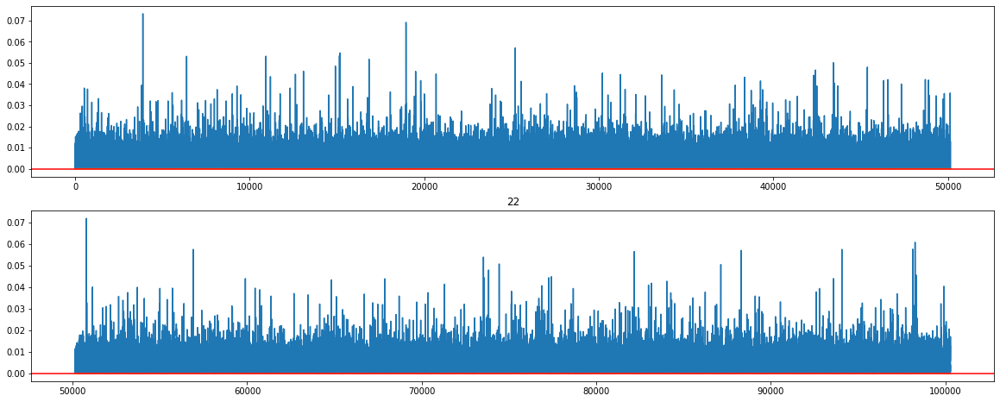

-------------------------------------------
plotting col 23


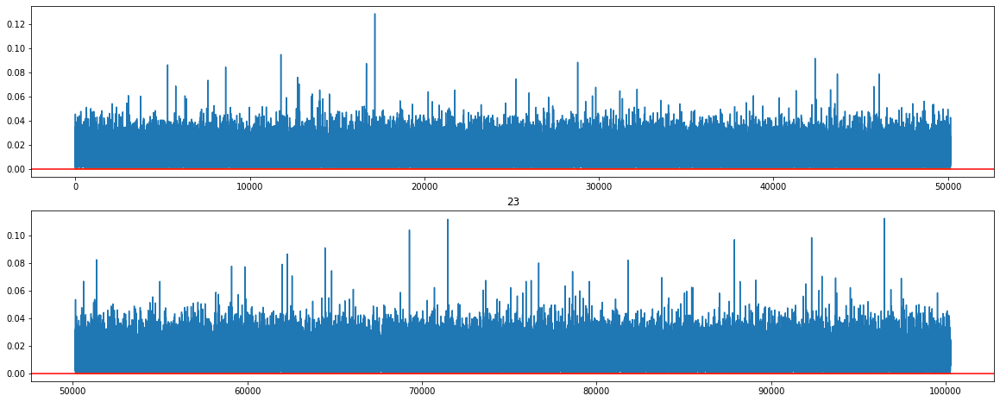

-------------------------------------------
plotting col 24


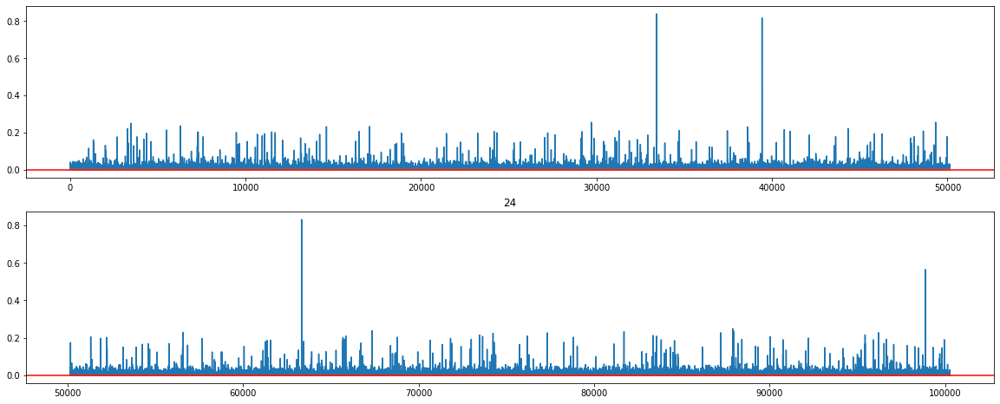

-------------------------------------------
plotting col 25


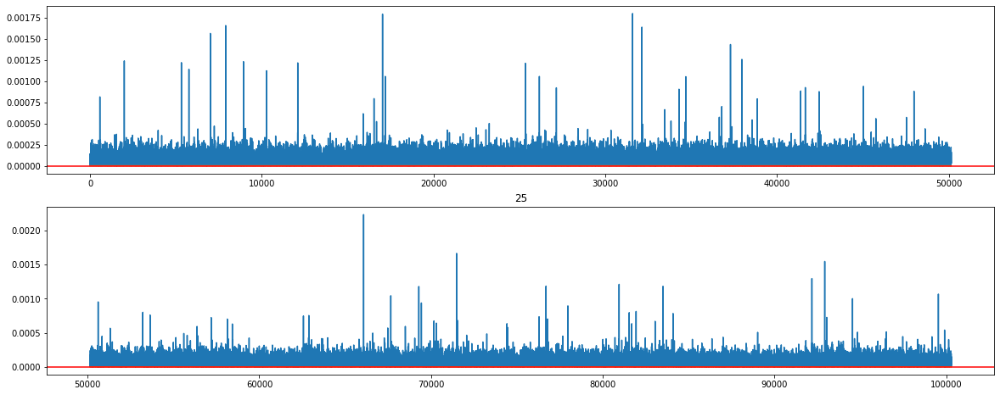

-------------------------------------------
plotting col 26


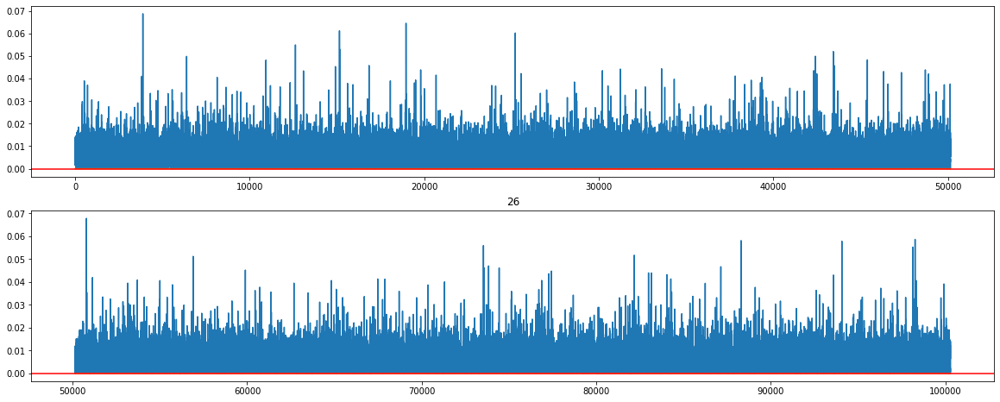

-------------------------------------------
plotting col 27


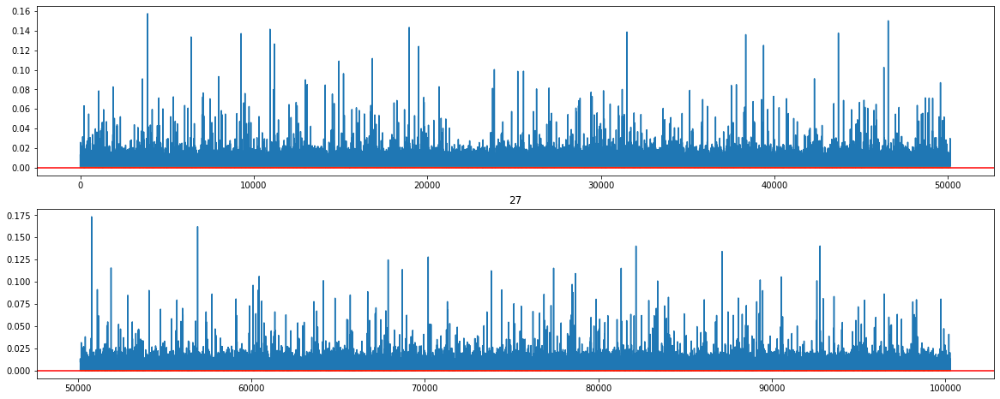

-------------------------------------------
plotting col 28


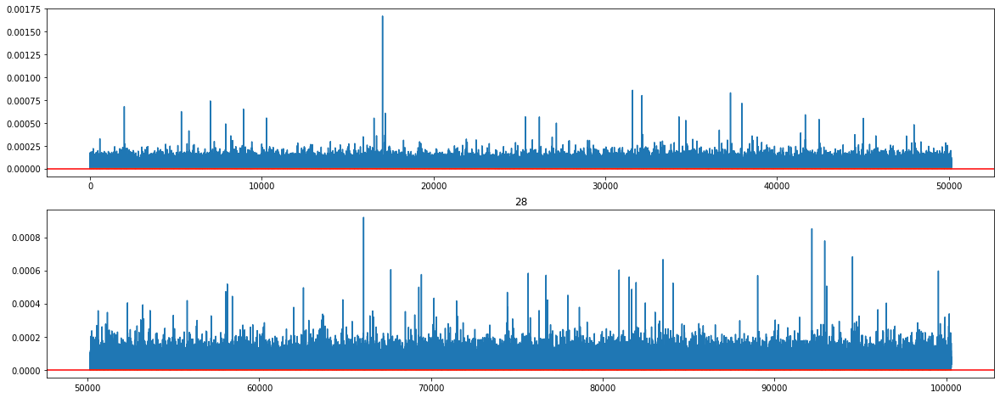

-------------------------------------------
plotting col 29


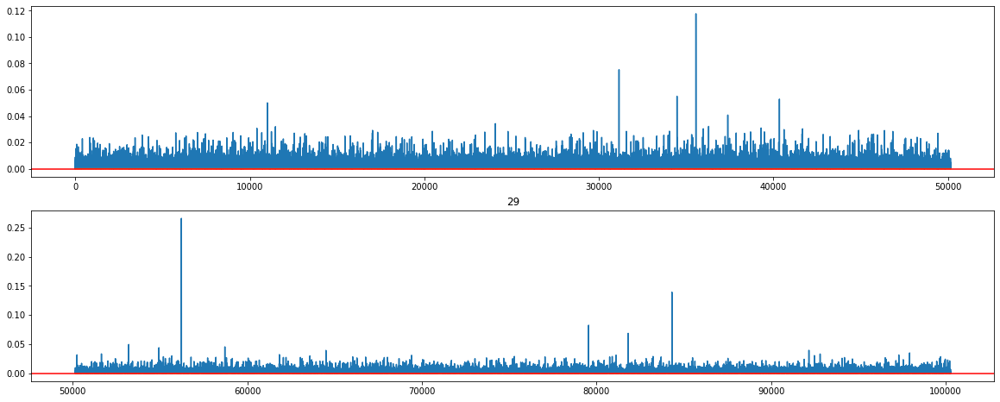

-------------------------------------------
plotting col 30


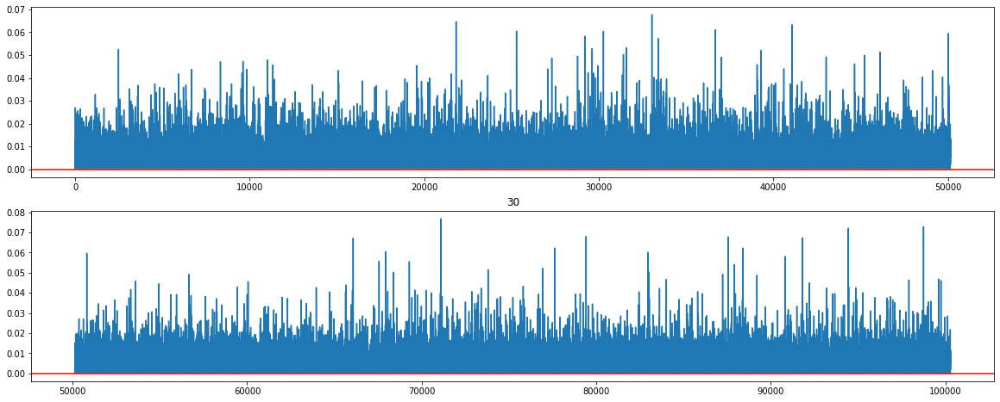

-------------------------------------------
plotting col 31


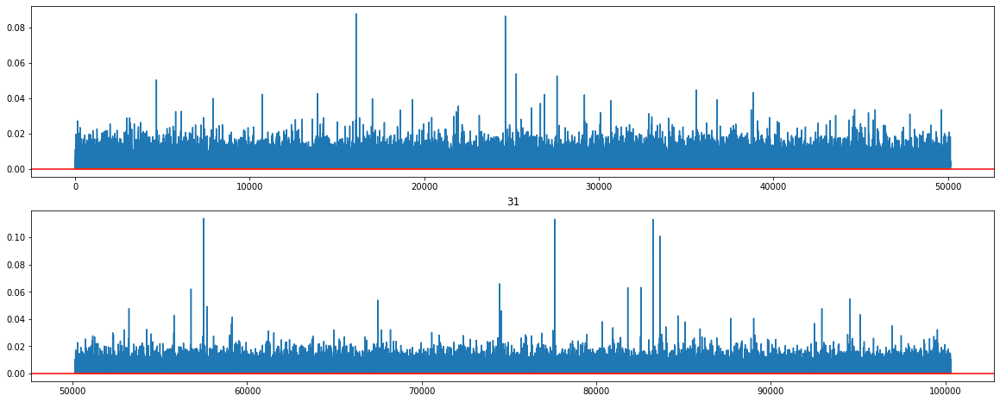

-------------------------------------------
plotting col 32


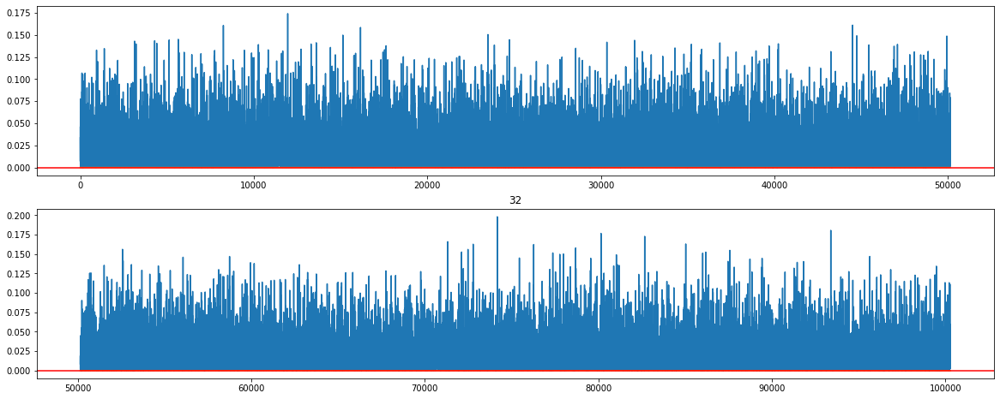

-------------------------------------------
plotting col 33


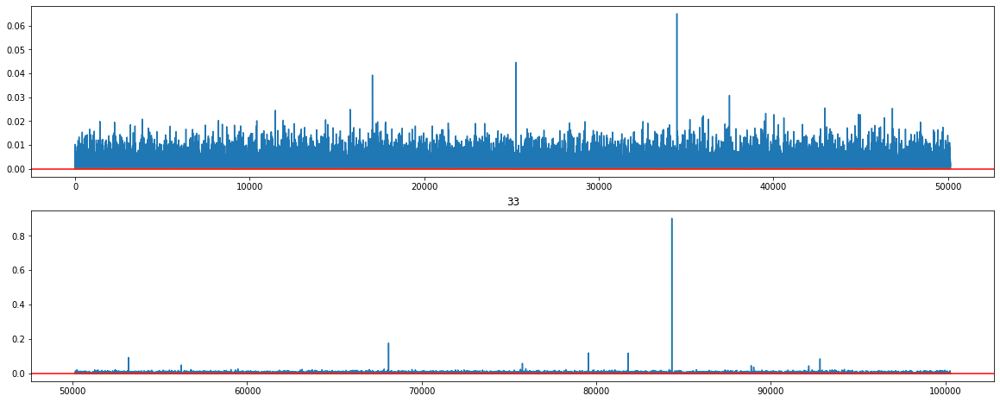

-------------------------------------------
plotting col 34


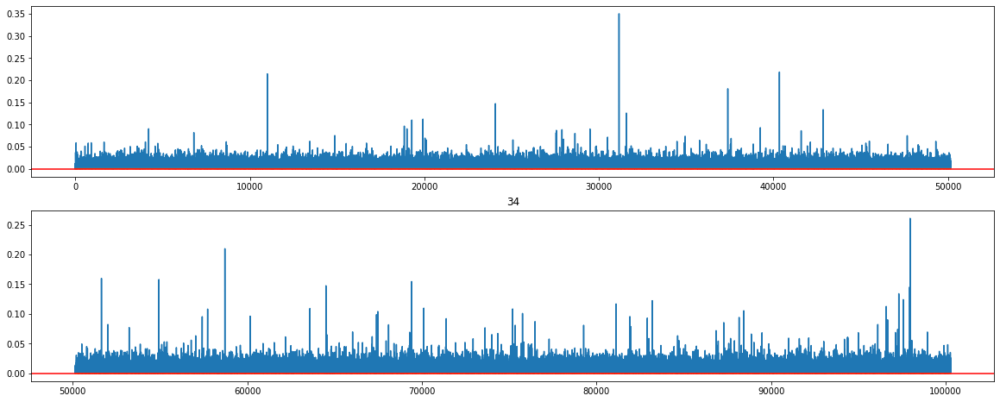

-------------------------------------------
plotting col 35


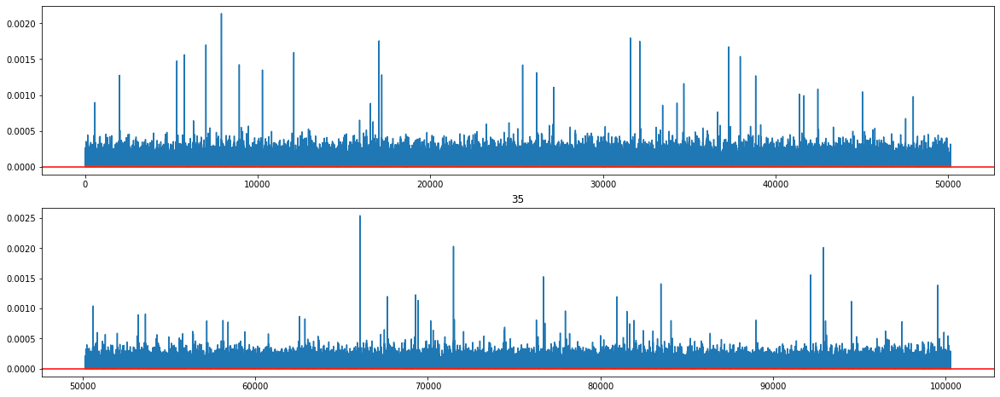

-------------------------------------------
plotting col 36


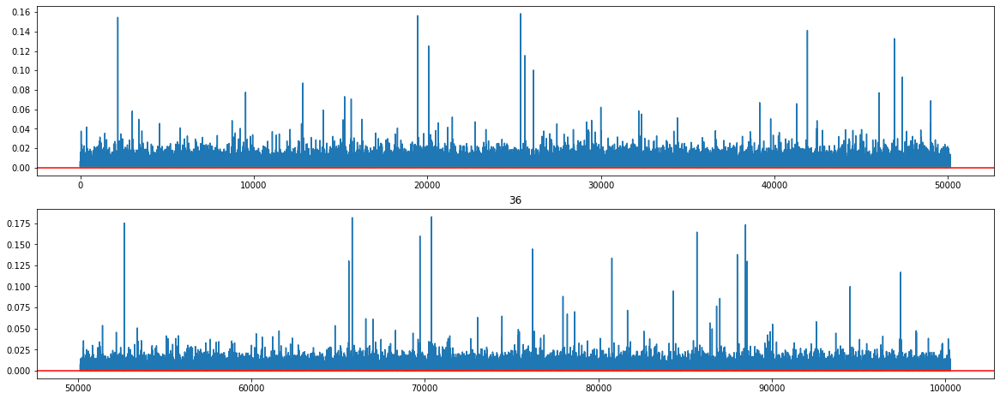

-------------------------------------------
plotting col 37


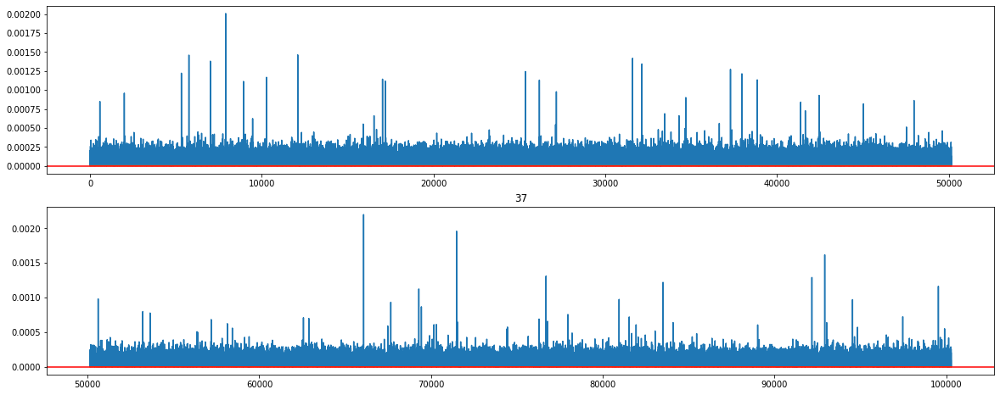

-------------------------------------------
plotting col 38


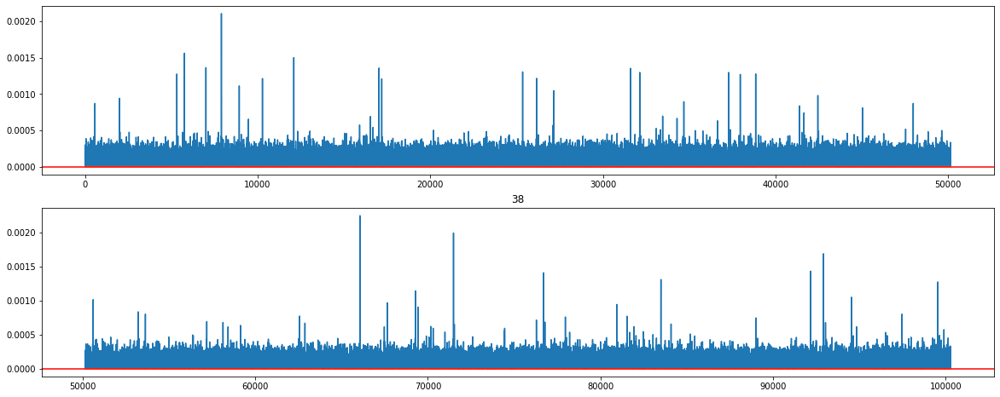

-------------------------------------------
plotting col 39


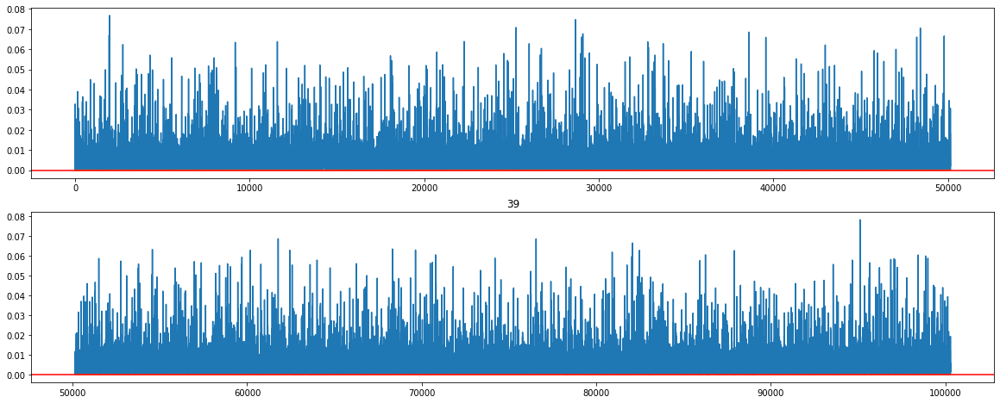

-------------------------------------------
plotting col 40


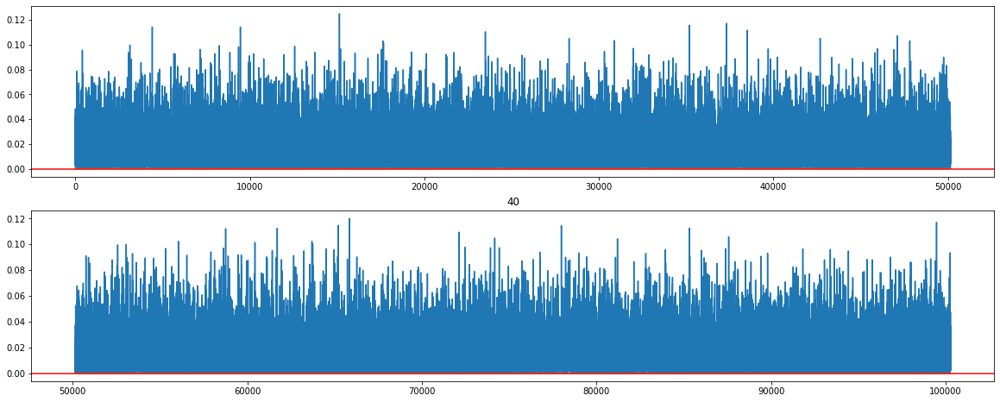

-------------------------------------------
plotting col 41


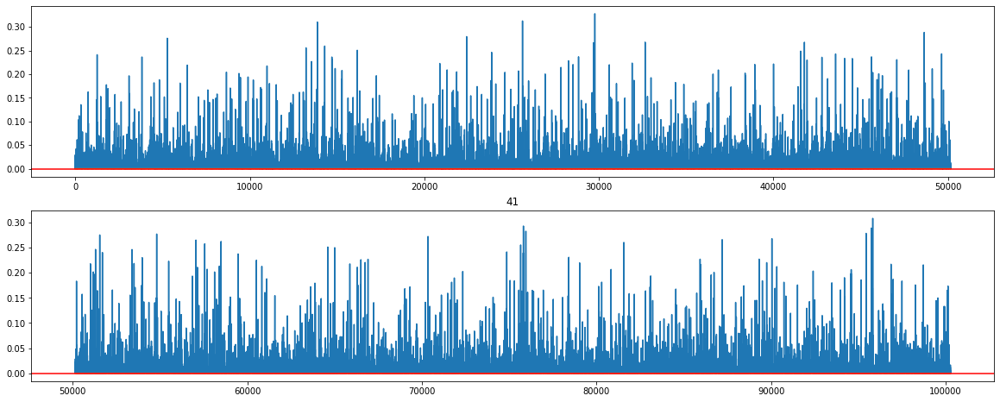

-------------------------------------------
plotting col 42


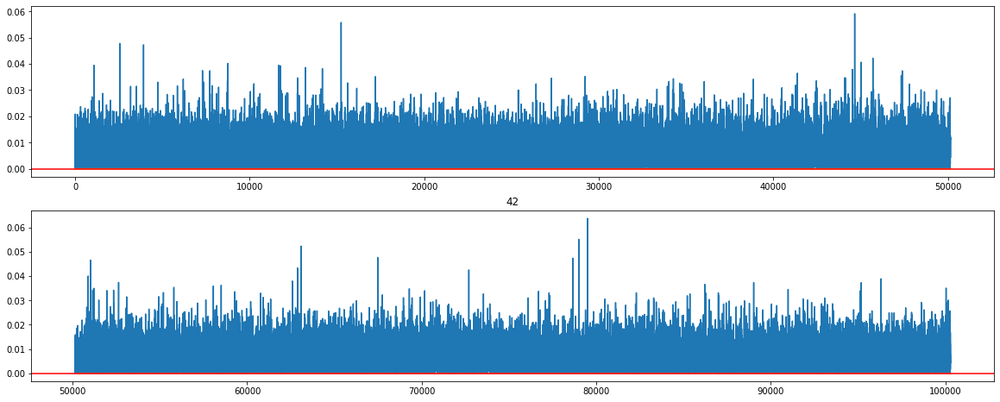

-------------------------------------------
plotting col 43


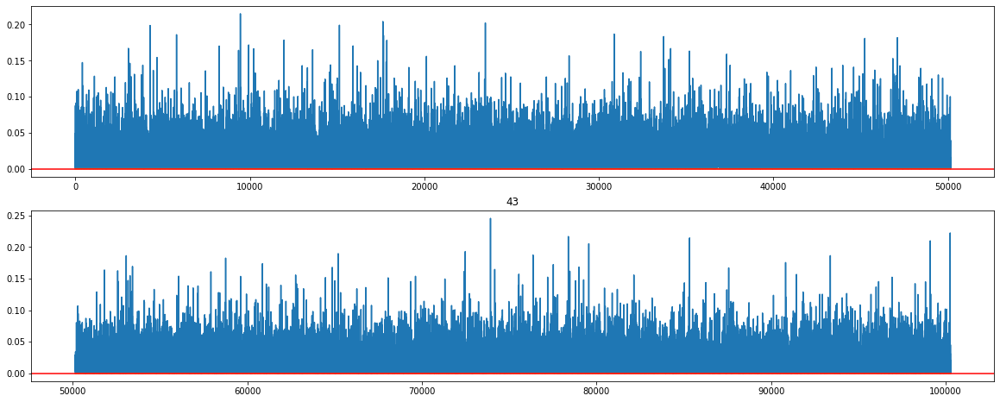

-------------------------------------------
plotting col 44


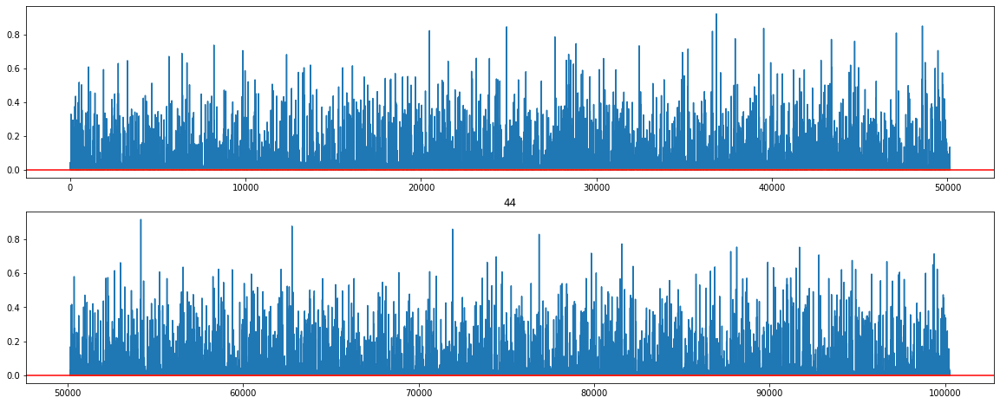

-------------------------------------------
plotting col 45


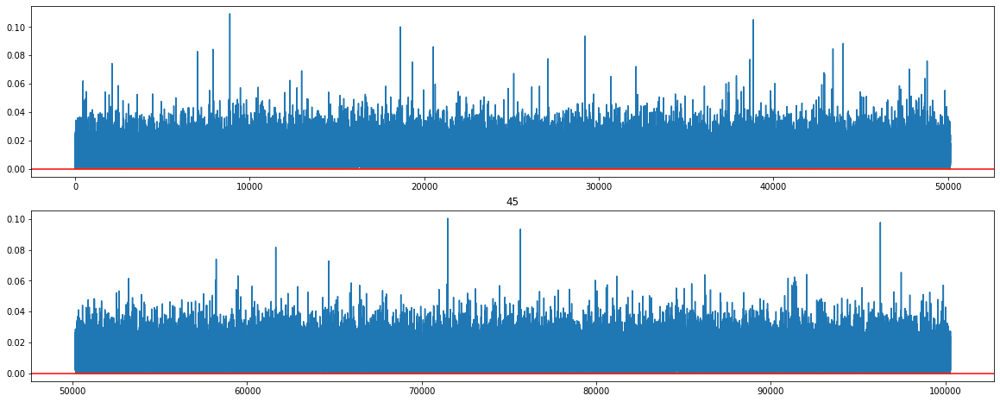

-------------------------------------------
plotting col 46


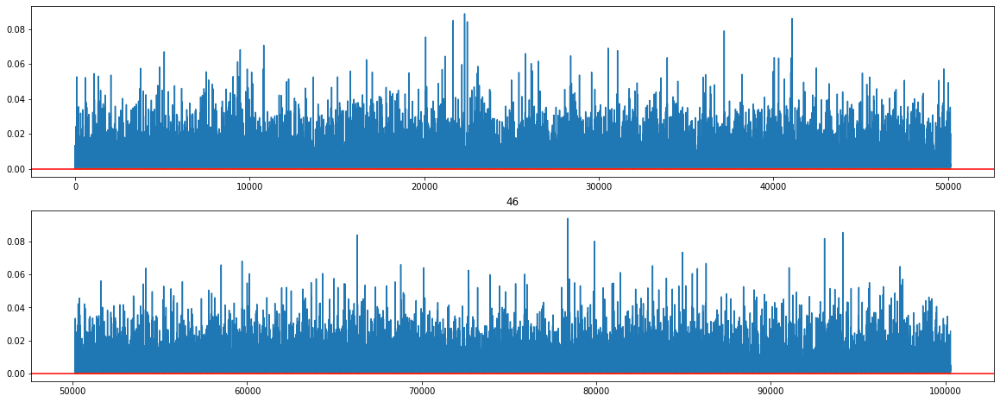

-------------------------------------------
plotting col 47


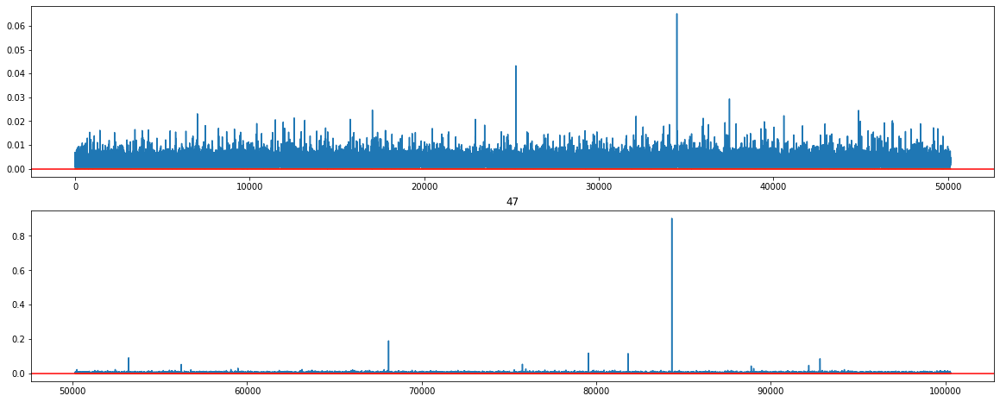

-------------------------------------------
plotting col 48


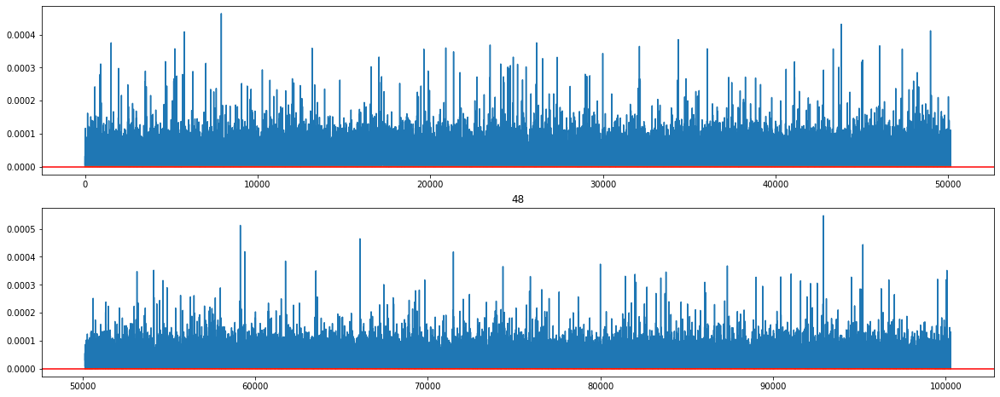

-------------------------------------------
plotting col 49


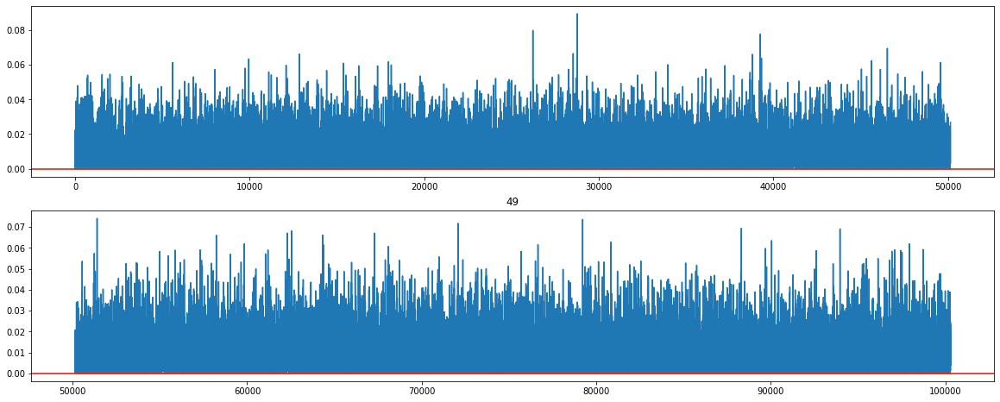

-------------------------------------------
plotting col 50


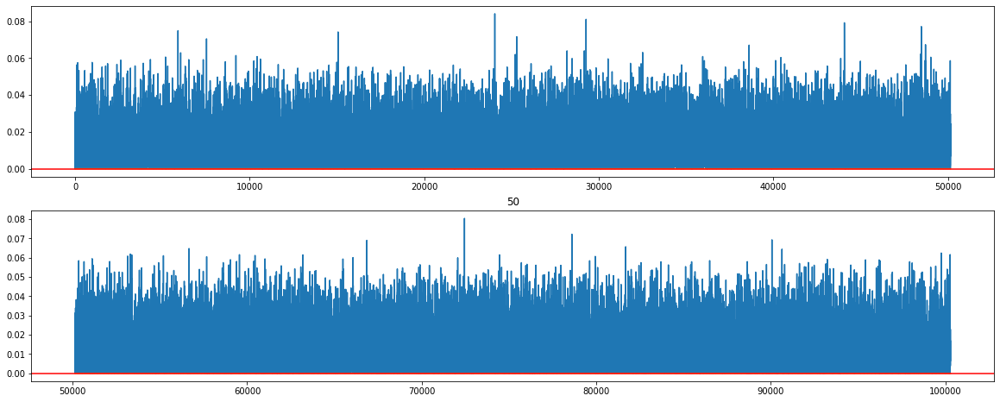

-------------------------------------------
plotting col 51


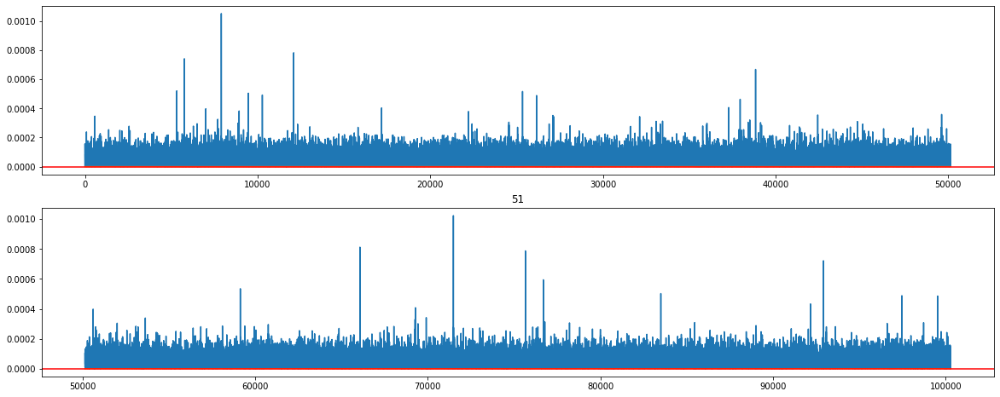

-------------------------------------------
plotting col 52


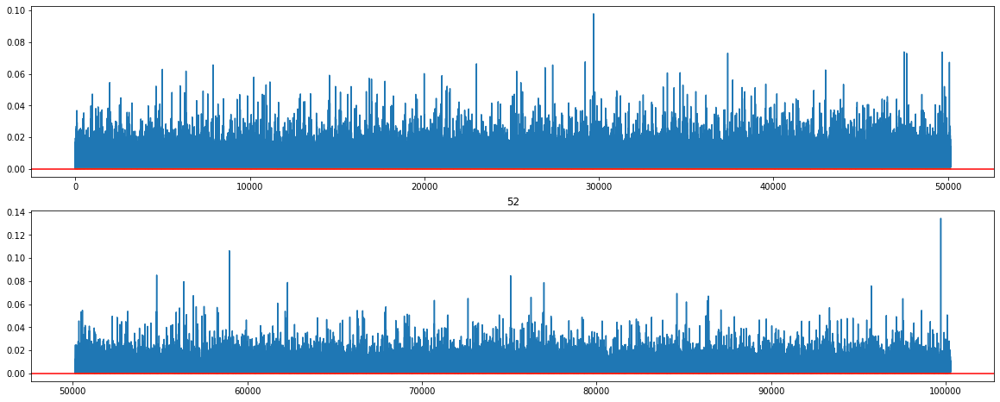

-------------------------------------------
plotting col 53


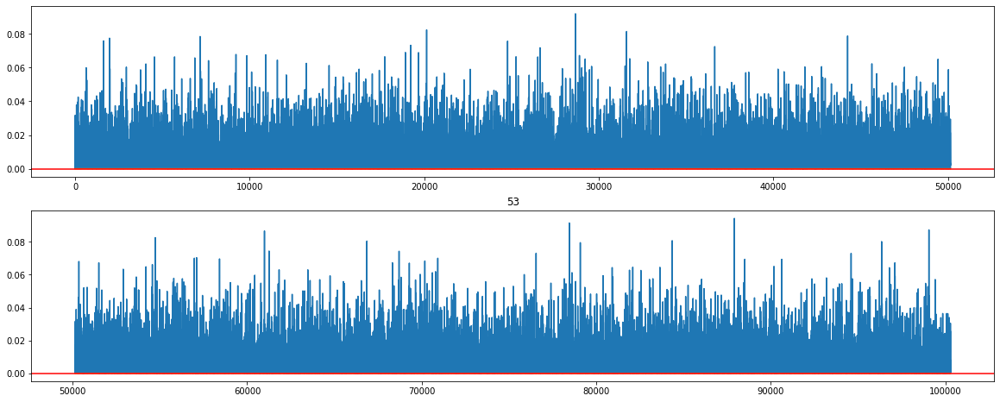

-------------------------------------------
plotting col 54


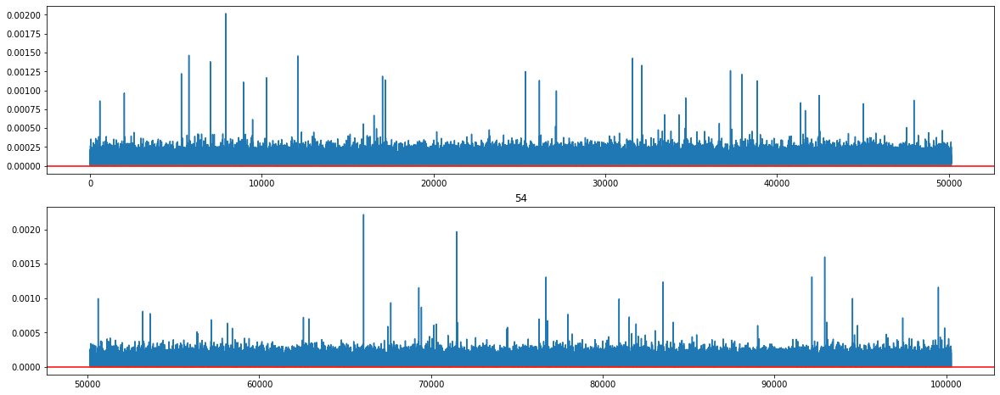

-------------------------------------------
plotting col 55


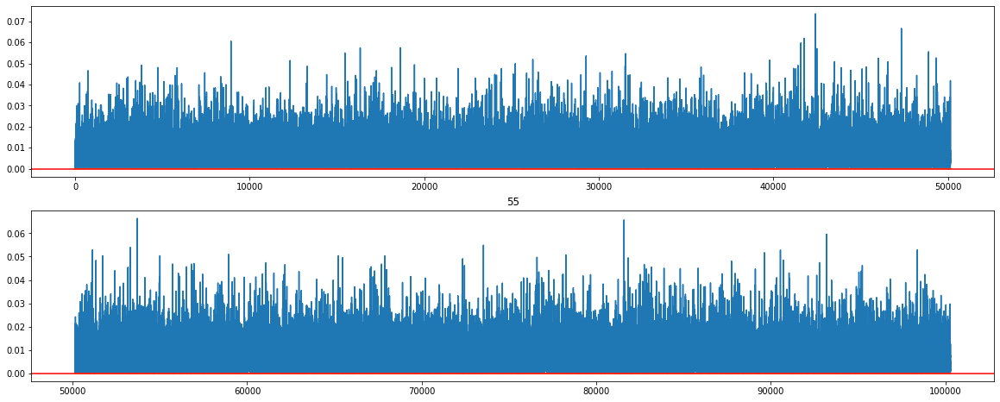

-------------------------------------------
plotting col 56


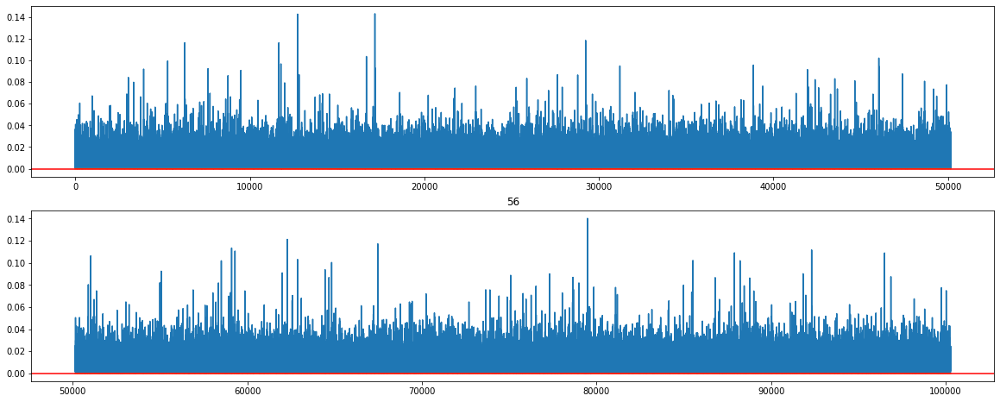

-------------------------------------------
plotting col 57


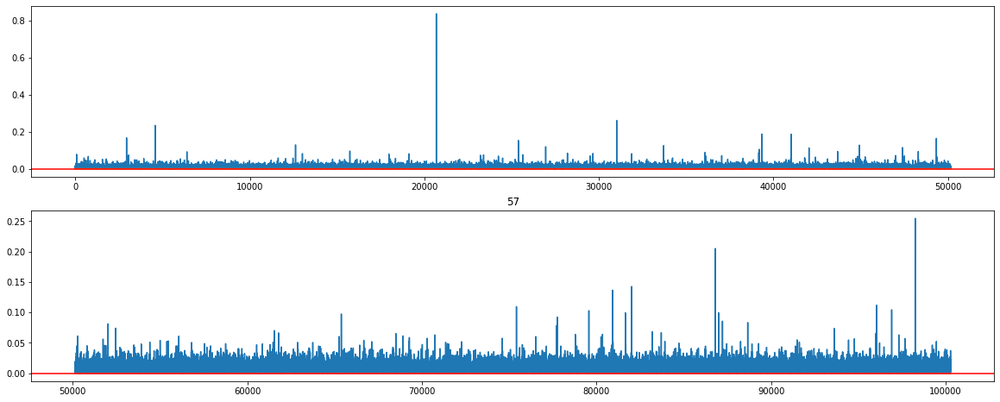

-------------------------------------------
plotting col 58


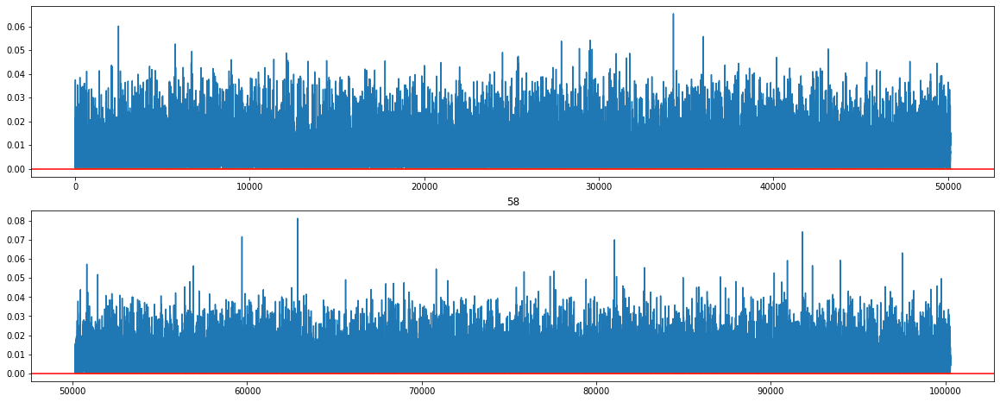

-------------------------------------------
plotting col 59


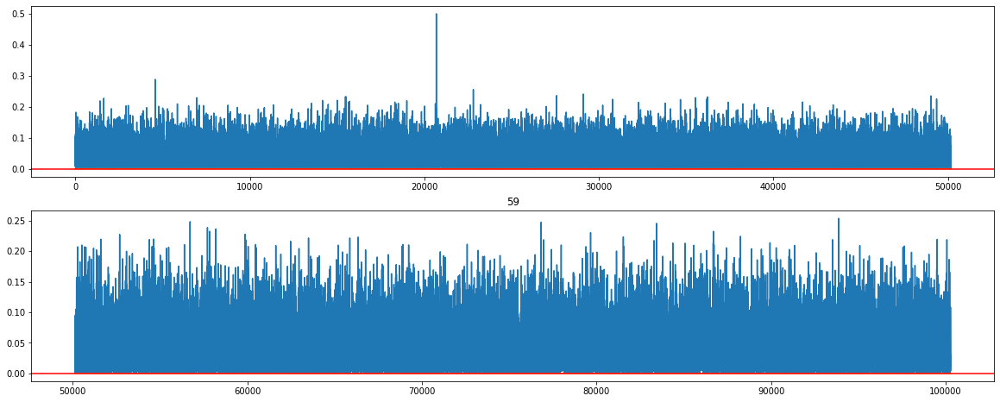

-------------------------------------------
plotting col 60


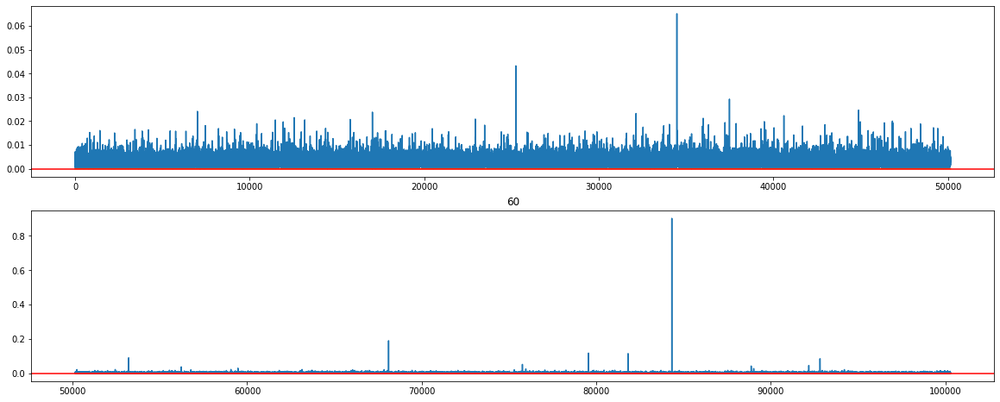

-------------------------------------------
plotting col 61


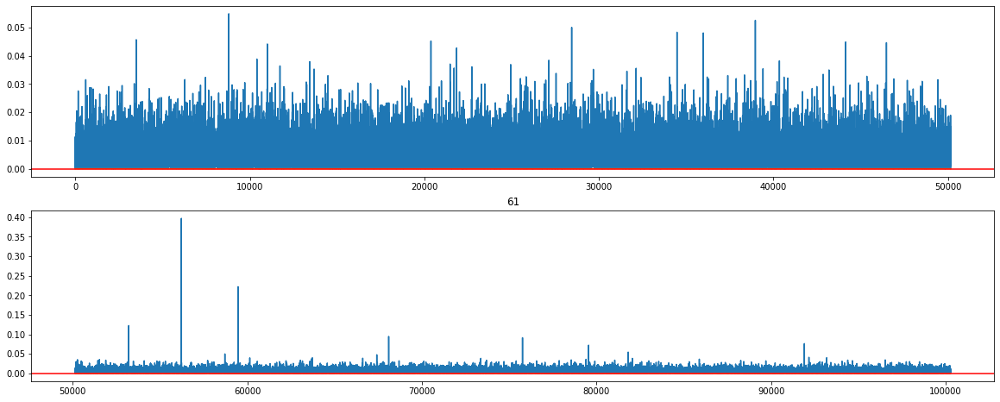

-------------------------------------------
plotting col 62


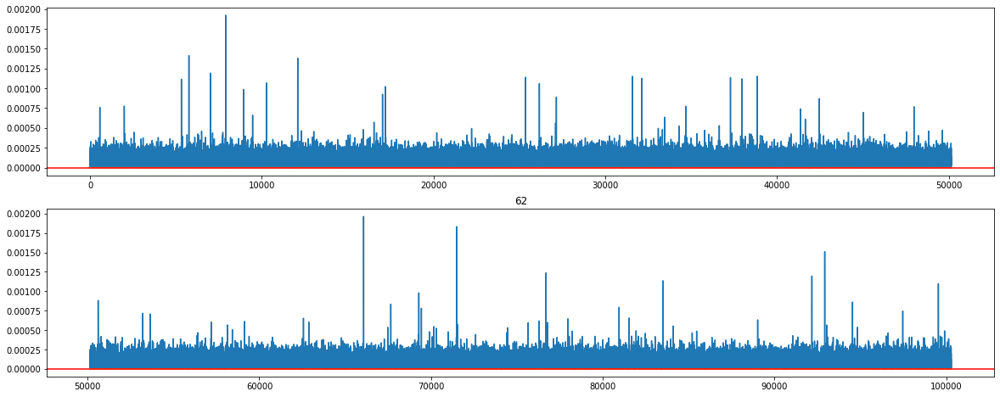

-------------------------------------------
plotting col 63


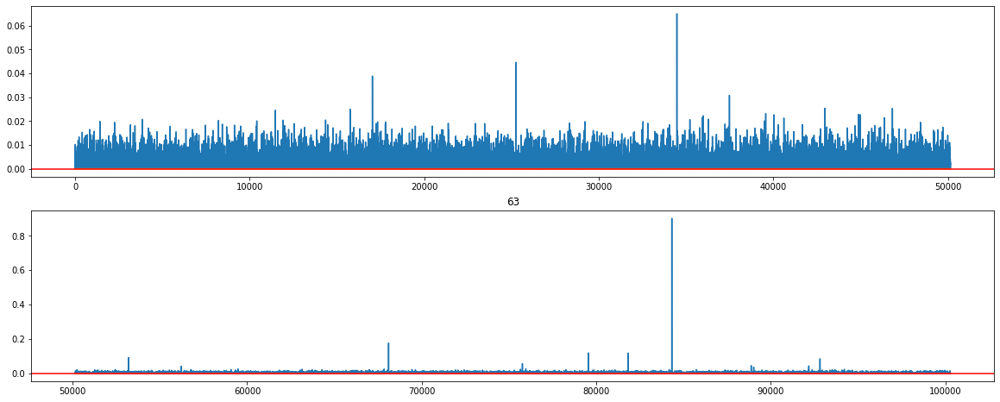

-------------------------------------------
plotting col 64


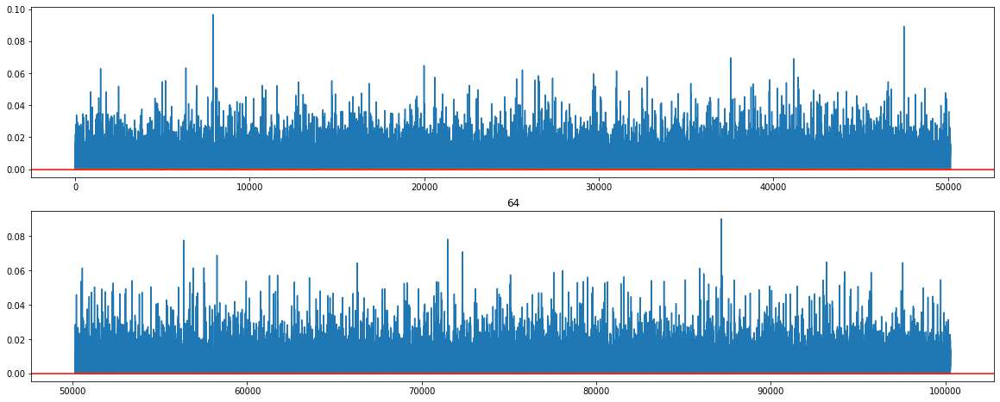

-------------------------------------------
plotting col 65


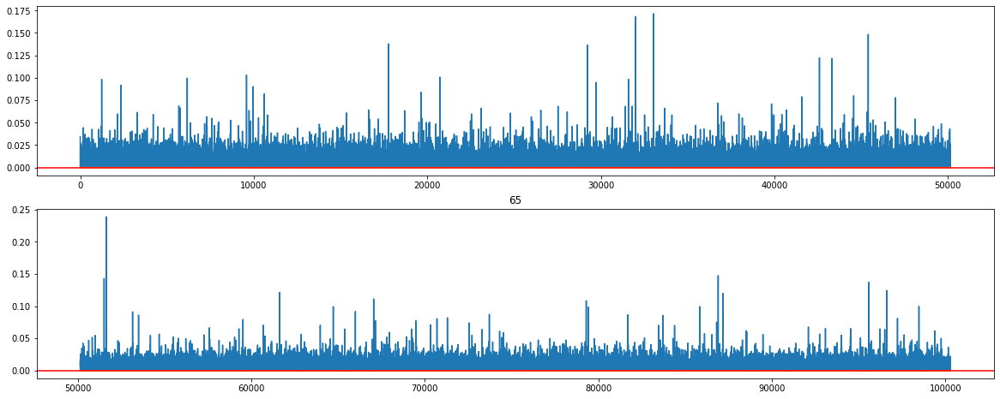

-------------------------------------------
plotting col 66


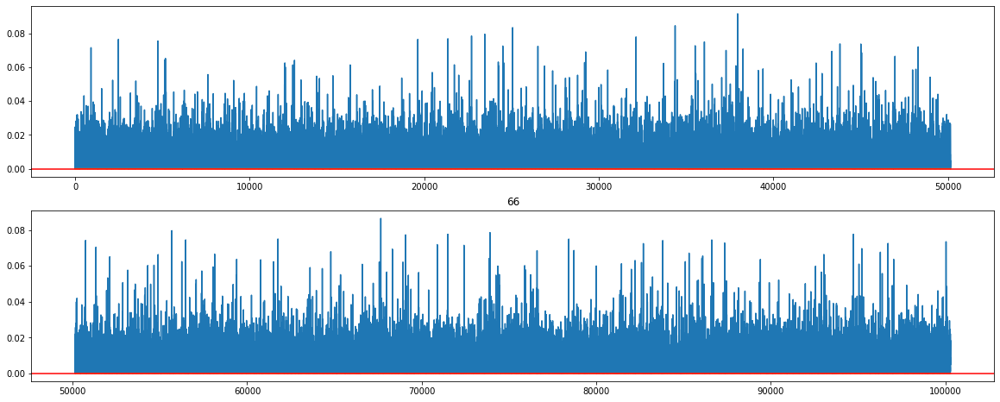

-------------------------------------------
plotting col 67


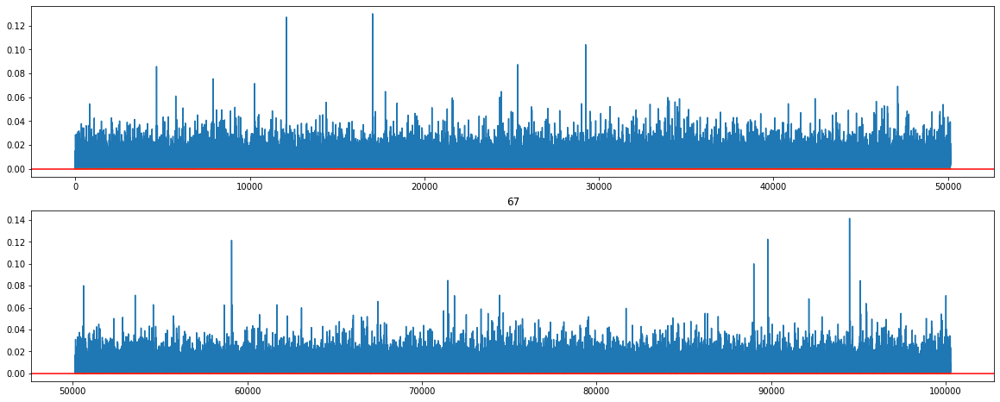

-------------------------------------------
plotting col 68


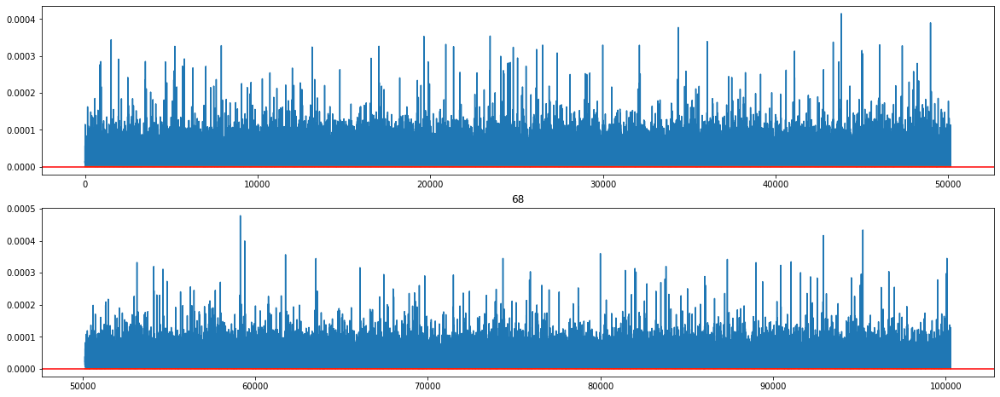

-------------------------------------------
plotting col 69


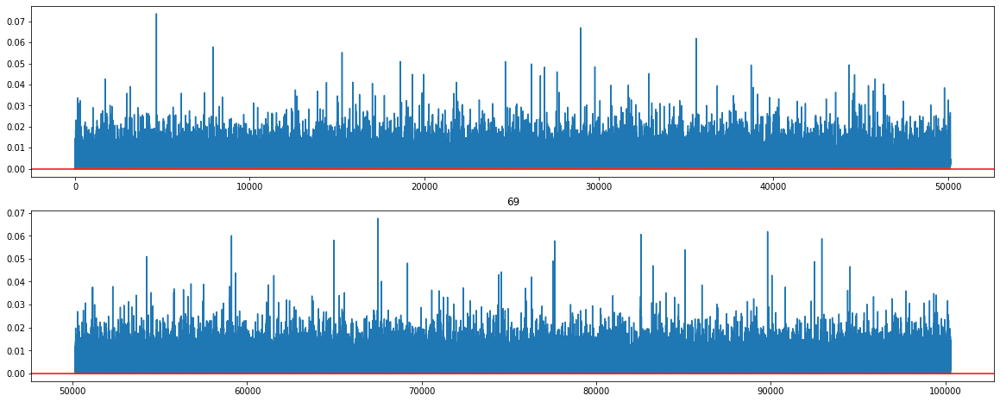

-------------------------------------------
plotting col 70


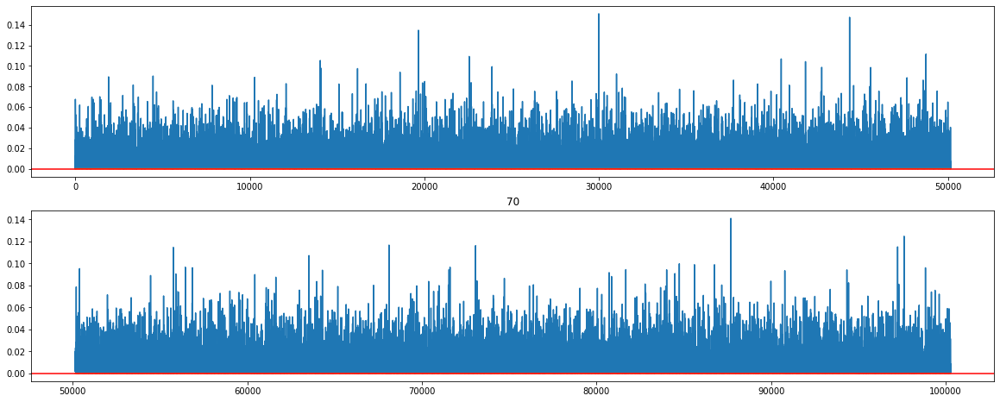

-------------------------------------------
plotting col 71


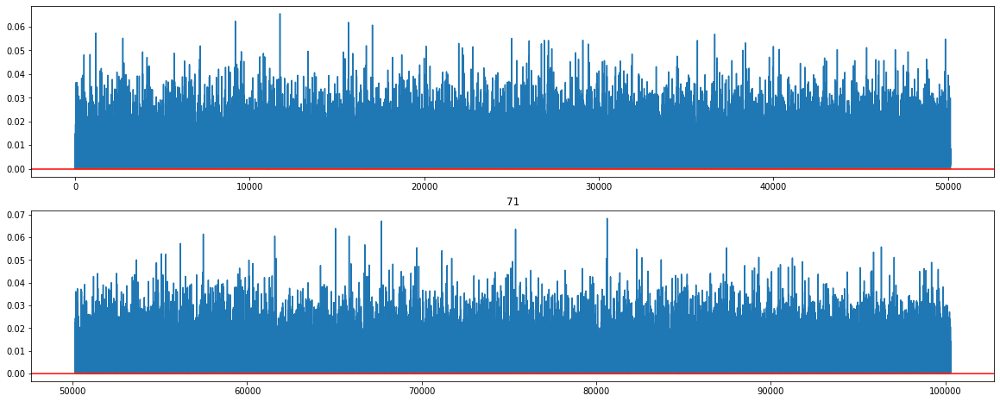

-------------------------------------------
plotting col 72


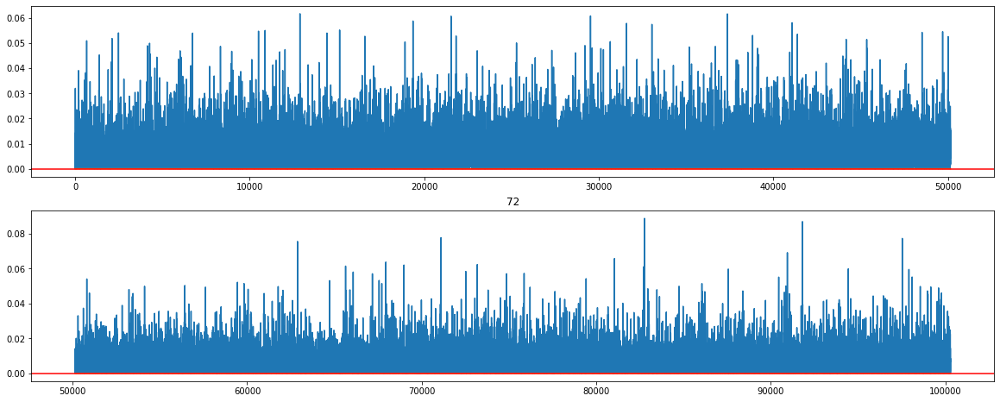

-------------------------------------------
plotting col 73


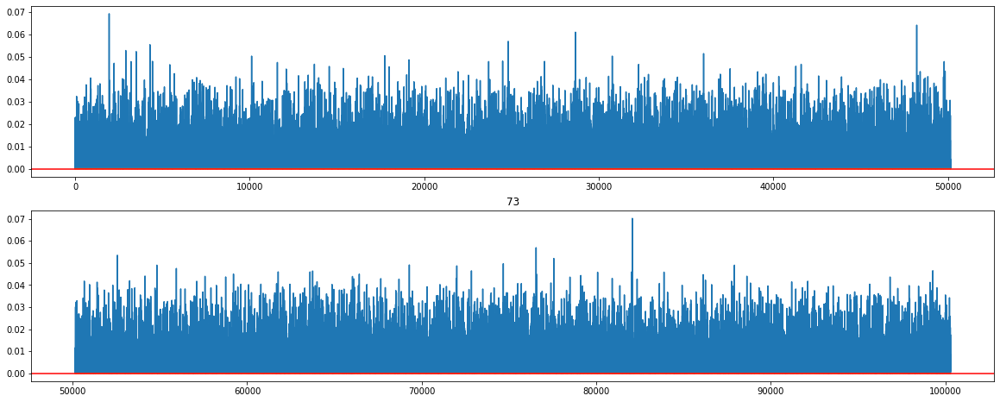

-------------------------------------------
plotting col 74


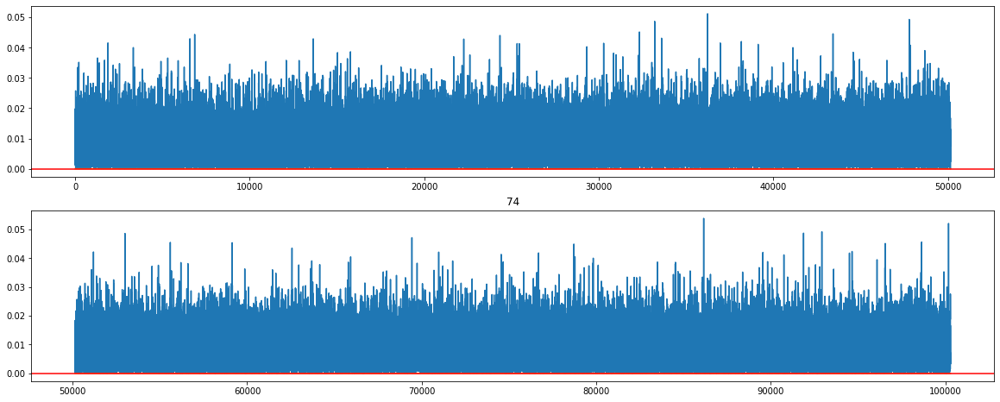

-------------------------------------------
plotting col 75


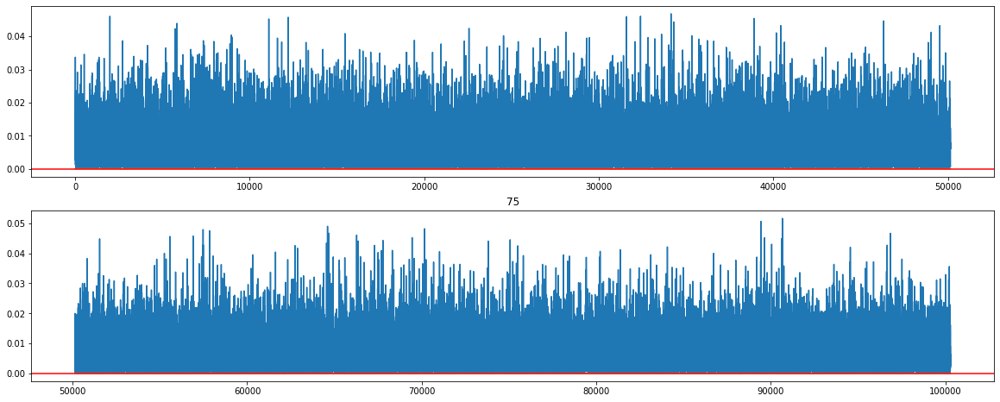

-------------------------------------------
plotting col 76


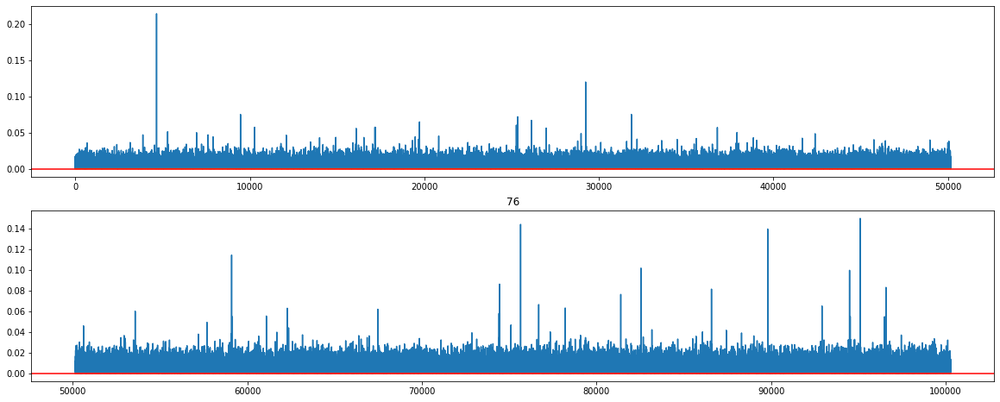

-------------------------------------------
plotting col 77


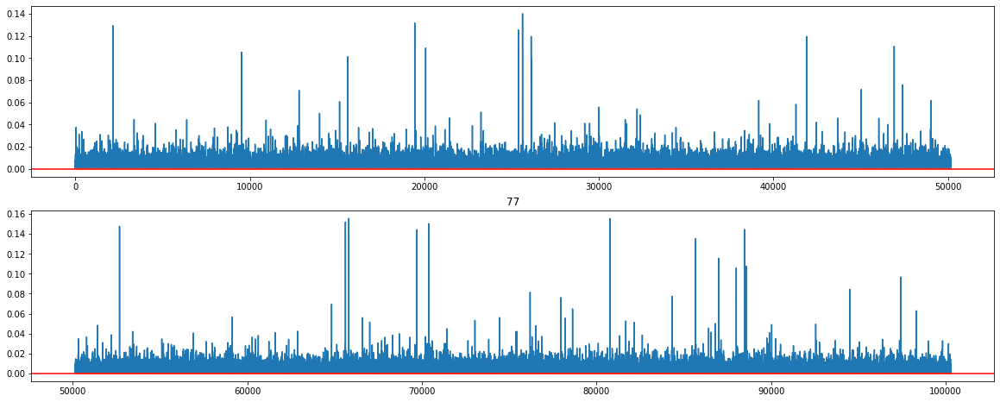

-------------------------------------------
plotting col 78


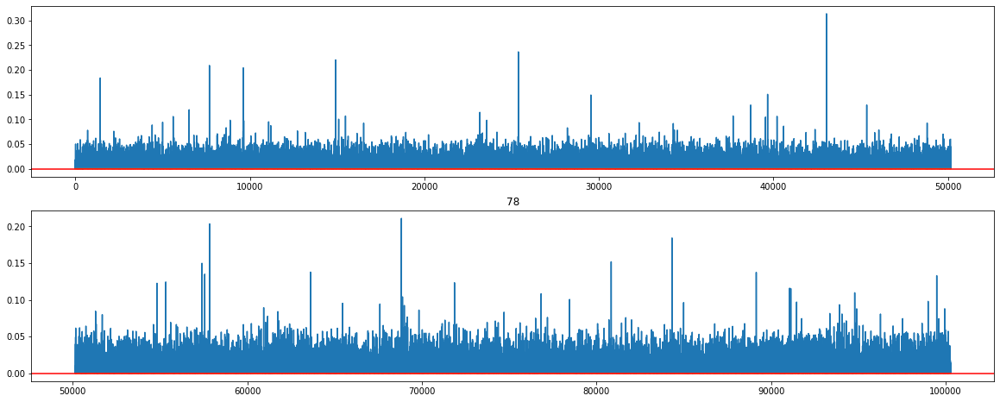

-------------------------------------------
plotting col 79


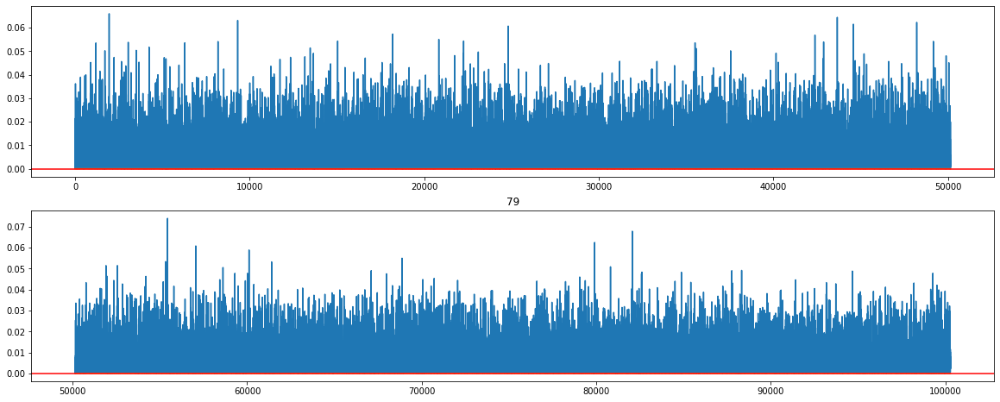

-------------------------------------------
plotting col 80


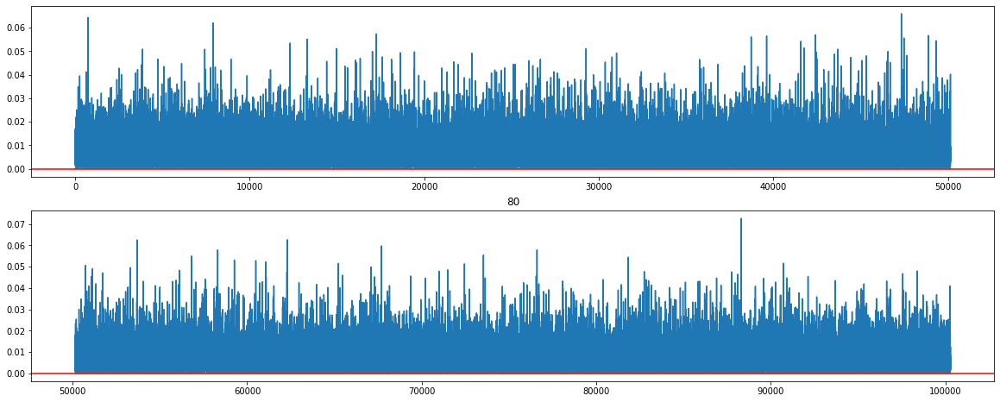

-------------------------------------------
plotting col 81


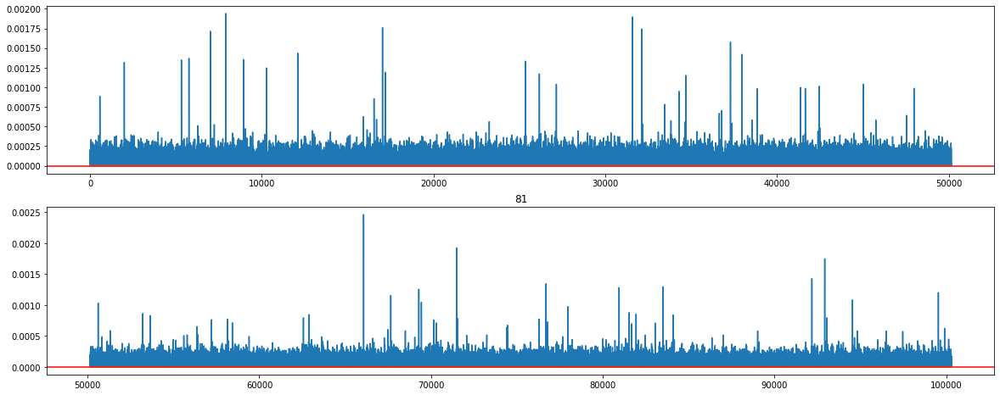

-------------------------------------------
plotting col 82


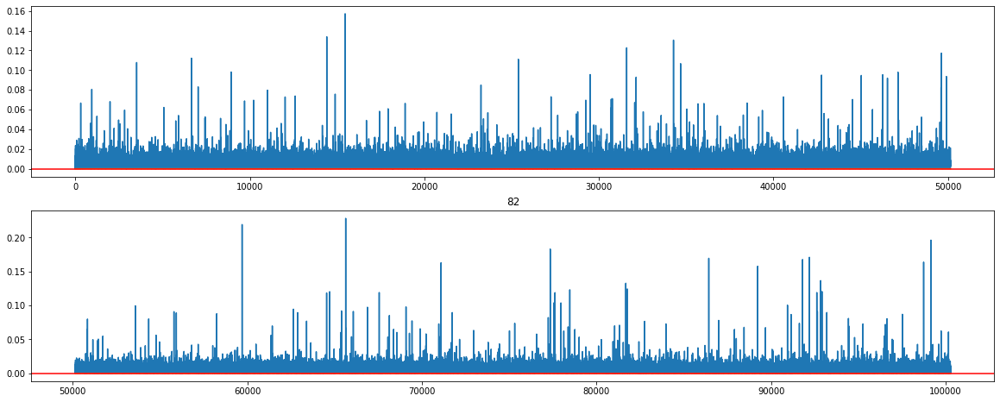

-------------------------------------------
plotting col 83


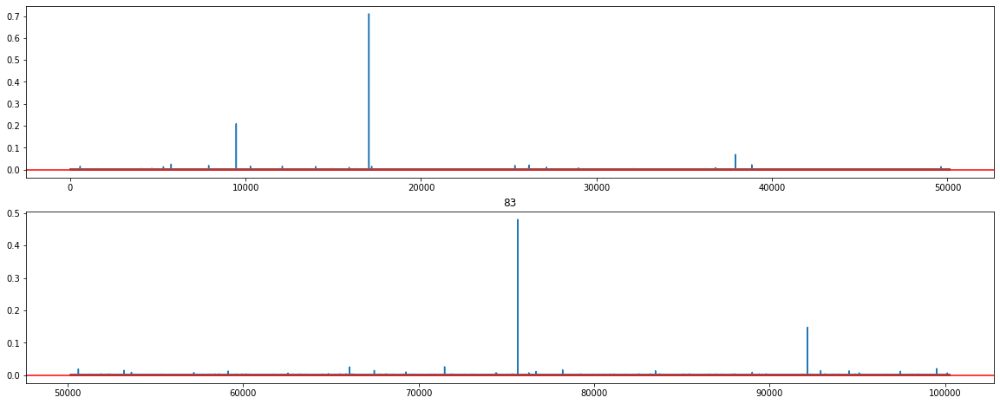

-------------------------------------------
plotting col 84


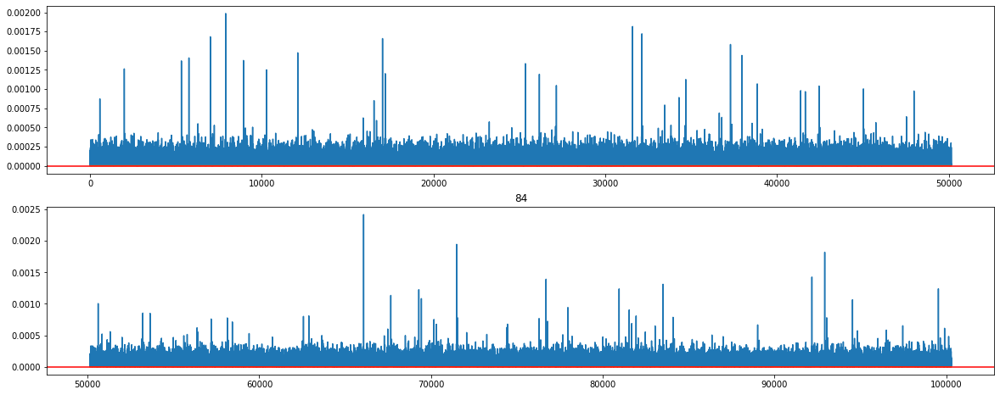

-------------------------------------------
plotting col 85


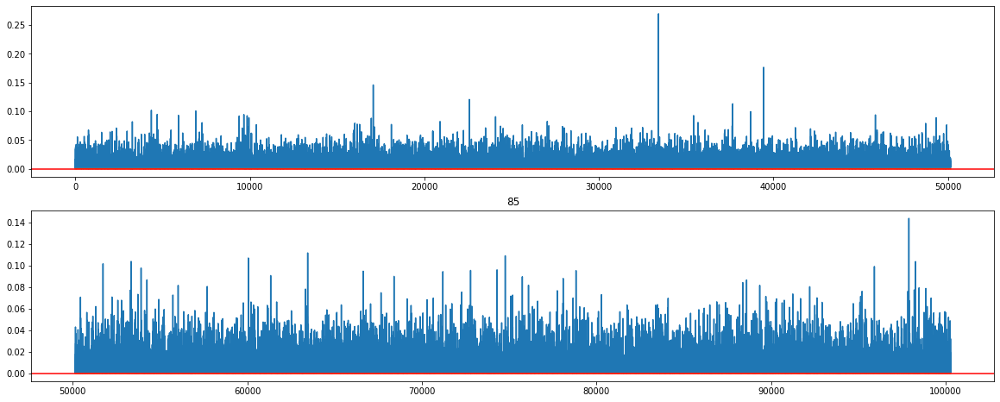

-------------------------------------------


In [82]:
T_CHECK_DIST = pd.DataFrame(T_CHECK_DIST)
THRESHOLD = 0

for i in range(T_CHECK_DIST.shape[1]):
    print(f'plotting col {i}')
    
    T_ANOMALY_SCORE = T_CHECK_DIST[i].to_numpy()

    check_graph(T_ANOMALY_SCORE, T_CHECK_ATT, piece=2, THRESHOLD=THRESHOLD, title = True, title_nm = i)
    print('-------------------------------------------')
    

In [83]:
TS_ANOMALY_SCORE = range_check(T_ANOMALY_SCORE, size=30)
TS_ANOMALY_SCORE

(100288,)

plotting col 0


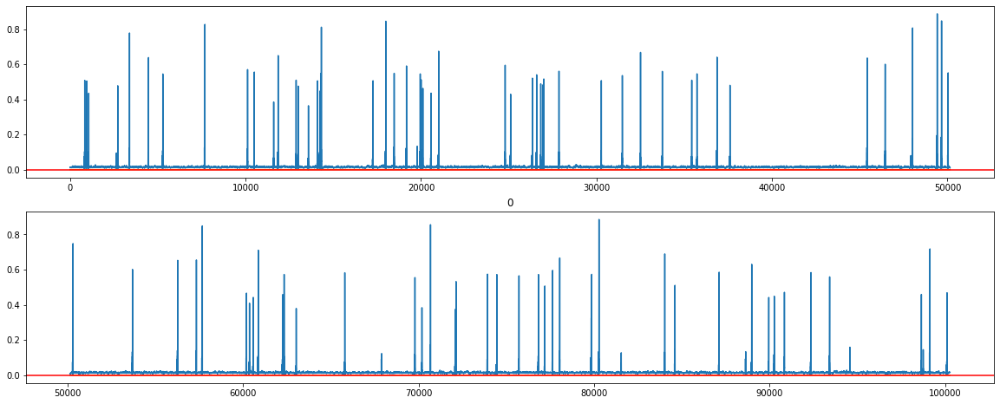

-------------------------------------------
plotting col 1


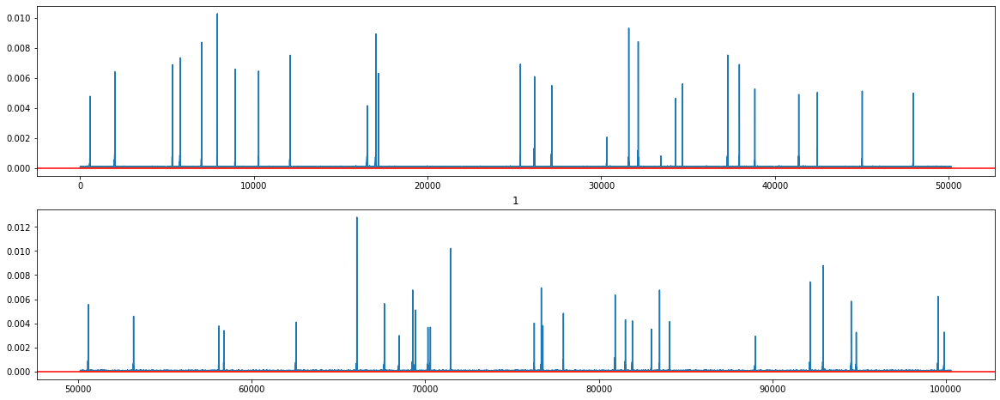

-------------------------------------------
plotting col 2


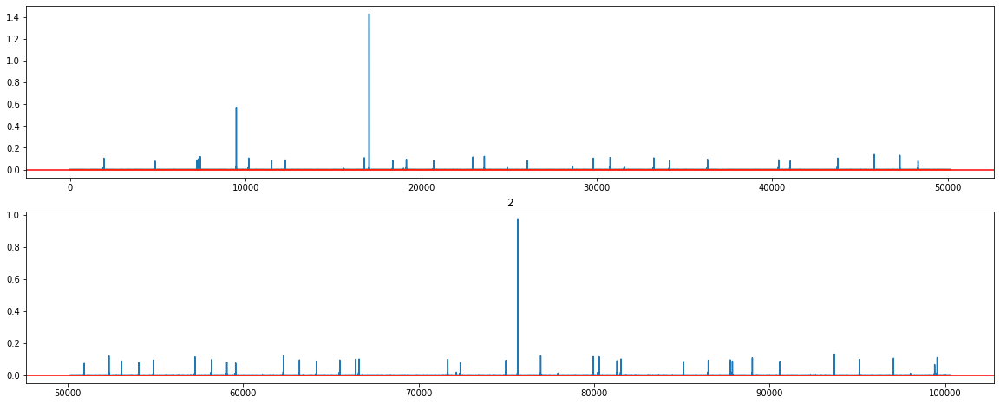

-------------------------------------------
plotting col 3


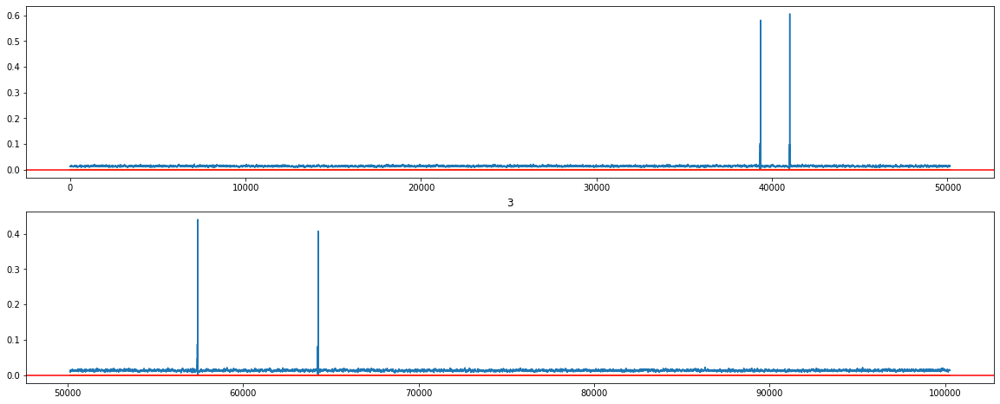

-------------------------------------------
plotting col 4


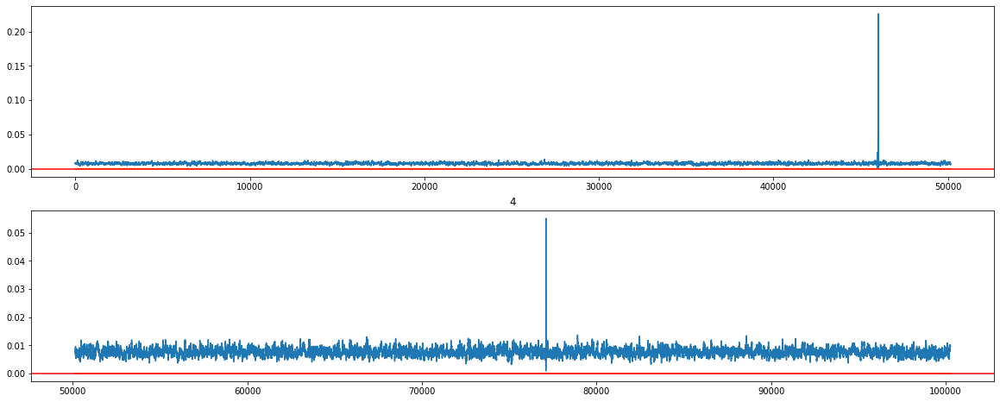

-------------------------------------------
plotting col 5


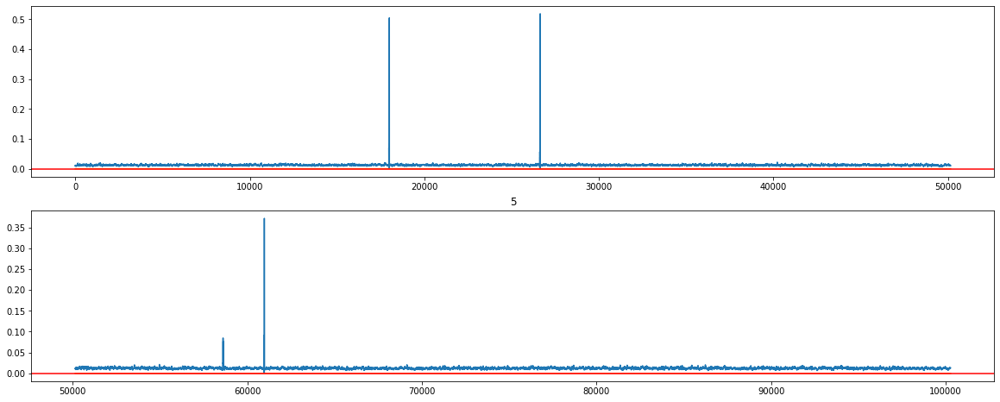

-------------------------------------------
plotting col 6


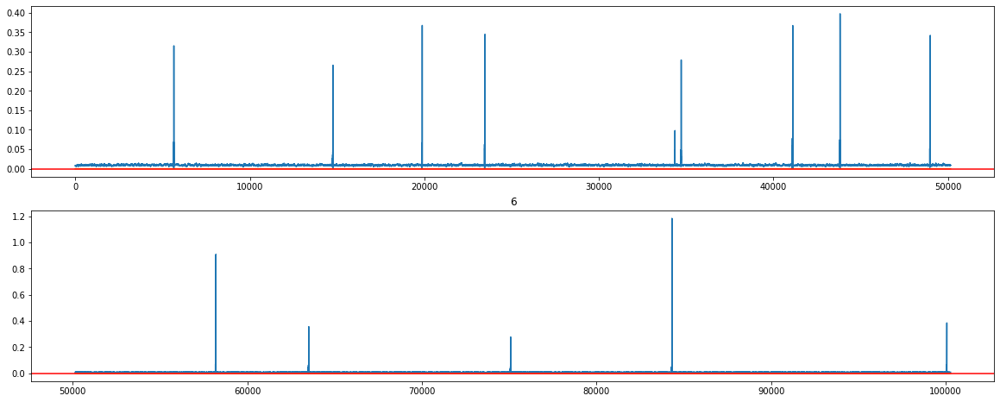

-------------------------------------------
plotting col 7


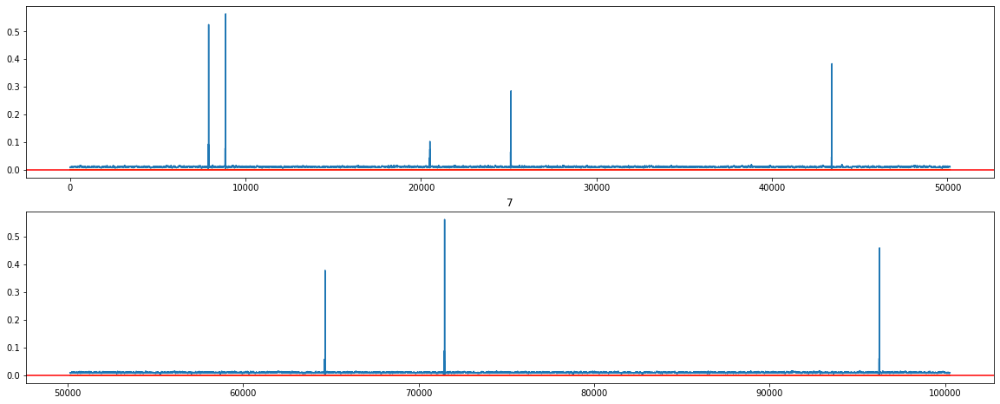

-------------------------------------------
plotting col 8


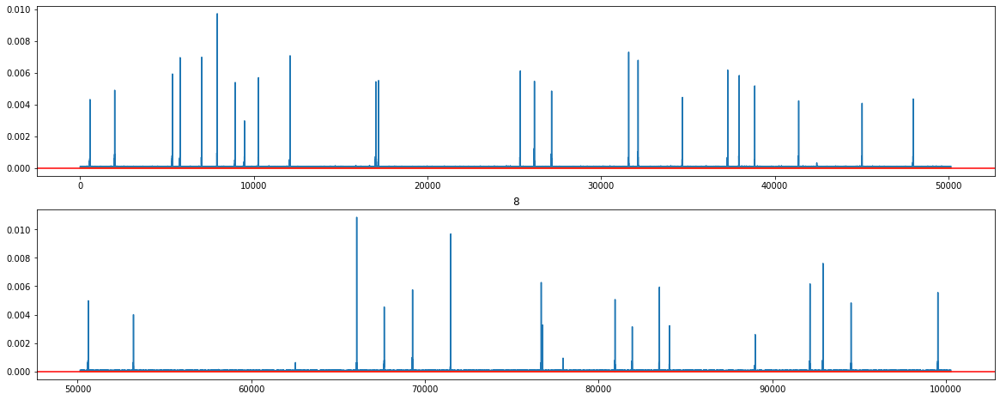

-------------------------------------------
plotting col 9


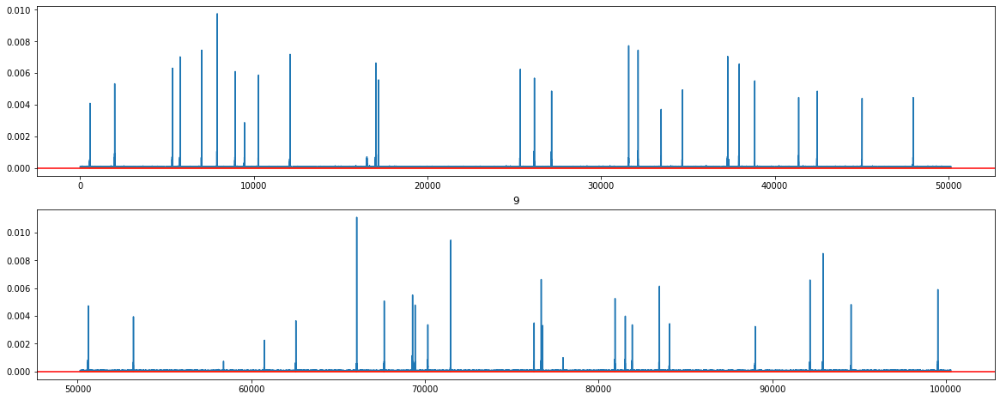

-------------------------------------------
plotting col 10


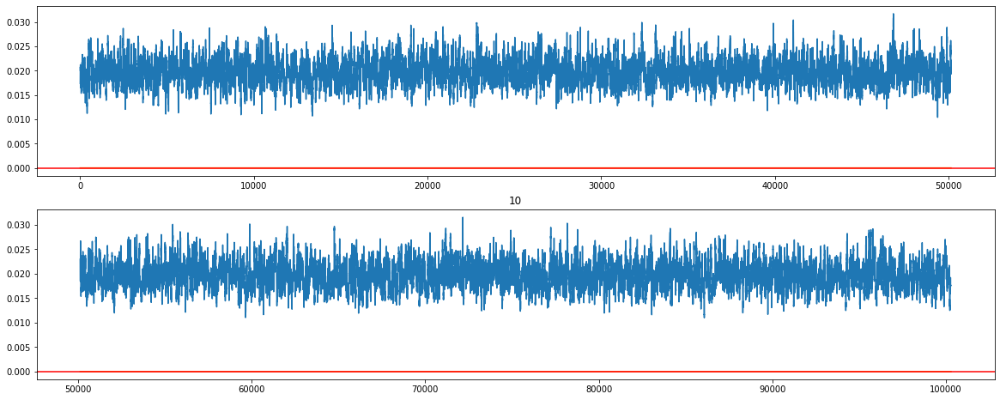

-------------------------------------------
plotting col 11


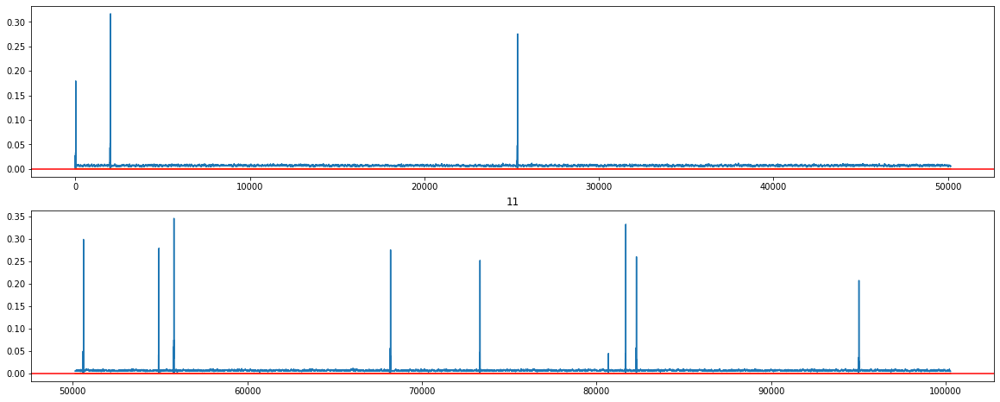

-------------------------------------------
plotting col 12


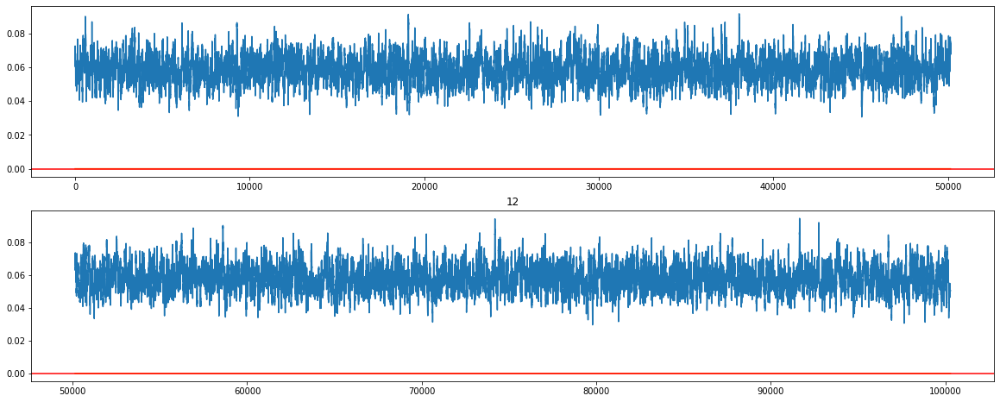

-------------------------------------------
plotting col 13


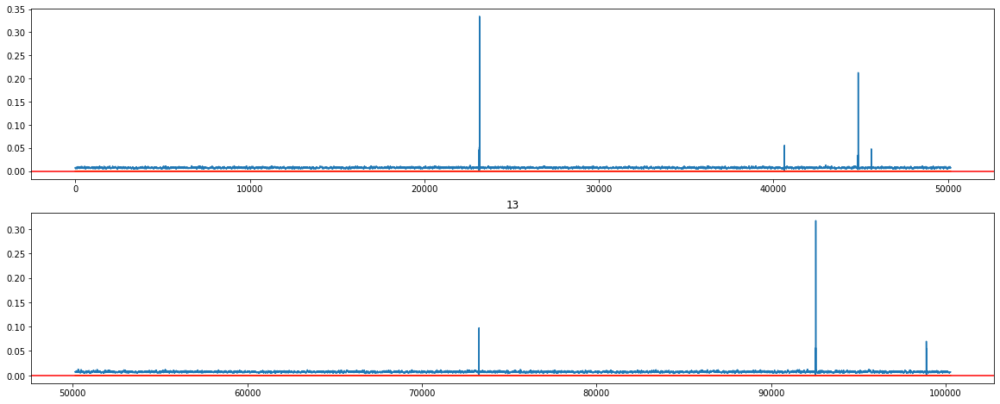

-------------------------------------------
plotting col 14


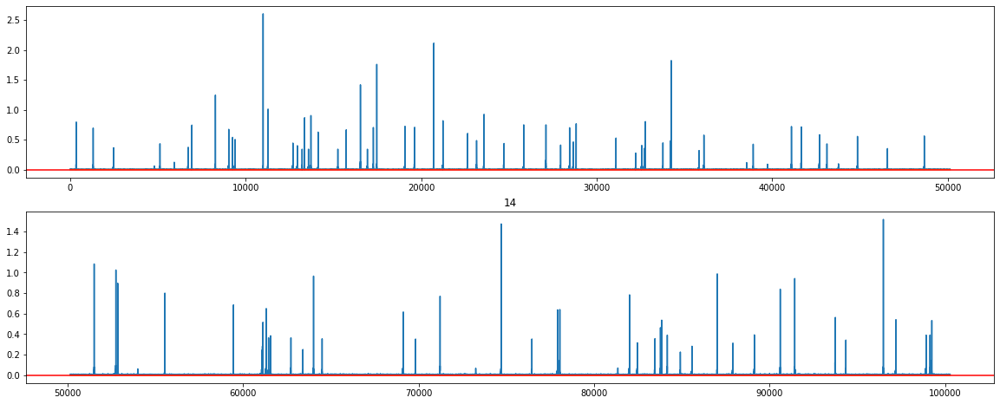

-------------------------------------------
plotting col 15


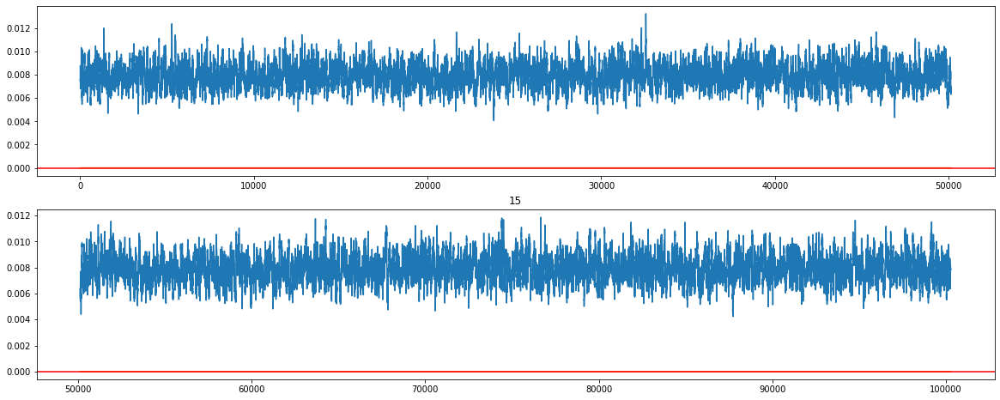

-------------------------------------------
plotting col 16


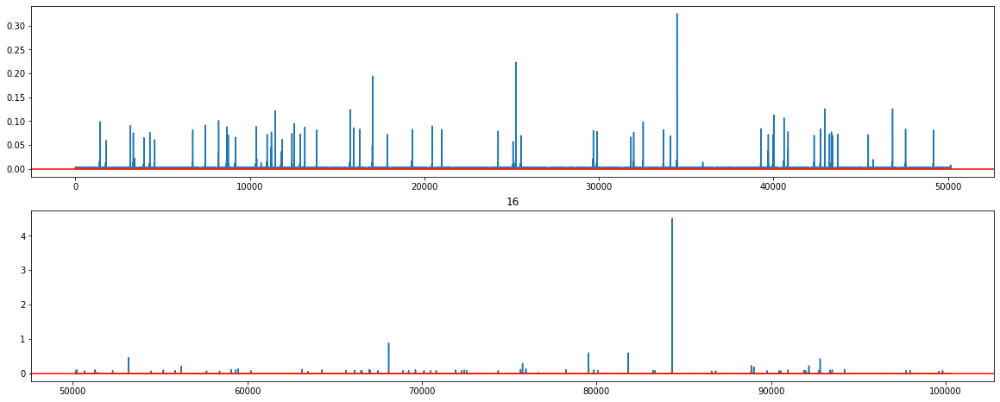

-------------------------------------------
plotting col 17


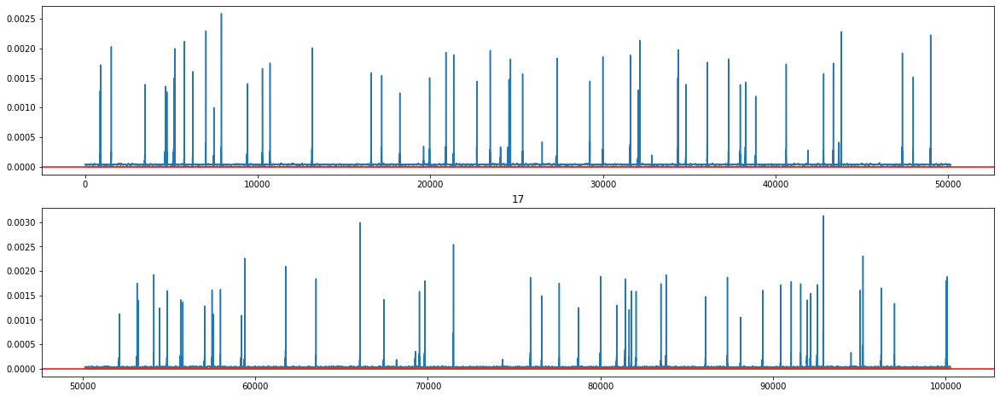

-------------------------------------------
plotting col 18


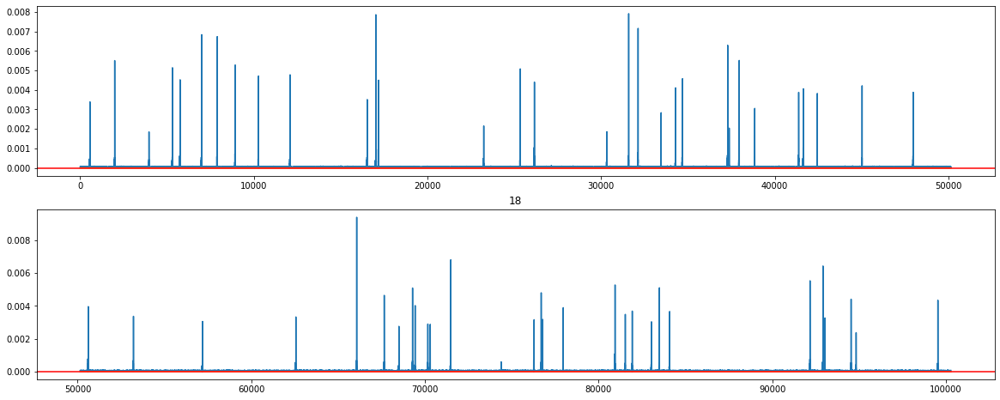

-------------------------------------------
plotting col 19


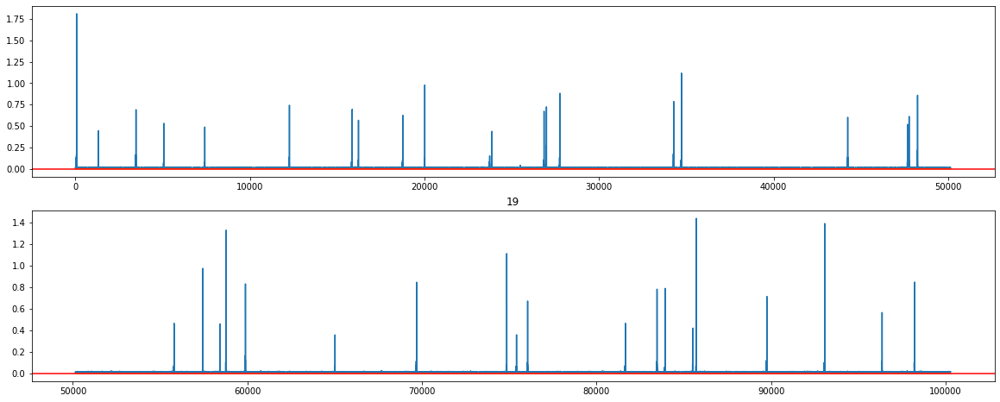

-------------------------------------------
plotting col 20


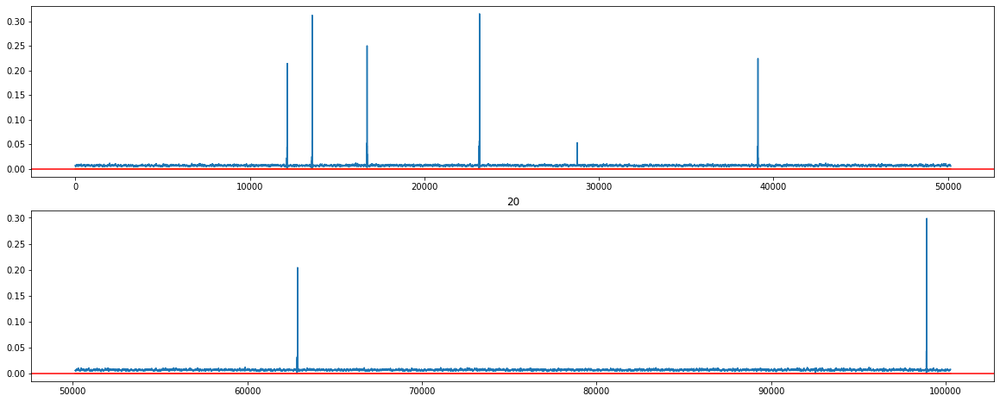

-------------------------------------------
plotting col 21


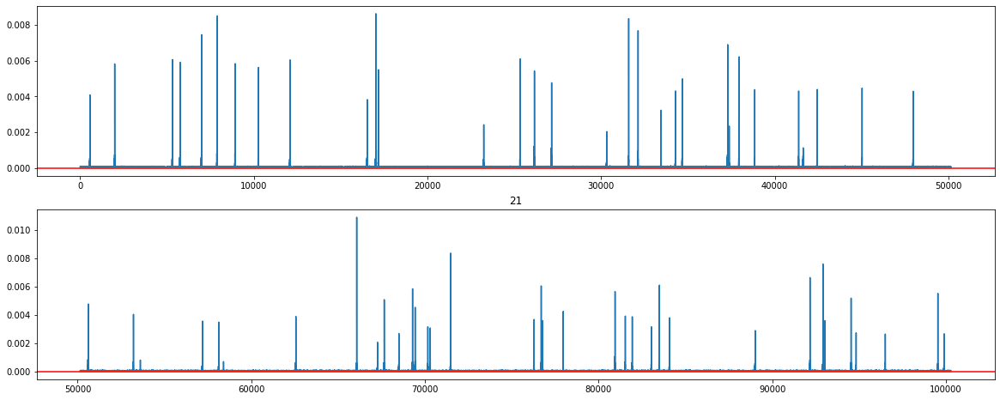

-------------------------------------------
plotting col 22


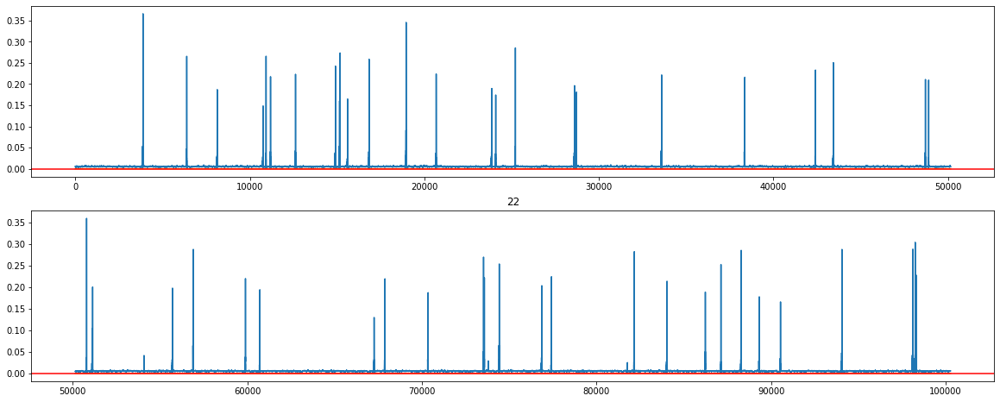

-------------------------------------------
plotting col 23


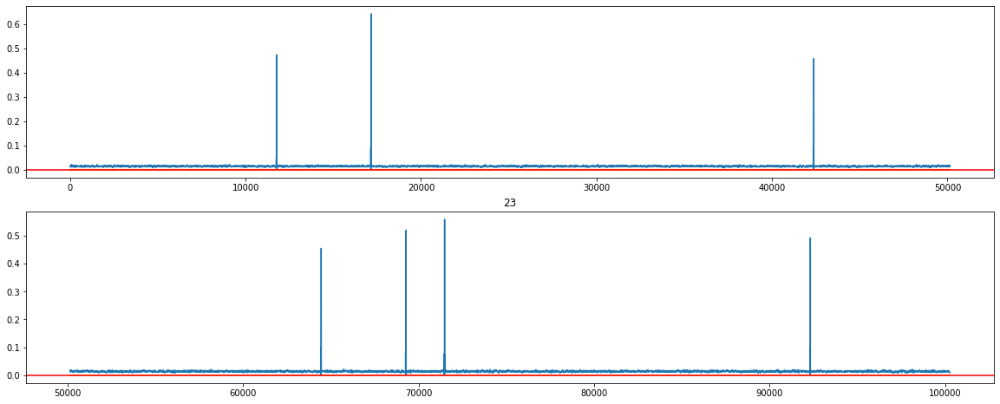

-------------------------------------------
plotting col 24


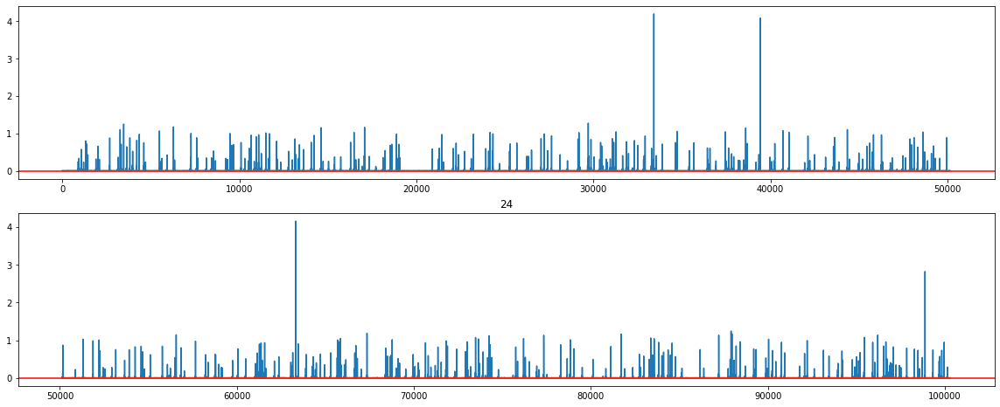

-------------------------------------------
plotting col 25


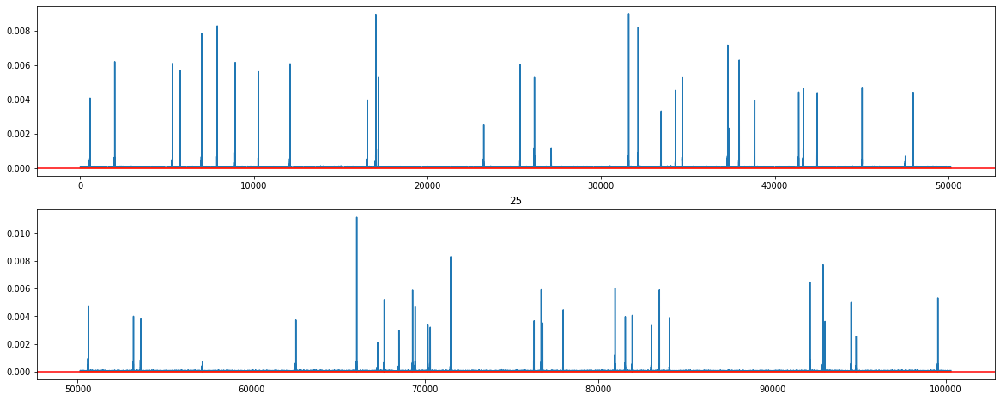

-------------------------------------------
plotting col 26


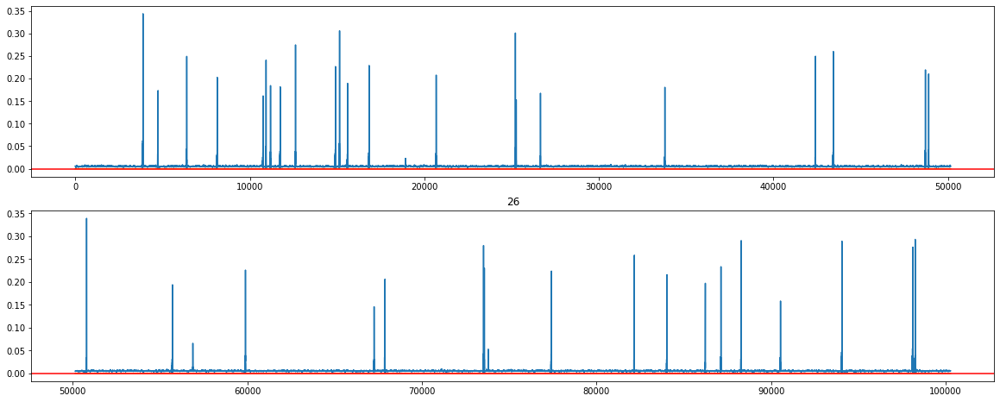

-------------------------------------------
plotting col 27


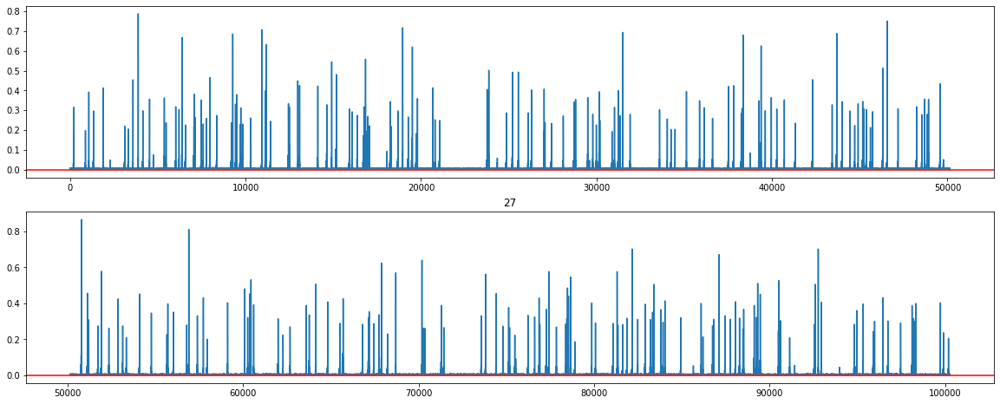

-------------------------------------------
plotting col 28


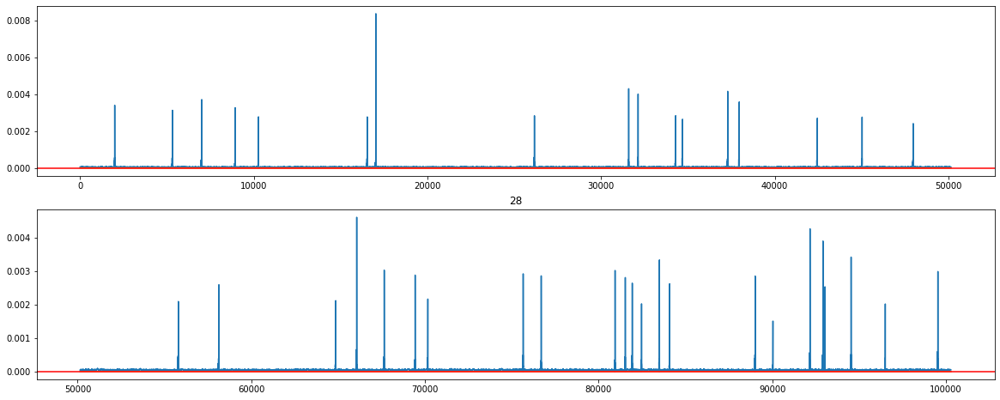

-------------------------------------------
plotting col 29


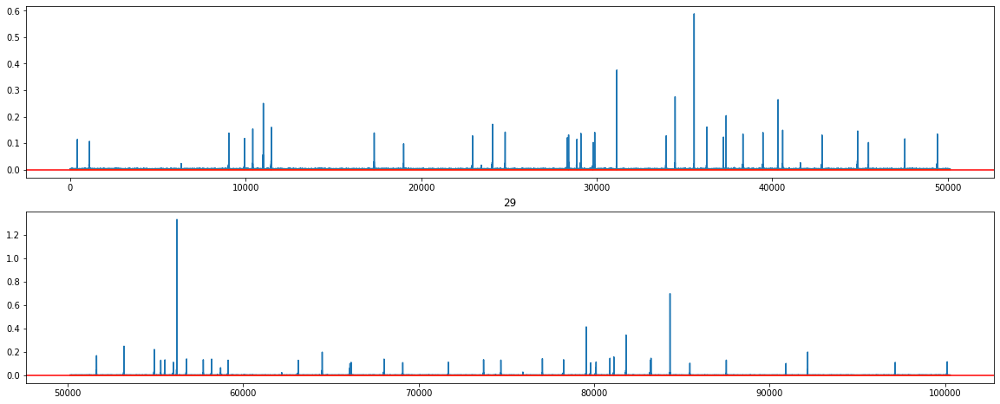

-------------------------------------------
plotting col 30


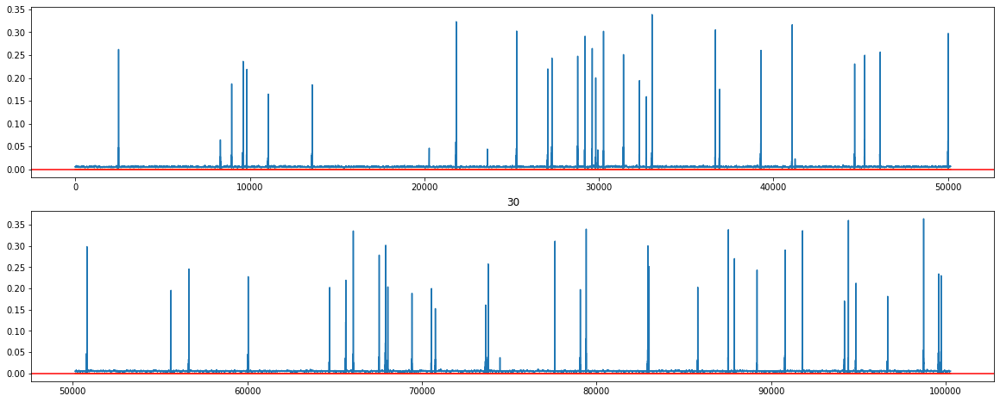

-------------------------------------------
plotting col 31


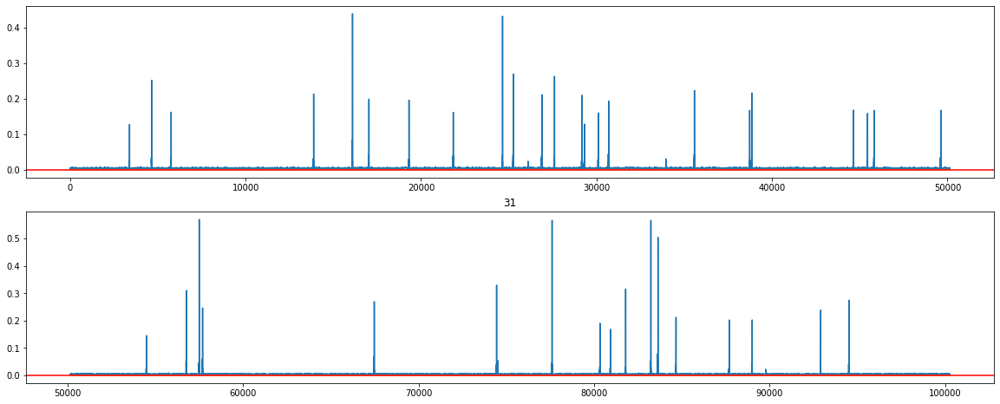

-------------------------------------------
plotting col 32


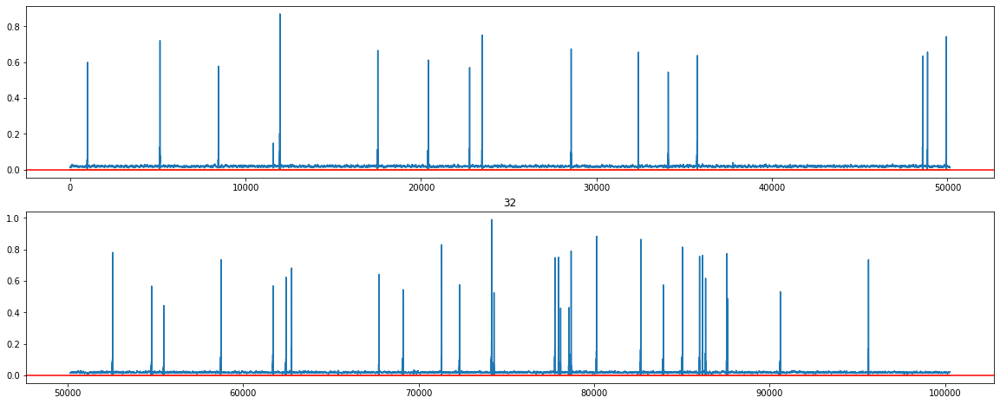

-------------------------------------------
plotting col 33


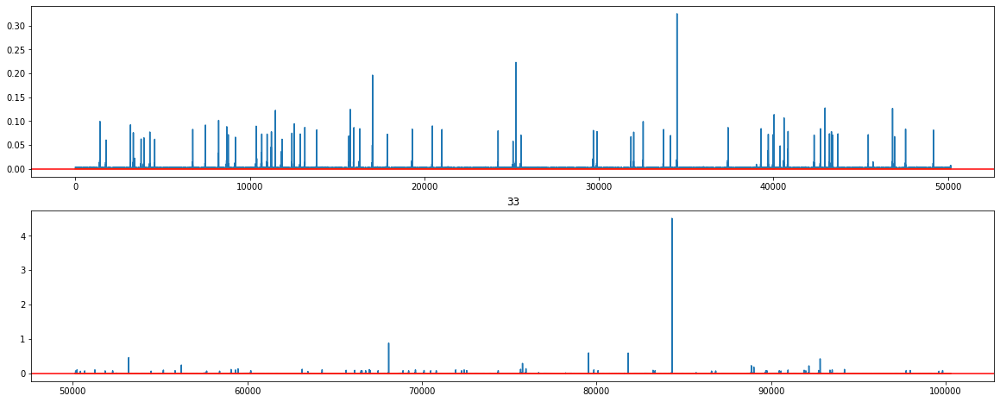

-------------------------------------------
plotting col 34


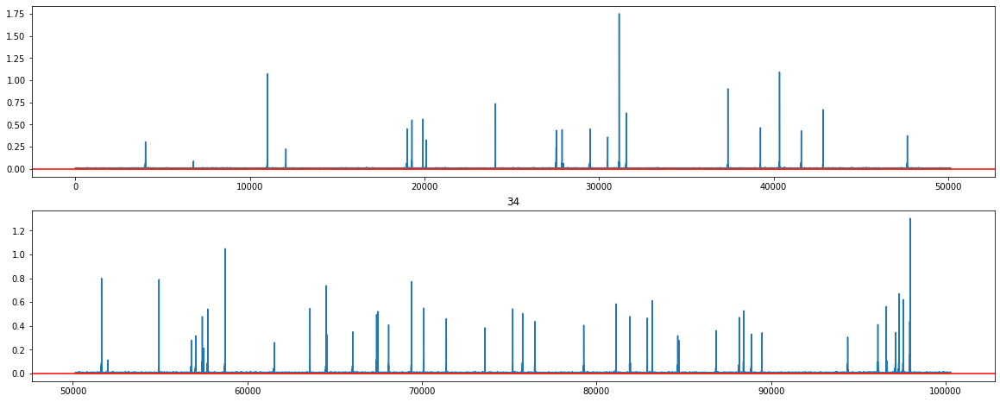

-------------------------------------------
plotting col 35


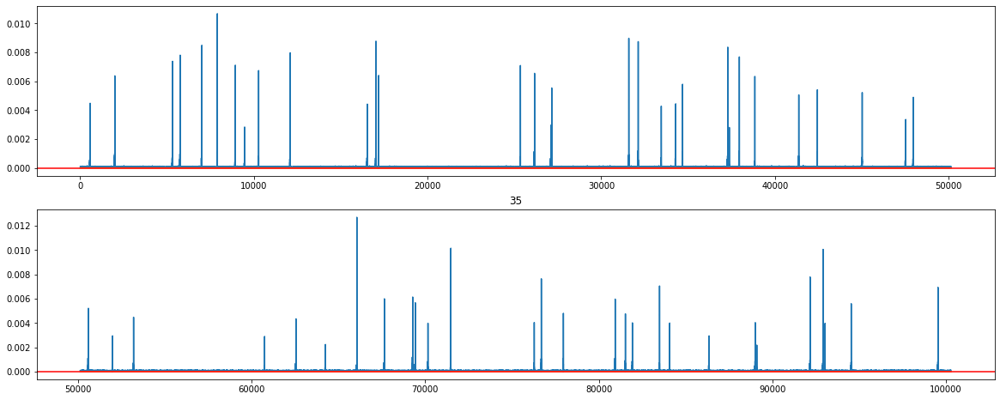

-------------------------------------------
plotting col 36


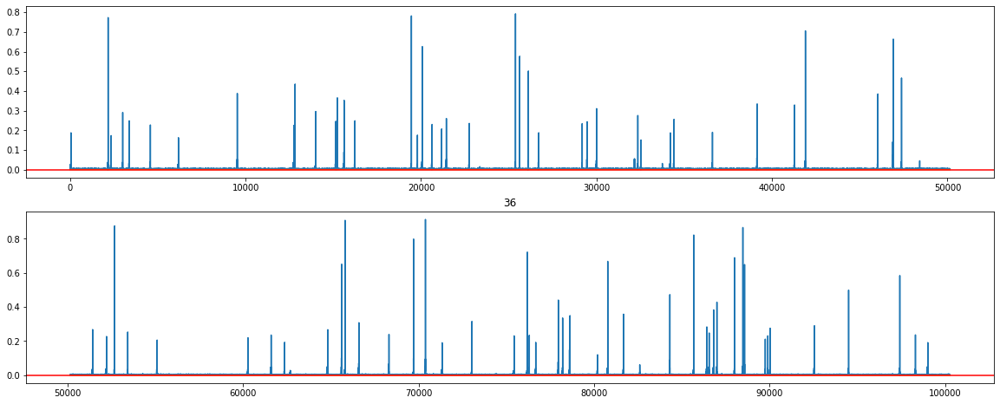

-------------------------------------------
plotting col 37


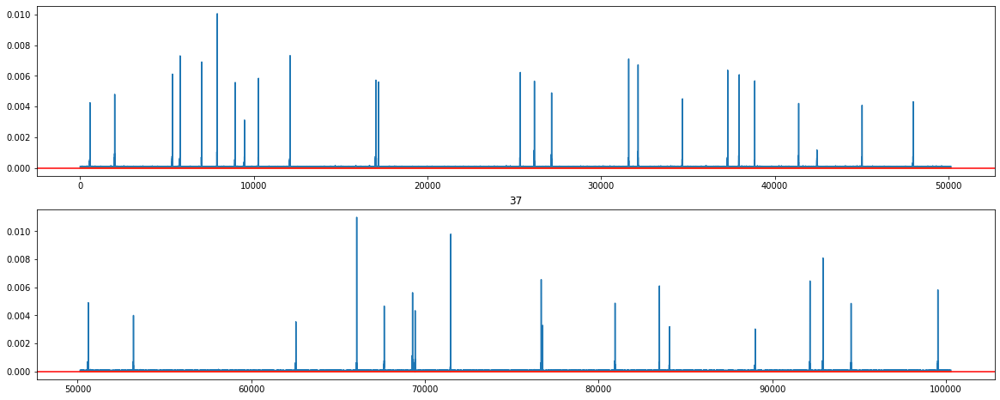

-------------------------------------------
plotting col 38


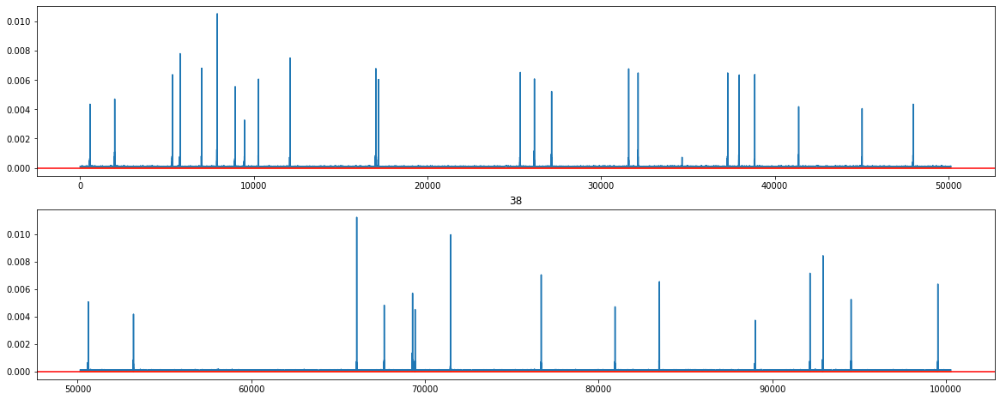

-------------------------------------------
plotting col 39


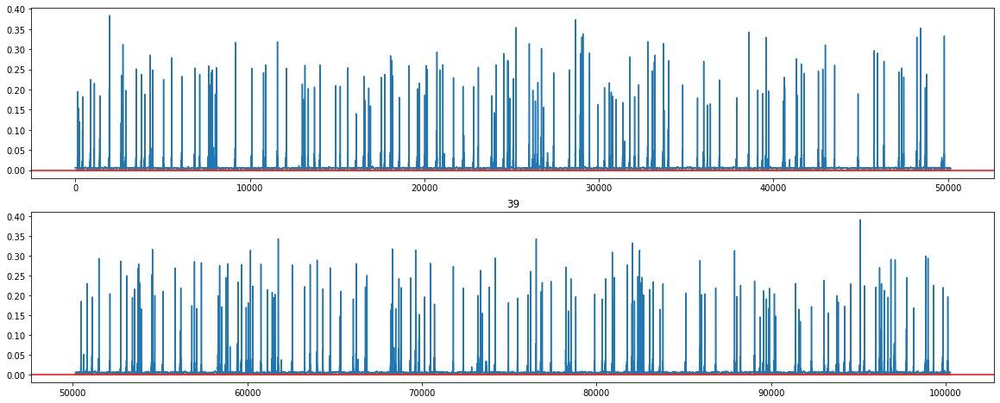

-------------------------------------------
plotting col 40


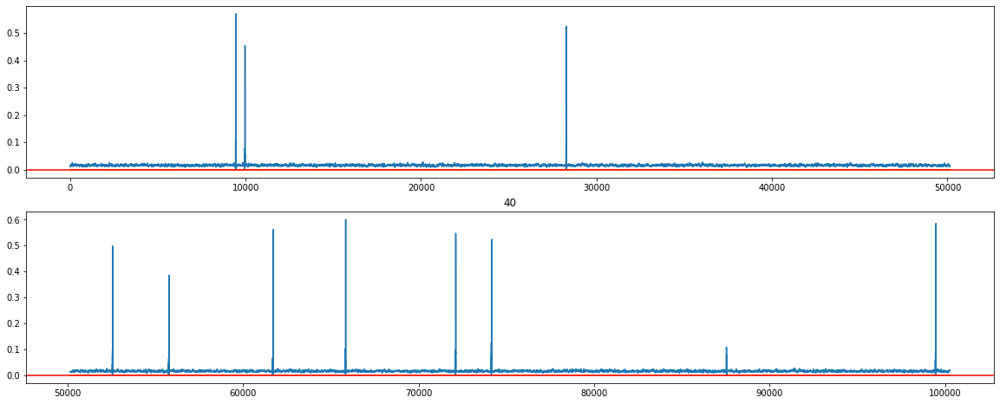

-------------------------------------------
plotting col 41


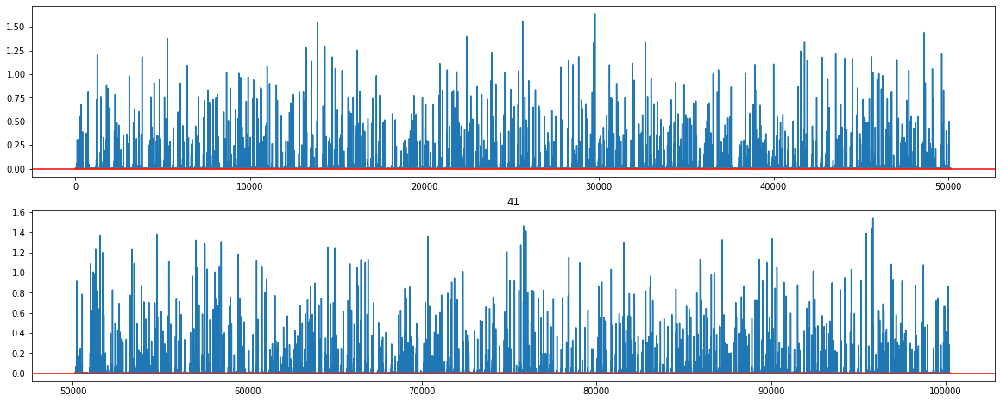

-------------------------------------------
plotting col 42


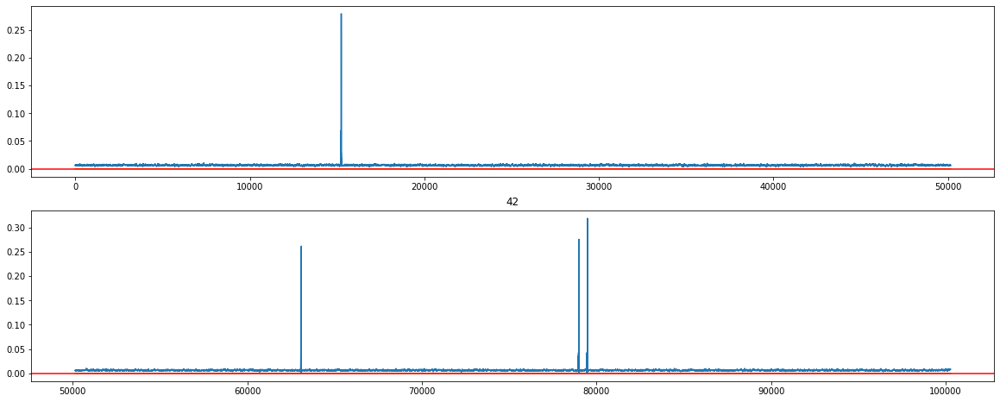

-------------------------------------------
plotting col 43


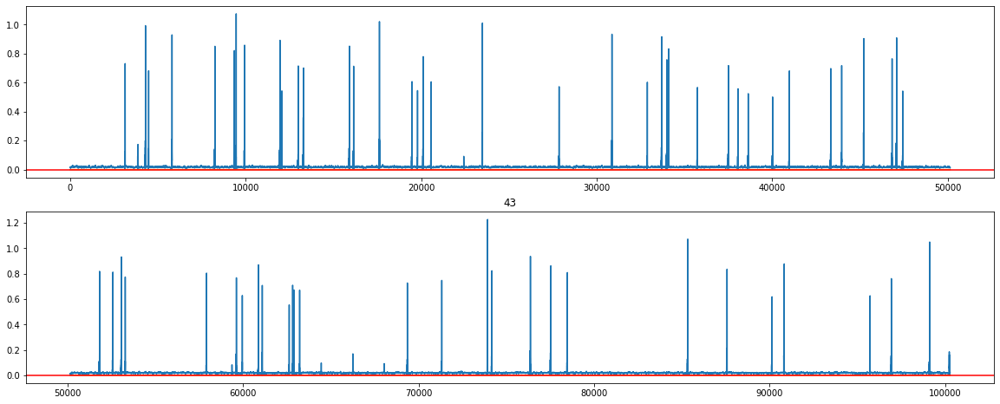

-------------------------------------------
plotting col 44


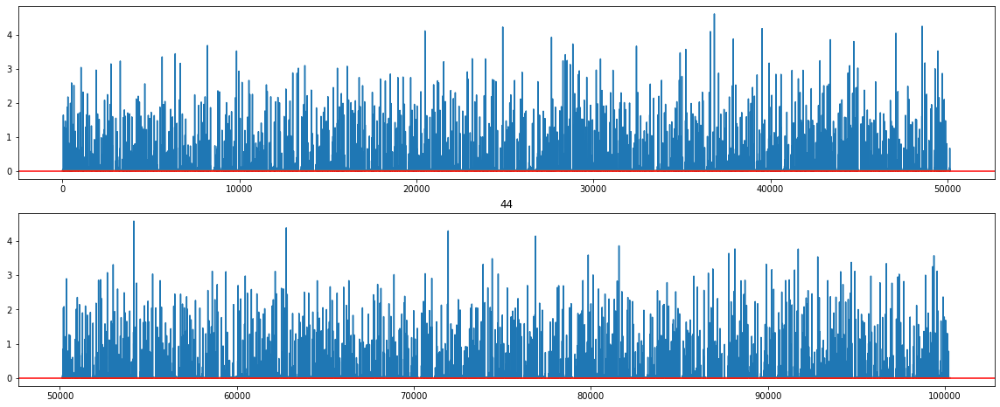

-------------------------------------------
plotting col 45


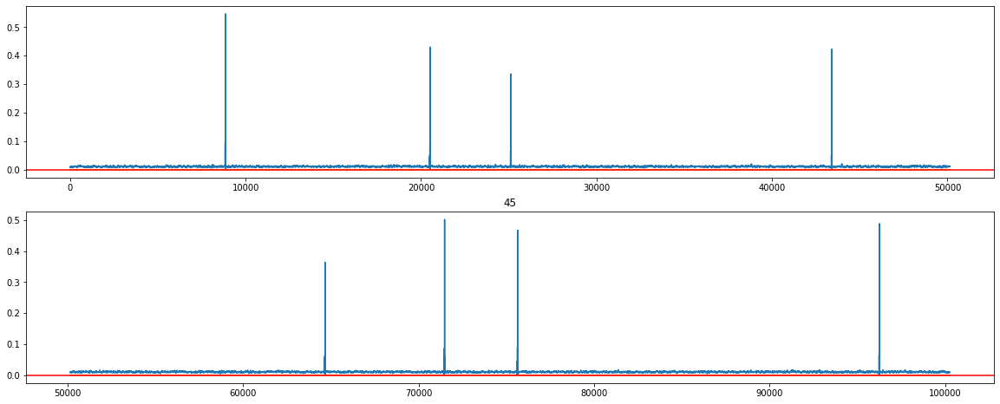

-------------------------------------------
plotting col 46


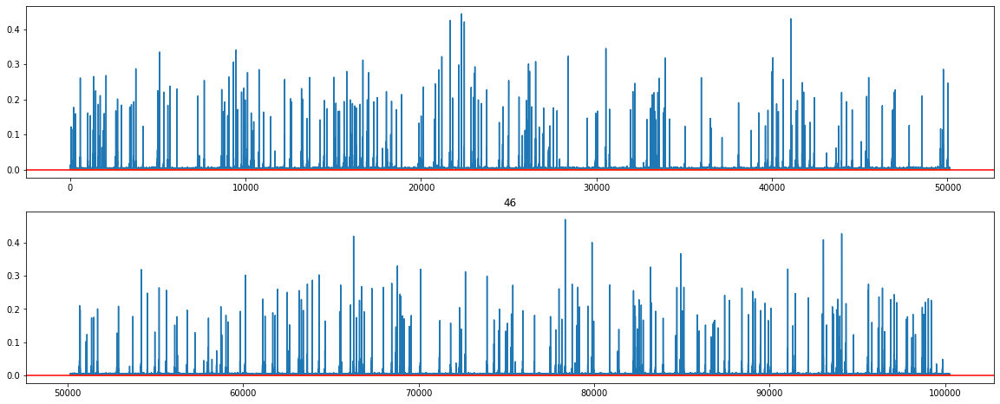

-------------------------------------------
plotting col 47


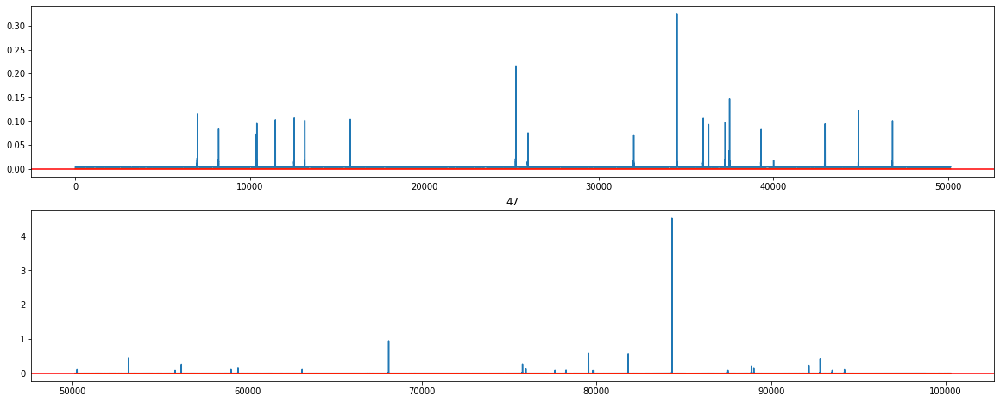

-------------------------------------------
plotting col 48


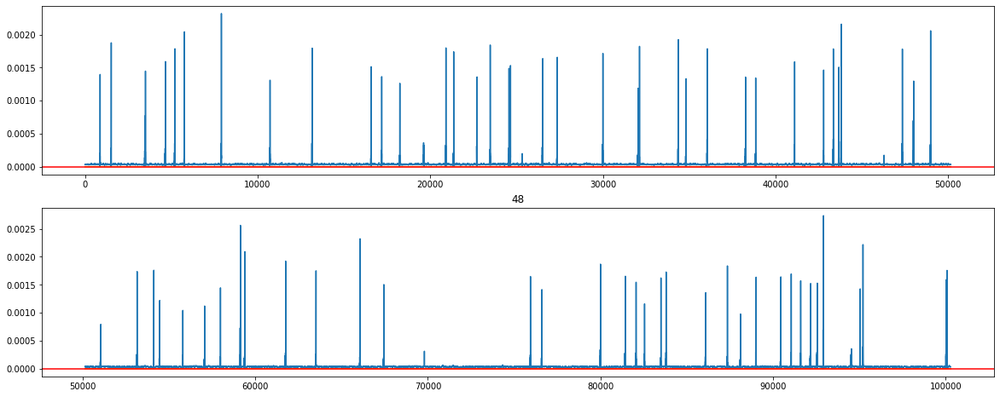

-------------------------------------------
plotting col 49


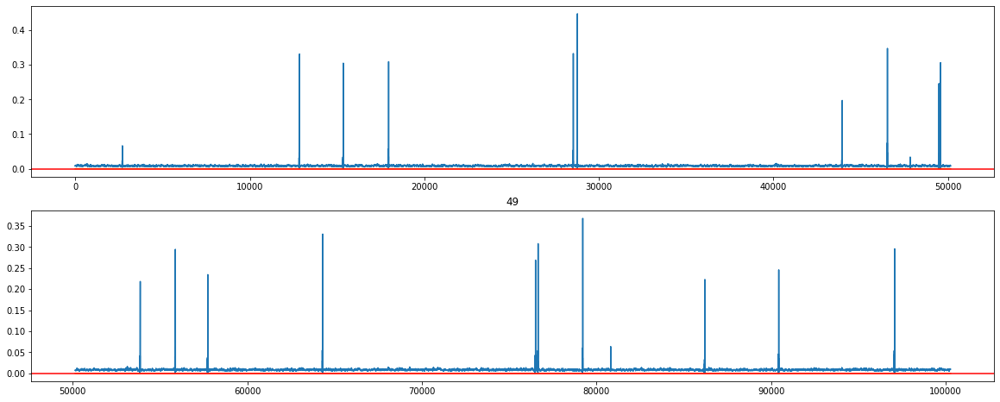

-------------------------------------------
plotting col 50


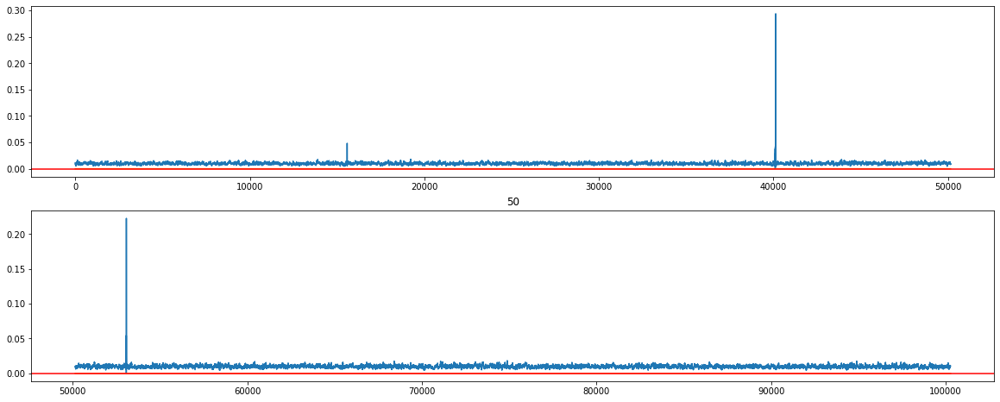

-------------------------------------------
plotting col 51


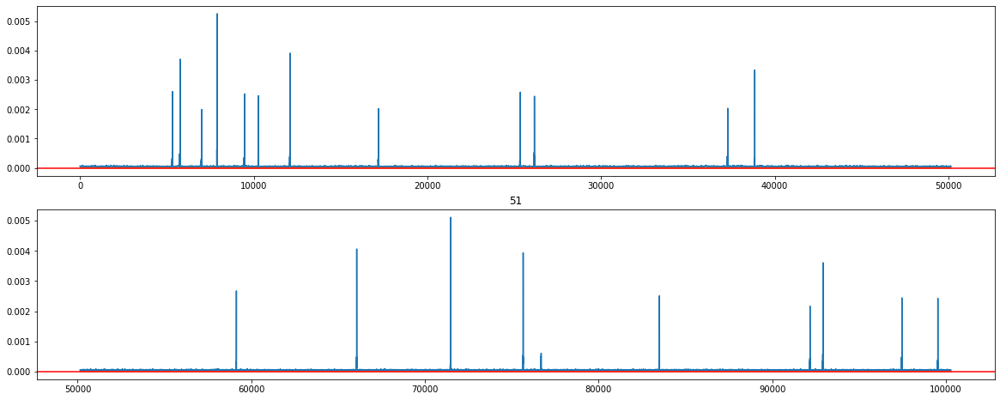

-------------------------------------------
plotting col 52


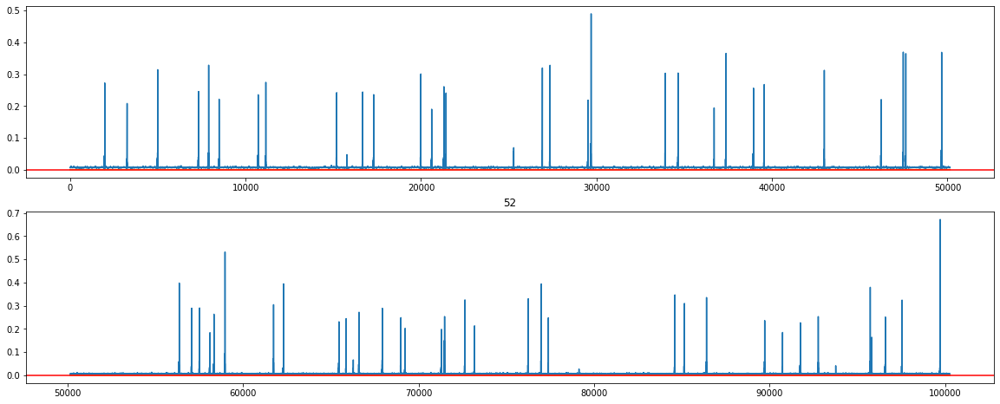

-------------------------------------------
plotting col 53


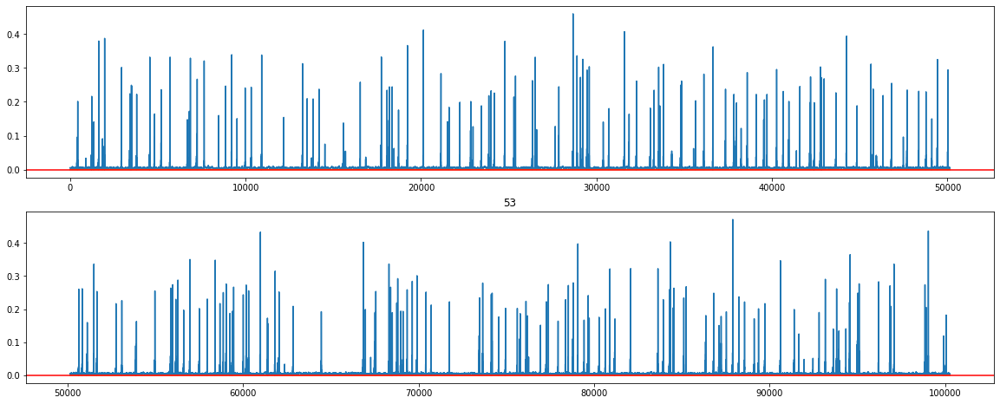

-------------------------------------------
plotting col 54


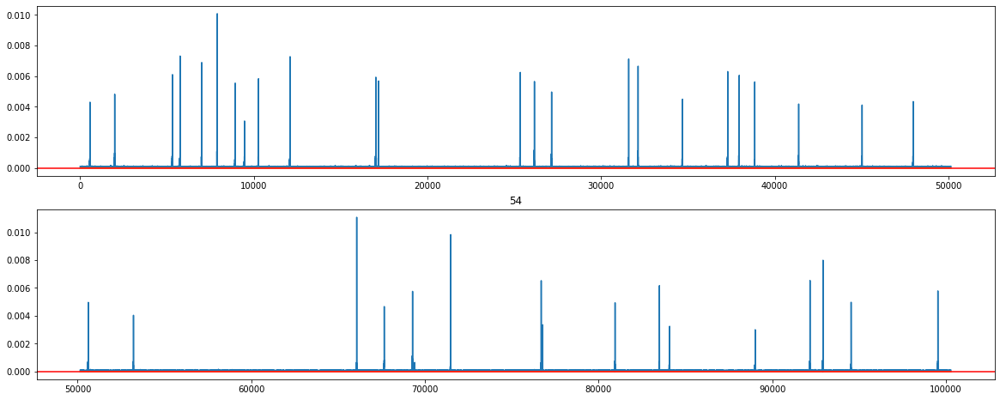

-------------------------------------------
plotting col 55


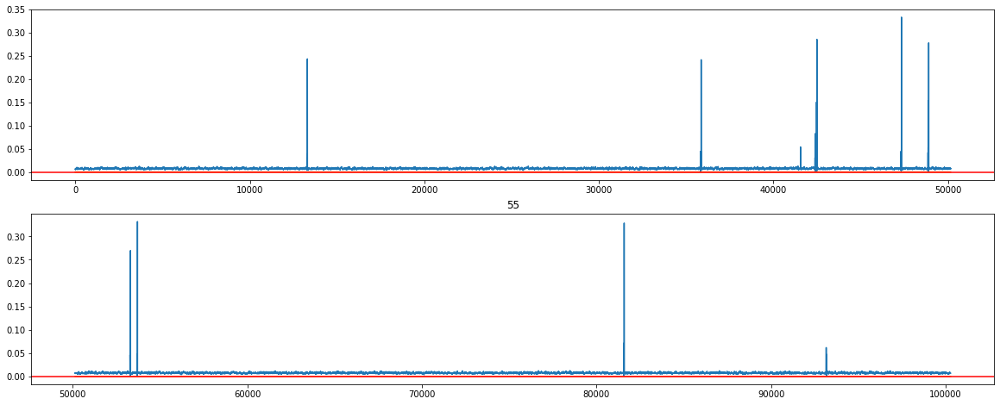

-------------------------------------------
plotting col 56


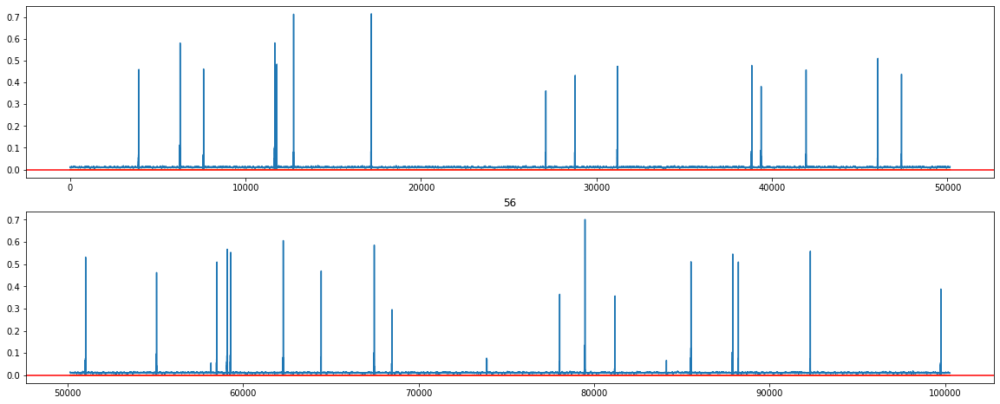

-------------------------------------------
plotting col 57


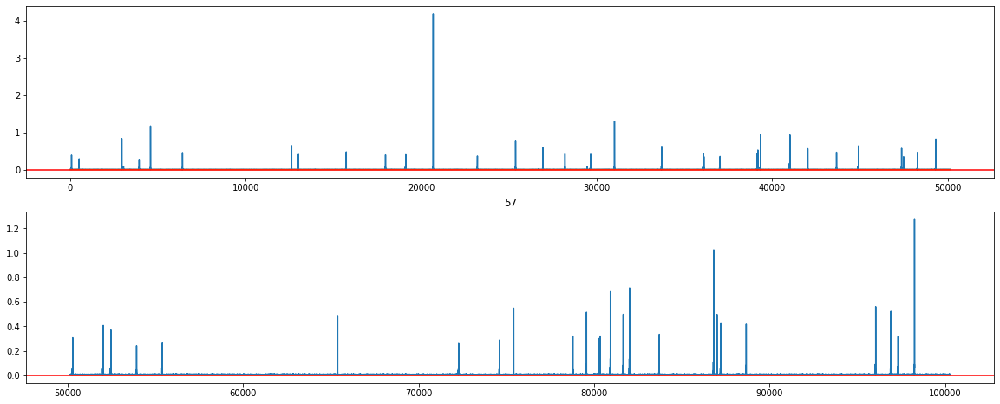

-------------------------------------------
plotting col 58


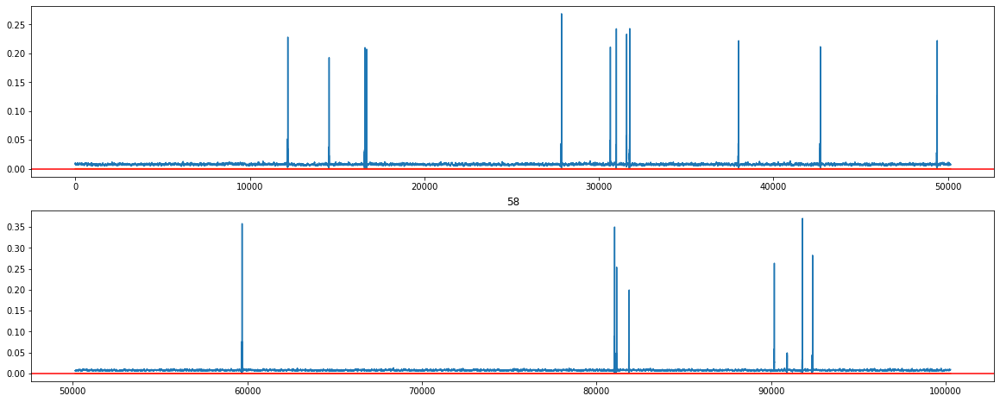

-------------------------------------------
plotting col 59


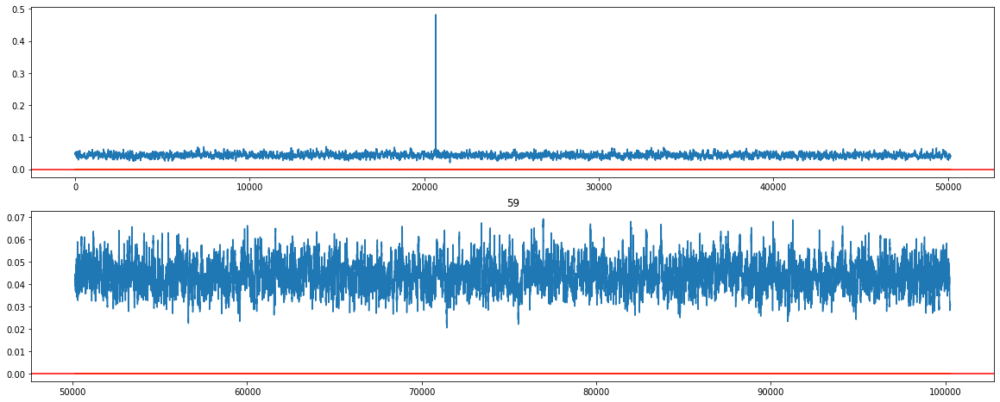

-------------------------------------------
plotting col 60


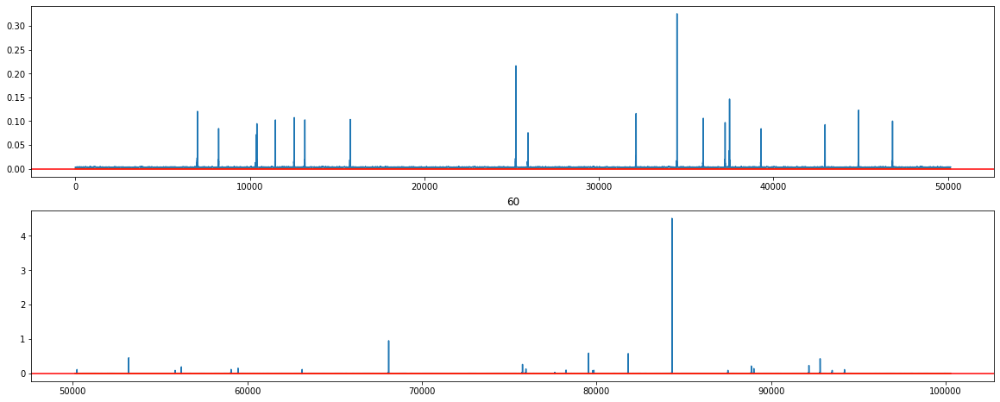

-------------------------------------------
plotting col 61


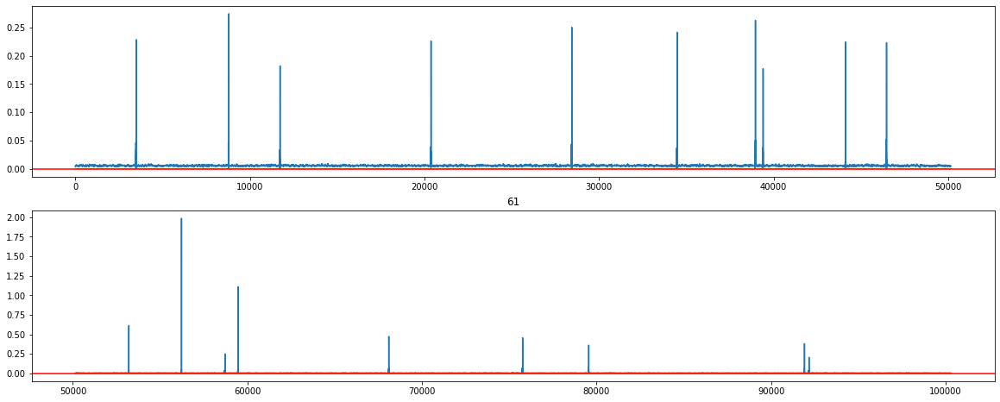

-------------------------------------------
plotting col 62


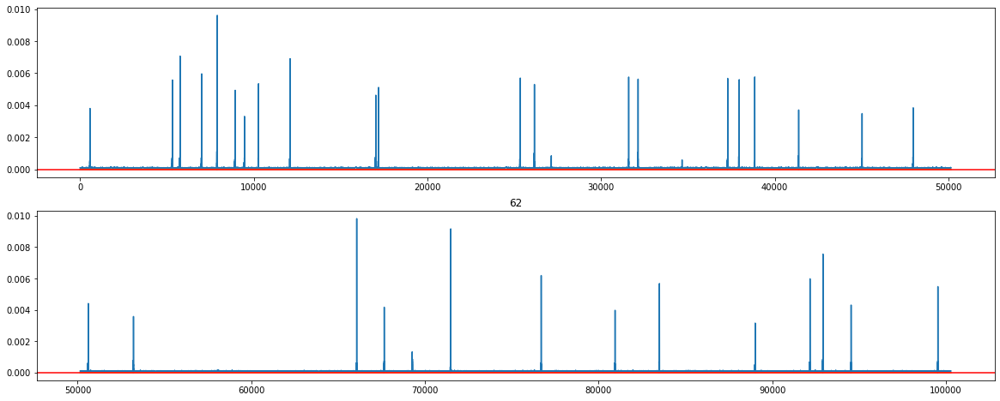

-------------------------------------------
plotting col 63


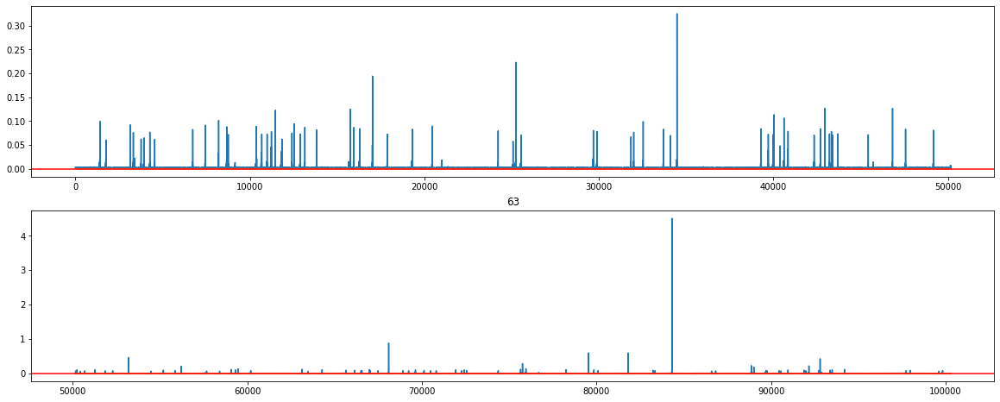

-------------------------------------------
plotting col 64


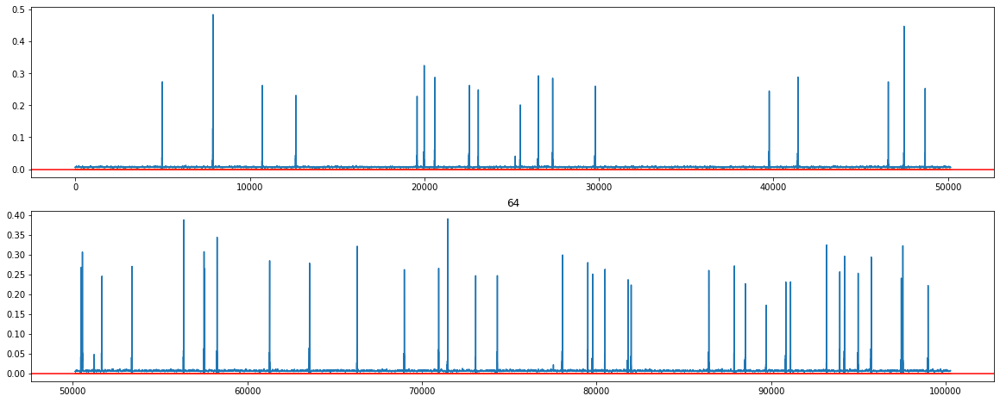

-------------------------------------------
plotting col 65


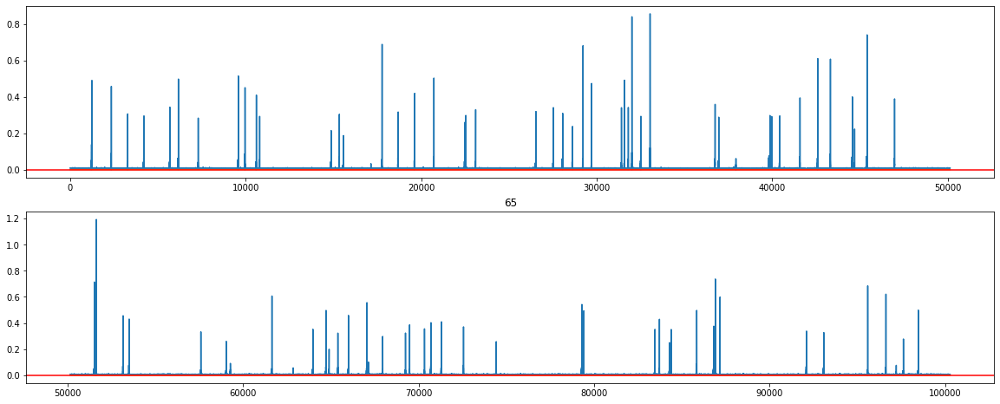

-------------------------------------------
plotting col 66


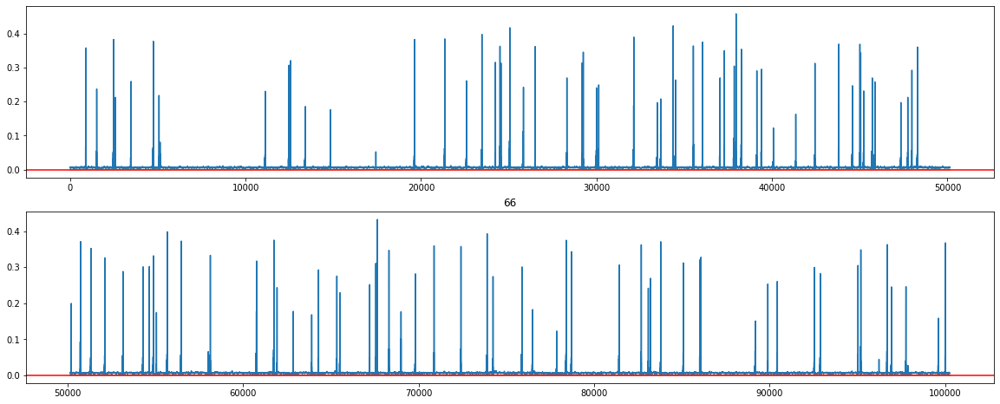

-------------------------------------------
plotting col 67


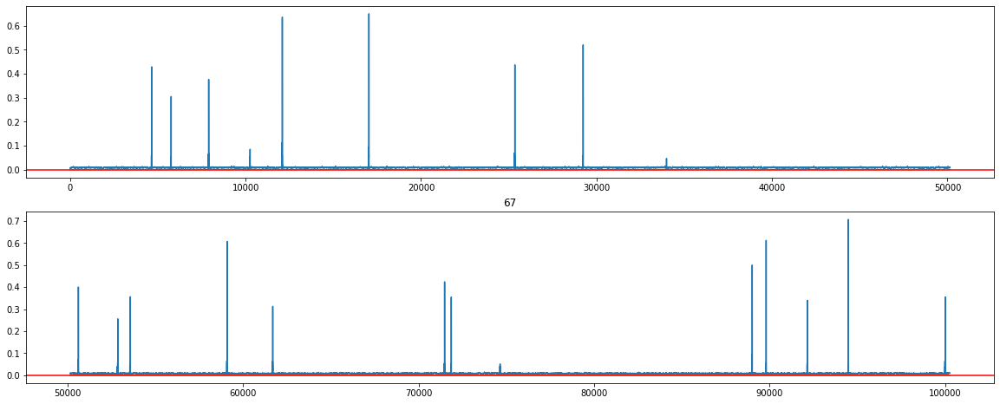

-------------------------------------------
plotting col 68


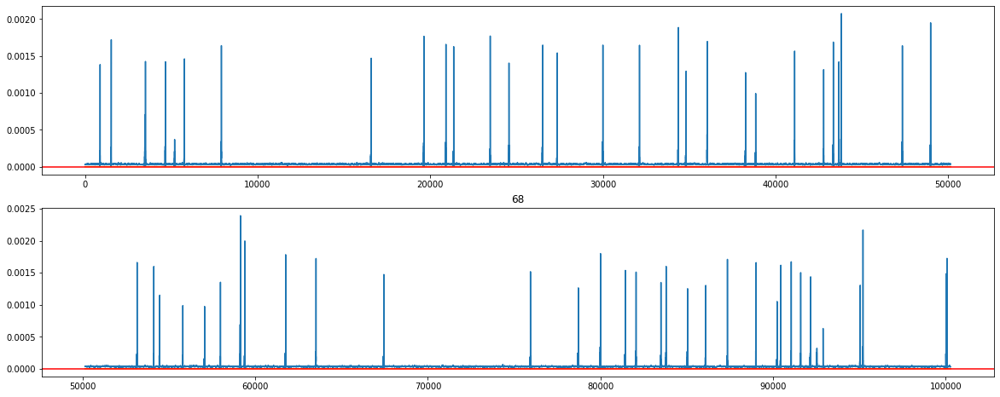

-------------------------------------------
plotting col 69


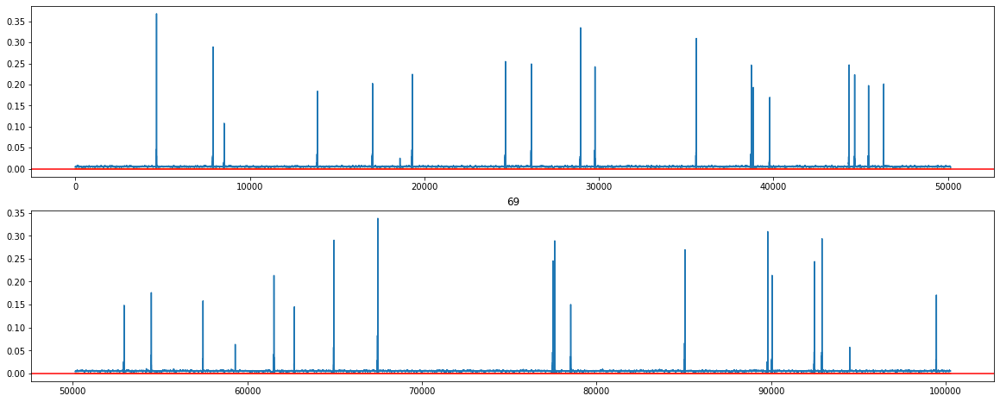

-------------------------------------------
plotting col 70


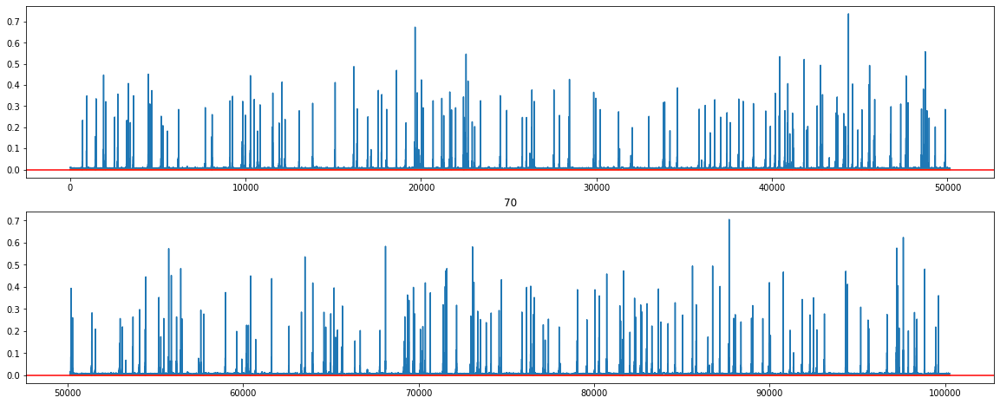

-------------------------------------------
plotting col 71


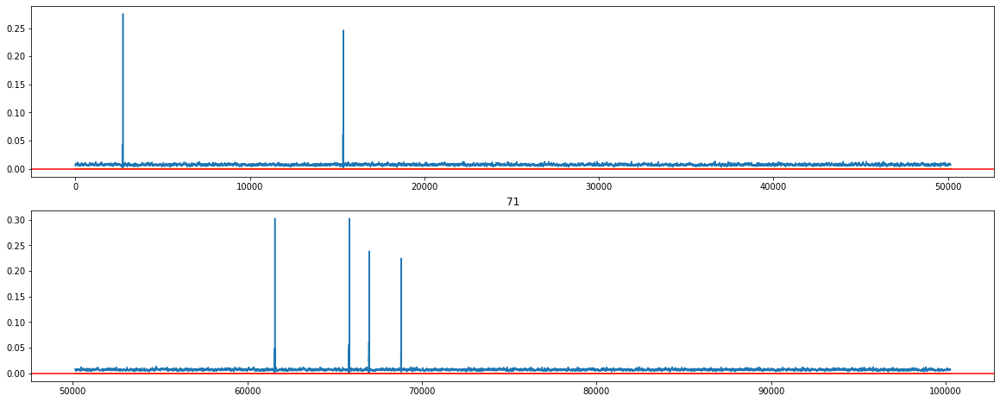

-------------------------------------------
plotting col 72


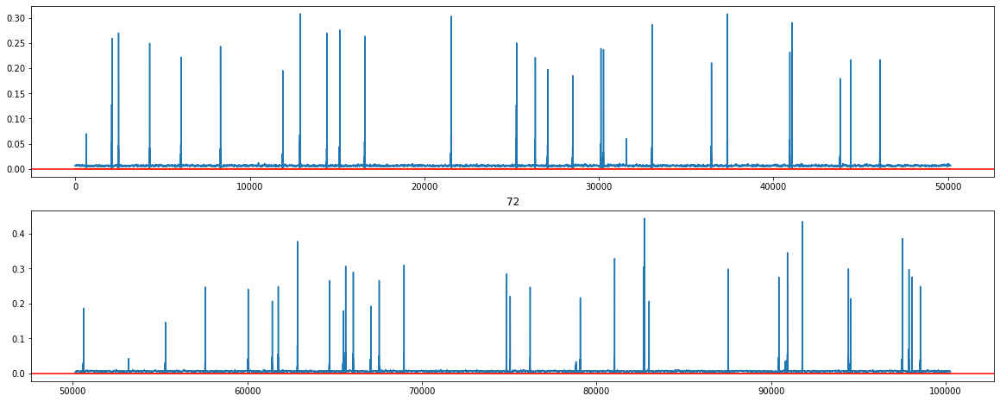

-------------------------------------------
plotting col 73


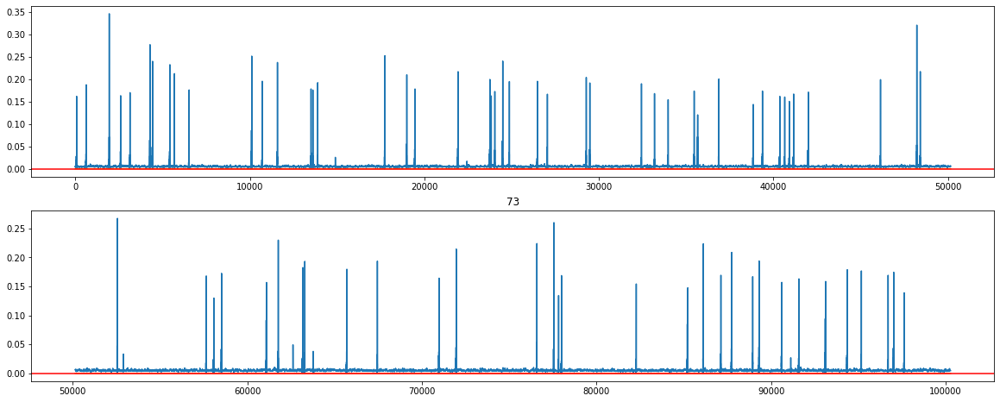

-------------------------------------------
plotting col 74


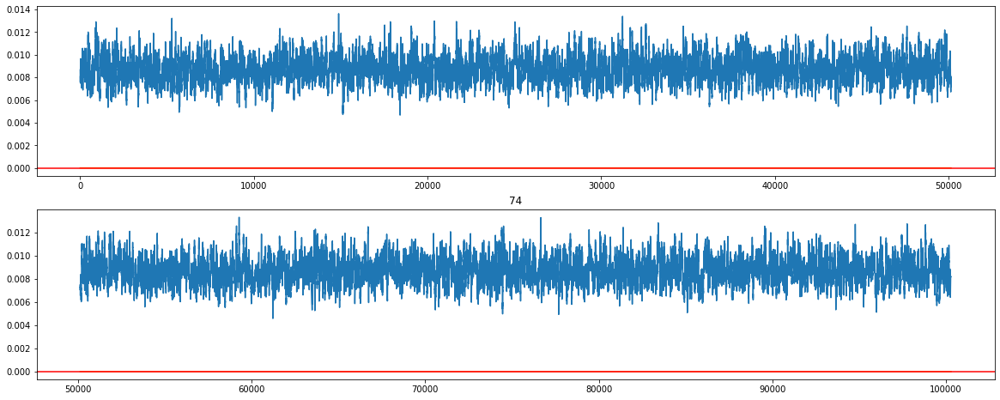

-------------------------------------------
plotting col 75


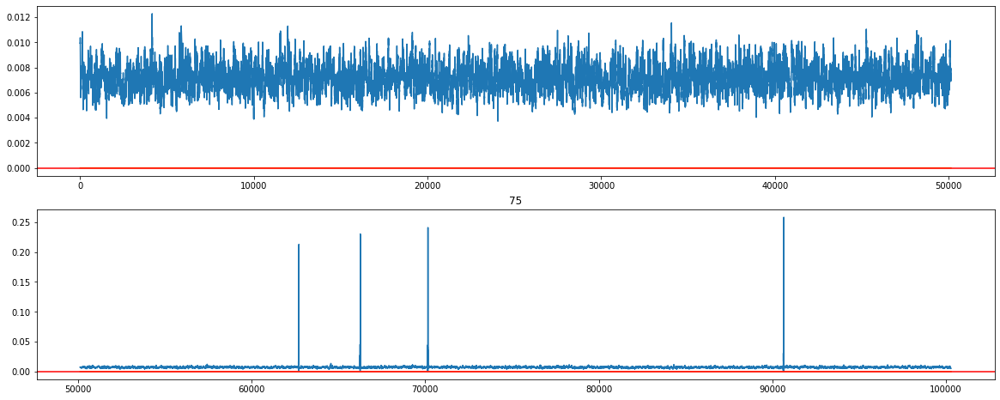

-------------------------------------------
plotting col 76


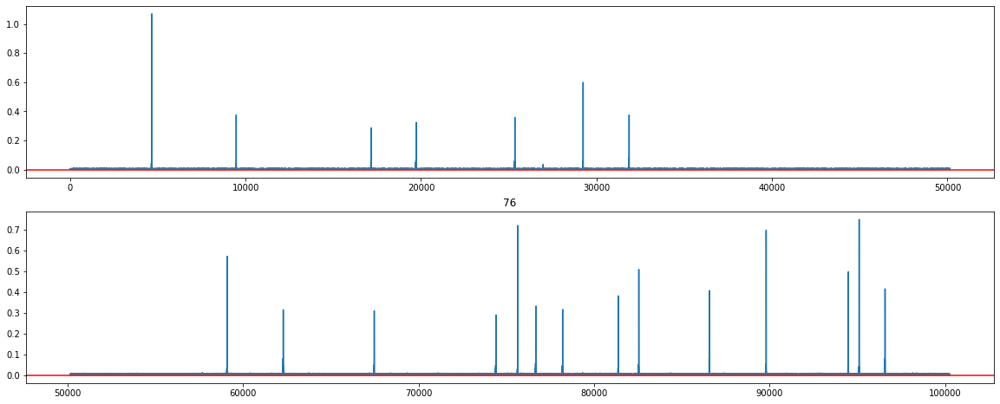

-------------------------------------------
plotting col 77


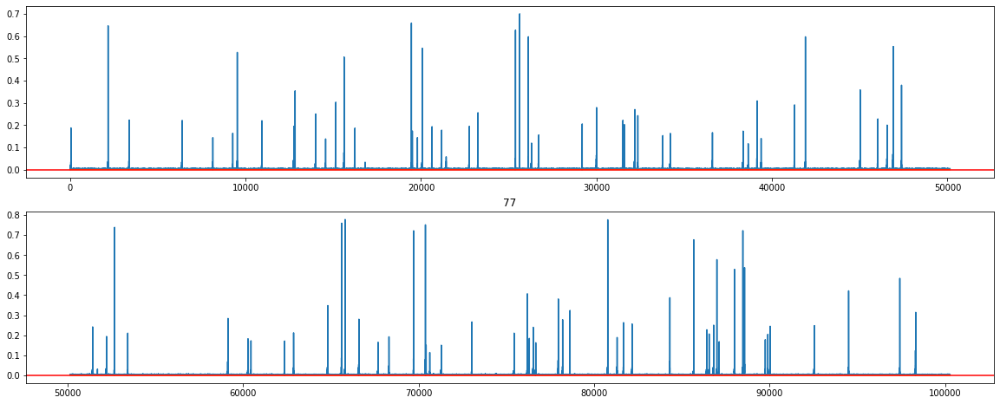

-------------------------------------------
plotting col 78


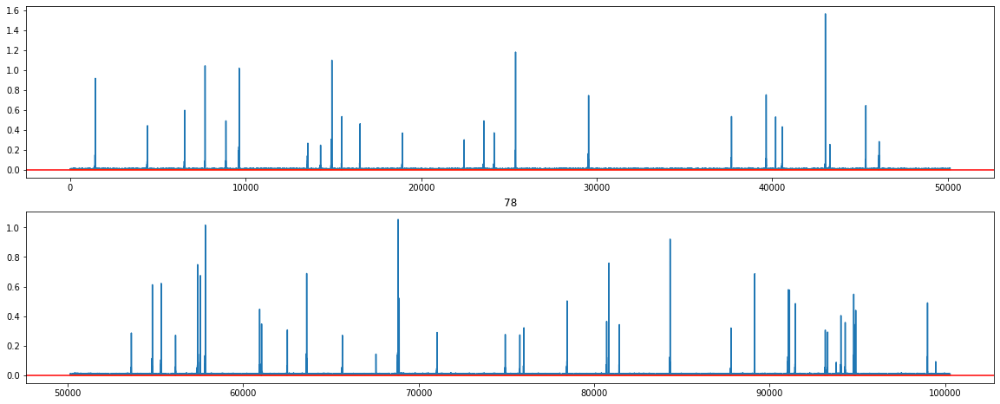

-------------------------------------------
plotting col 79


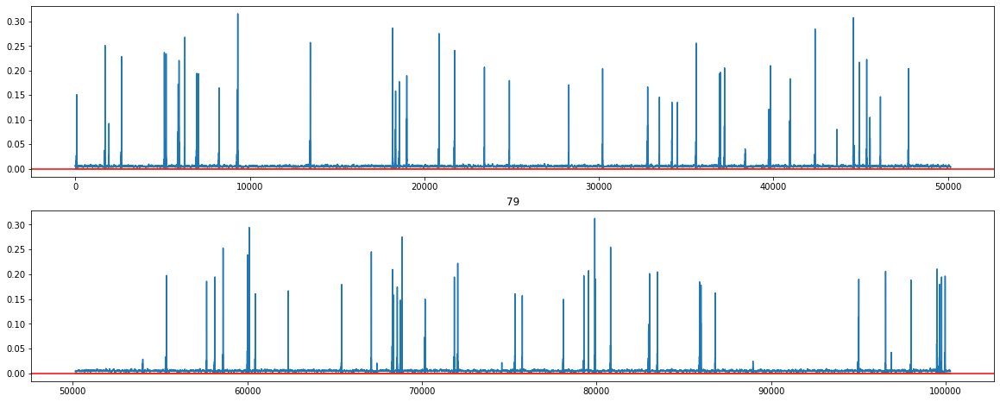

-------------------------------------------
plotting col 80


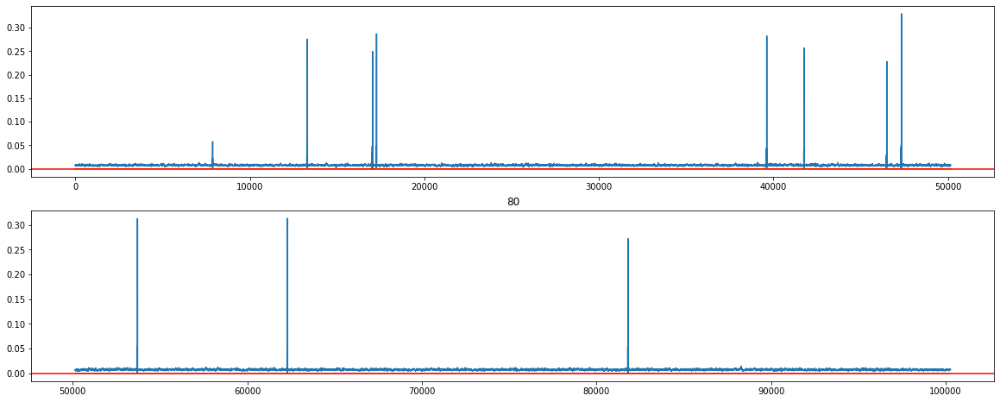

-------------------------------------------
plotting col 81


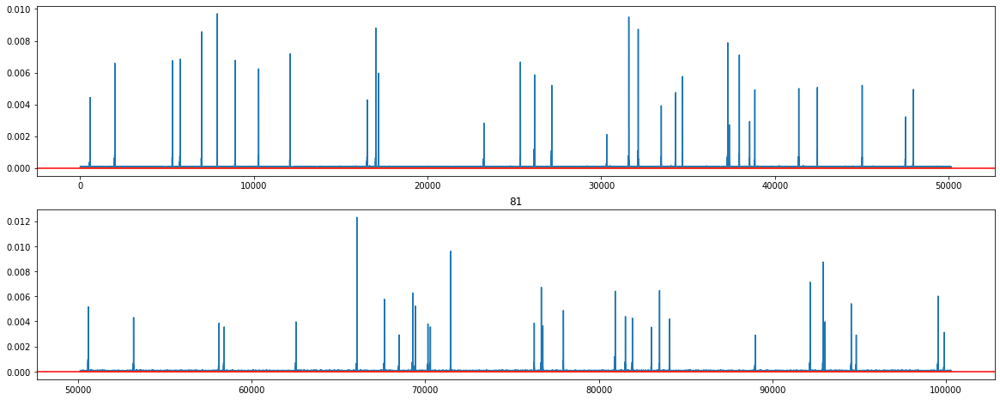

-------------------------------------------
plotting col 82


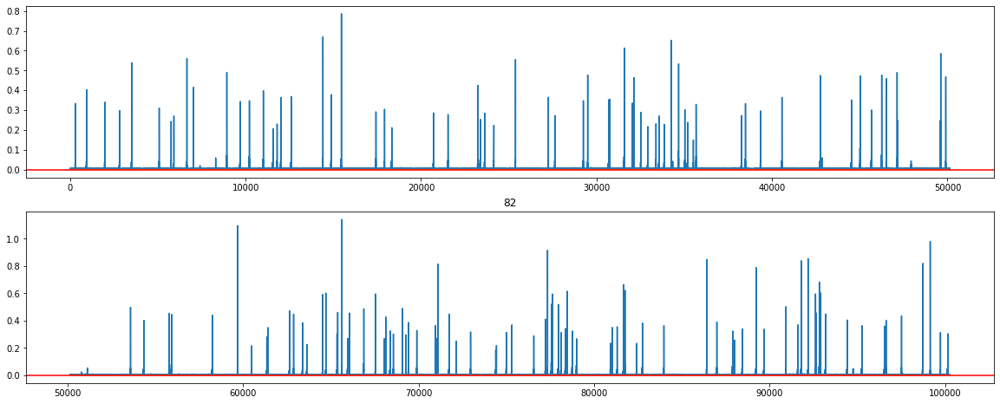

-------------------------------------------
plotting col 83


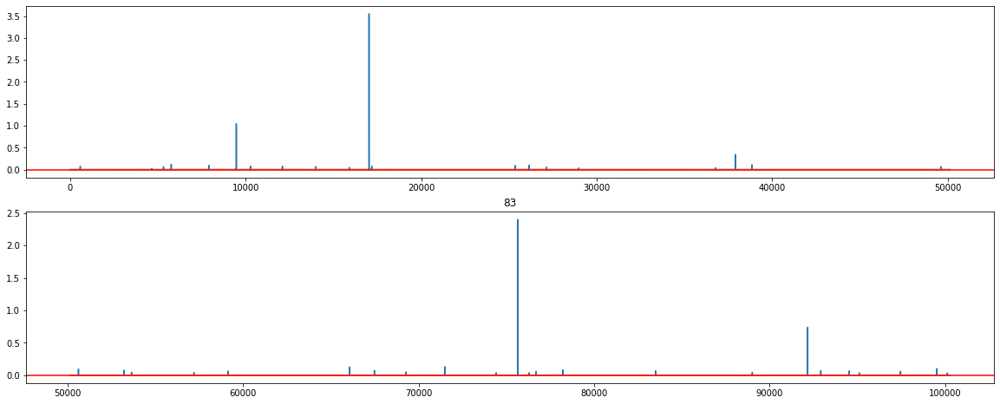

-------------------------------------------
plotting col 84


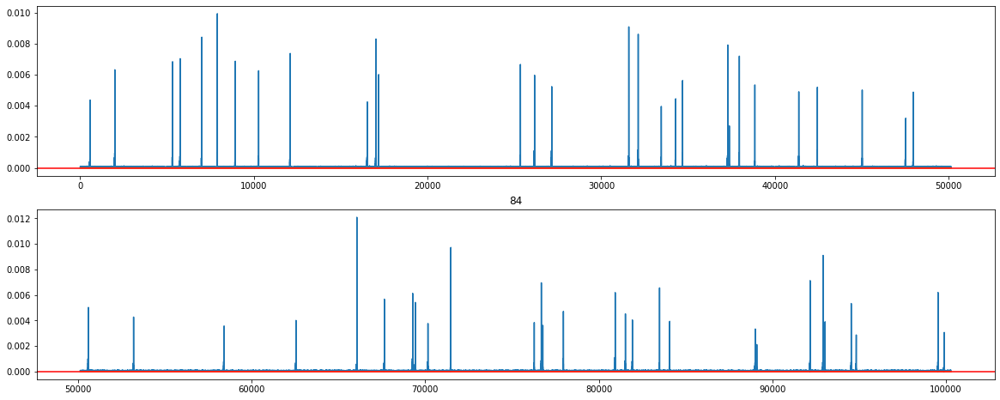

-------------------------------------------
plotting col 85


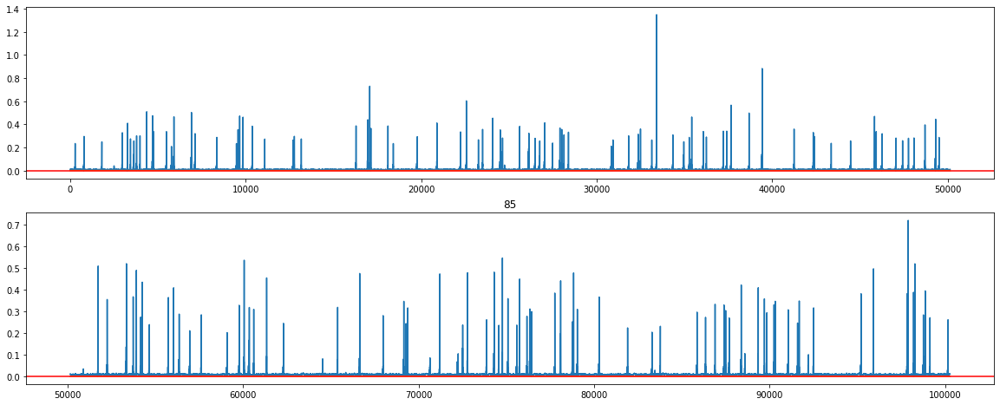

-------------------------------------------


In [84]:
T_CHECK_DIST = pd.DataFrame(T_CHECK_DIST)
THRESHOLD = 0

for i in range(T_CHECK_DIST.shape[1]):
    print(f'plotting col {i}')
    
    TS_ANOMALY_SCORE =  range_check(T_CHECK_DIST[i].to_numpy(), size=30)

    check_graph(TS_ANOMALY_SCORE, T_CHECK_ATT, piece=2, THRESHOLD=THRESHOLD, title = True, title_nm = i)
    print('-------------------------------------------')
    

In [85]:
%%time
model.eval()
CHECK_TS, PRED, CHECK_DIST, CHECK_ATT = inference(validloader, model)

CPU times: user 19.8 s, sys: 1.19 s, total: 21 s
Wall time: 13.8 s


In [88]:
ANOMALY_SCORE =  range_check(CHECK_DIST_DF[1].to_numpy(), size=30)
ANOMALY_SCORE

array([1.2825179e-04, 1.2986880e-04, 1.2676881e-04, ..., 7.9362144e-05,
       7.9362144e-05, 7.9362144e-05], dtype=float32)

In [91]:
MIN_A_SCORE = min(ANOMALY_SCORE)
MAX_A_SCORE = max(ANOMALY_SCORE)
A_SCORE_DIFF = MAX_A_SCORE - MIN_A_SCORE

print(A_SCORE_DIFF)

0.001160008


In [96]:
def put_labels(distance, threshold):
    xs = np.zeros_like(distance)
    xs[distance > threshold] = 1
    return xs

In [97]:
def fill_blank(check_ts, labels, total_ts):
    def ts_generator():
        for t in total_ts:
            yield dateutil.parser.parse(t)

    def label_generator():
        for t, label in zip(check_ts, labels):
            yield dateutil.parser.parse(t), label

    g_ts = ts_generator()
    g_label = label_generator()
    final_labels = []

    try:
        current = next(g_ts)
        ts_label, label = next(g_label)
        while True:
            if current > ts_label:
                ts_label, label = next(g_label)
                continue
            elif current < ts_label:
                final_labels.append(0)
                current = next(g_ts)
                continue
            final_labels.append(label)
            current = next(g_ts)
            ts_label, label = next(g_label)
    except StopIteration:
        return np.array(final_labels, dtype=np.int8)

In [95]:
list(np.around(np.arange(MIN_A_SCORE, MAX_A_SCORE, A_SCORE_DIFF/50), 6))

[1.6e-05,
 3.9e-05,
 6.3e-05,
 8.6e-05,
 0.000109,
 0.000132,
 0.000155,
 0.000179,
 0.000202,
 0.000225,
 0.000248,
 0.000271,
 0.000295,
 0.000318,
 0.000341,
 0.000364,
 0.000387,
 0.000411,
 0.000434,
 0.000457,
 0.00048,
 0.000503,
 0.000527,
 0.00055,
 0.000573,
 0.000596,
 0.000619,
 0.000643,
 0.000666,
 0.000689,
 0.000712,
 0.000735,
 0.000759,
 0.000782,
 0.000805,
 0.000828,
 0.000851,
 0.000875,
 0.000898,
 0.000921,
 0.000944,
 0.000967,
 0.000991,
 0.001014,
 0.001037,
 0.00106,
 0.001083,
 0.001107,
 0.00113,
 0.001153]

In [103]:
import pickle as pkl


text = "I LOVE YOU"


# SAVE
with open('./LOVE.pkl', 'wb') as F:
    pkl.dump(text, F)
    
# SAVE
with open('./LOVE.pkl', 'rb') as F:
    text2 = pkl.load(F)
    
print(text2)

I LOVE YOU


In [105]:
import numpy as np
from collections import Counter
import pickle as pkl

ATTACK_LABELS = put_labels(np.array(VALIDATION_DF_RAW[ATTACK_FIELD]), threshold=0.5)
# Counter(ATTACK_LABELS), ATTACK_LABELS.shape

CHECK_DIST_DF = pd.DataFrame(CHECK_DIST)
ab_dist = {}
ab_thres = {}

for i in range(CHECK_DIST_DF.shape[1]):
    print(f'Get best threshold for col {i}')
    
    best_thres = 0
    best_f1 = 0
    
    #ANOMALY_SCORE =  CHECK_DIST_DF[i].to_numpy()
    ANOMALY_SCORE =  range_check(CHECK_DIST_DF[i].to_numpy(), size=30)
    
    ab_dist[f'ANOMALY_SCORE_{i}'] = ANOMALY_SCORE

#     check_graph(ANOMALY_SCORE, CHECK_ATT, piece=2, THRESHOLD=THRESHOLD, title = True, title_nm = i)
    
    # get stats
    MIN_A_SCORE = min(ANOMALY_SCORE)
    MAX_A_SCORE = max(ANOMALY_SCORE)
    A_SCORE_DIFF = MAX_A_SCORE - MIN_A_SCORE
    
    # search params
    for THRESHOLD in list(np.around(np.arange(MIN_A_SCORE, MAX_A_SCORE, A_SCORE_DIFF/50), 6)):
        print(f'----------THRESHOLD : {THRESHOLD}----------')
        LABELS = put_labels(ANOMALY_SCORE, THRESHOLD)
        FINAL_LABELS = fill_blank(CHECK_TS, LABELS, np.array(VALIDATION_DF_RAW[TIMESTAMP_FIELD]))
        
        print('>>> ATTACK_LABELS')
        print(Counter(ATTACK_LABELS), ATTACK_LABELS.shape)
        print('>>> FINAL_LABELS')
        print(Counter(FINAL_LABELS), FINAL_LABELS.shape)

        if ATTACK_LABELS.shape[0] == FINAL_LABELS.shape[0]:
            TaPR = etapr.evaluate_haicon(anomalies=ATTACK_LABELS, predictions=FINAL_LABELS)
            print(f">>> F1: {TaPR['f1']:.3f} (TaP: {TaPR['TaP']:.3f}, TaR: {TaPR['TaR']:.3f})")
            print(f">>> # of detected anomalies: {len(TaPR['Detected_Anomalies'])}")
            print(f">>> Detected anomalies: {TaPR['Detected_Anomalies']}")

            if TaPR['f1']>best_f1:
                best_thres = THRESHOLD
                best_f1 = TaPR['f1']
                print("***Best Threshold updated!!***")
                    
    print(f'>>>> BEST THRESHOLD FOR COL{i} is {best_thres} and F1 is {best_f1}!!!')
    
    ab_thres[f'ANOMALY_THRES_{i}'] =  best_thres
    
    # 만일 MIN이라면 사용 X
    if best_thres == MIN_A_SCORE :
        print(f'Not using col {i} !!')
        ab_thres[f'ANOMALY_THRES_{i}'] = None

    # SAVE
    with open('./ANOMALY_SCORE.pkl', 'wb') as A_SCORE:
        pkl.dump(ab_dist, A_SCORE)
    with open('./ANOMALY_THRES.pkl', 'wb') as A_THRES:
        pkl.dump(ab_thres, A_THRES)
        
#     with open('filename.pkl', 'rb') as handle:
#         b = pickle.load(handle)

Get best threshold for col 0
----------THRESHOLD : 0.00667----------
>>> ATTACK_LABELS
Counter({0: 85515, 1: 885}) (86400,)
>>> FINAL_LABELS
Counter({1: 86145, 0: 255}) (86400,)
>>> F1: 0.000 (TaP: 0.000, TaR: 0.000)
>>> # of detected anomalies: 0
>>> Detected anomalies: []
----------THRESHOLD : 0.008181----------
>>> ATTACK_LABELS
Counter({0: 85515, 1: 885}) (86400,)
>>> FINAL_LABELS
Counter({1: 86098, 0: 302}) (86400,)
>>> F1: 0.000 (TaP: 0.000, TaR: 0.000)
>>> # of detected anomalies: 0
>>> Detected anomalies: []
----------THRESHOLD : 0.009692----------
>>> ATTACK_LABELS
Counter({0: 85515, 1: 885}) (86400,)
>>> FINAL_LABELS
Counter({1: 85790, 0: 610}) (86400,)
>>> F1: 0.000 (TaP: 0.000, TaR: 0.000)
>>> # of detected anomalies: 0
>>> Detected anomalies: []
----------THRESHOLD : 0.011203----------
>>> ATTACK_LABELS
Counter({0: 85515, 1: 885}) (86400,)
>>> FINAL_LABELS
Counter({1: 84961, 0: 1439}) (86400,)
>>> F1: 0.000 (TaP: 0.000, TaR: 0.000)
>>> # of detected anomalies: 0
>>> Detect

/usr/local/lib/python3.6/dist-packages/TaPR_pkg/etapr.py:267: RuntimeWarning: invalid value encountered in double_scalars
  return hit_cnt / extended_predictions_len


>>> F1: 0.000 (TaP: 0.000, TaR: 0.000)
>>> # of detected anomalies: 0
>>> Detected anomalies: []
----------THRESHOLD : 0.001107----------
>>> ATTACK_LABELS
Counter({0: 85515, 1: 885}) (86400,)
>>> FINAL_LABELS
Counter({0: 86393, 1: 7}) (86400,)
>>> F1: 0.000 (TaP: 0.000, TaR: 0.000)
>>> # of detected anomalies: 0
>>> Detected anomalies: []
----------THRESHOLD : 0.00113----------
>>> ATTACK_LABELS
Counter({0: 85515, 1: 885}) (86400,)
>>> FINAL_LABELS
Counter({0: 86394, 1: 6}) (86400,)
>>> F1: 0.000 (TaP: 0.000, TaR: 0.000)
>>> # of detected anomalies: 0
>>> Detected anomalies: []
----------THRESHOLD : 0.001153----------
>>> ATTACK_LABELS
Counter({0: 85515, 1: 885}) (86400,)
>>> FINAL_LABELS
Counter({0: 86396, 1: 4}) (86400,)
>>> F1: 0.000 (TaP: 0.000, TaR: 0.000)
>>> # of detected anomalies: 0
>>> Detected anomalies: []
>>>> BEST THRESHOLD FOR COL1 is 0.00048 and F1 is 0.10015765551401269!!!
Get best threshold for col 2
----------THRESHOLD : 0.000408----------
>>> ATTACK_LABELS
Counter(

KeyboardInterrupt: 

In [ ]:
# LOAD RESULTS
with open('./ANOMALY_SCORE.pkl', 'rb') as A_SCORE:
    ab_dist = pkl.load(A_SCORE)

with open('./ANOMALY_THRES.pkl', 'rb') as A_THRES:
    ab_thres = pkl.load(A_THRES)

In [ ]:
ab_dist

In [ ]:
ab_thres

In [ ]:
PRED.shape

In [ ]:
CHECK_DIST.shape

In [53]:
# PRED2 = rearrange(PRED, 't v -> v t')
# CHECK_DIST2 = rearrange(CHECK_DIST, 't v -> v t')

In [77]:
# CHECK_DIST3 = range_check(CHECK_DIST2, size=30)
# CHECK_DIST3.shape

In [ ]:
THRESHOLD = 0
check_graph2(CHECK_DIST2, CHECK_ATT, piece=2, THRESHOLD=THRESHOLD)

In [83]:
att1 = [1, 0, 15, 23, 26, 31, 55, 69, 74, 76]
att2 = [11, 18, 23, 25, 31, 42, 56, 69, 75, 75]
att3 = [1, 9, 19, 21, 22, 26, 72, 75]
att4 = [15, 28, 30, 64]
att5 = [1, 2, 3, 4, 6, 7, 8, 9, 11, 13, 
        15, 16, 17, 18, 20, 21, 22, 23, 25, 26,
       28, 31, 33, 35, 36, 37, 42, 45, 47, 54, 
        56, 60, 63, 66, 67, 69, 74, 75, 76, 78, 
        81, 83, 84]
att6 = [11, 70]
att7 = [0, 5, 15, 80]

In [85]:
CHECK_DIST2[att1].shape

(10, 86146)

In [115]:
ANOMALY_SCORE1 = np.mean(rearrange(CHECK_DIST2[att1], 'v t -> t v'), axis=1)
ANOMALY_SCORE2 = np.mean(rearrange(CHECK_DIST2[att2], 'v t -> t v'), axis=1)
ANOMALY_SCORE3 = np.mean(rearrange(CHECK_DIST2[att3], 'v t -> t v'), axis=1)
ANOMALY_SCORE4 = np.mean(rearrange(CHECK_DIST2[att4], 'v t -> t v'), axis=1)
ANOMALY_SCORE5 = np.mean(rearrange(CHECK_DIST2[att5], 'v t -> t v'), axis=1)
ANOMALY_SCORE6 = np.mean(rearrange(CHECK_DIST2[att6], 'v t -> t v'), axis=1)
ANOMALY_SCORE7 = np.mean(rearrange(CHECK_DIST2[att7], 'v t -> t v'), axis=1)

In [106]:
ANOMALY_SCORE1.shape

(86146,)

In [126]:
C_ANOMALY_SCORE1 = range_check(ANOMALY_SCORE1, size=90)
C_ANOMALY_SCORE2 = range_check(ANOMALY_SCORE2, size=90)
C_ANOMALY_SCORE3 = range_check(ANOMALY_SCORE3, size=90)
C_ANOMALY_SCORE4 = range_check(ANOMALY_SCORE4, size=90)
C_ANOMALY_SCORE5 = range_check(ANOMALY_SCORE5, size=90)
C_ANOMALY_SCORE6 = range_check(ANOMALY_SCORE6, size=90)
C_ANOMALY_SCORE7 = range_check(ANOMALY_SCORE7, size=90)

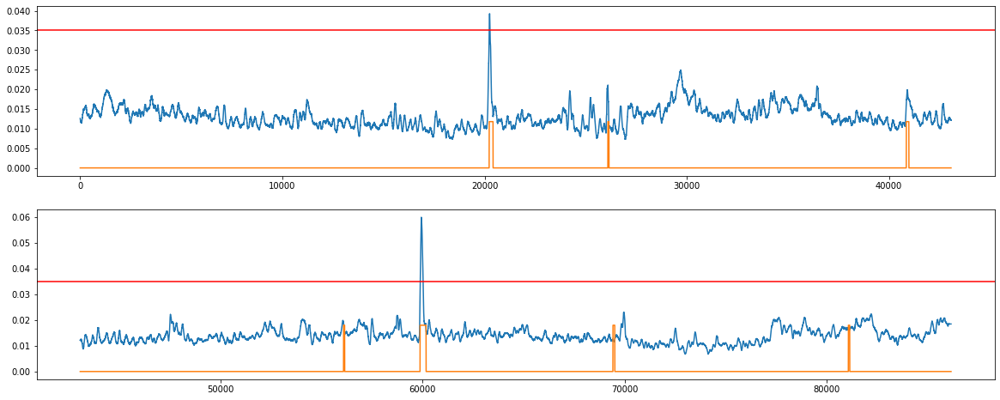

In [127]:
THRESHOLD = 0.035
graph = check_graph(C_ANOMALY_SCORE1, CHECK_ATT, piece=2, THRESHOLD=THRESHOLD)

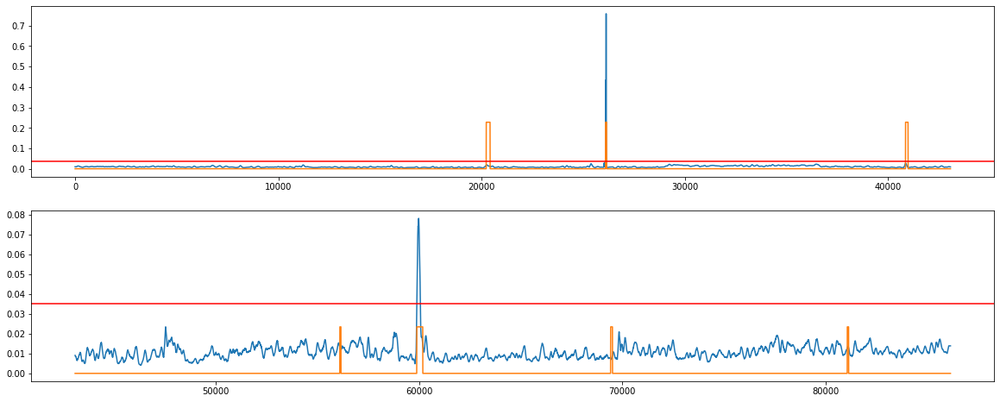

In [128]:
THRESHOLD = 0.035
graph = check_graph(C_ANOMALY_SCORE2, CHECK_ATT, piece=2, THRESHOLD=THRESHOLD)

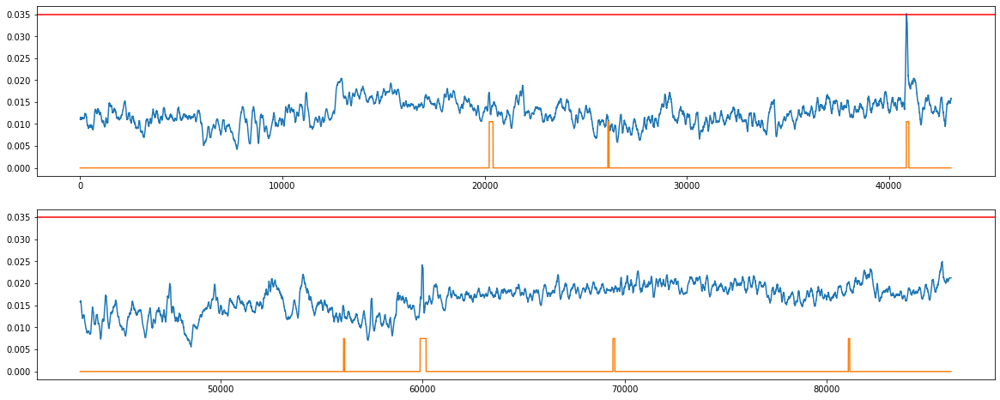

In [129]:
THRESHOLD = 0.035
graph = check_graph(C_ANOMALY_SCORE3, CHECK_ATT, piece=2, THRESHOLD=THRESHOLD)

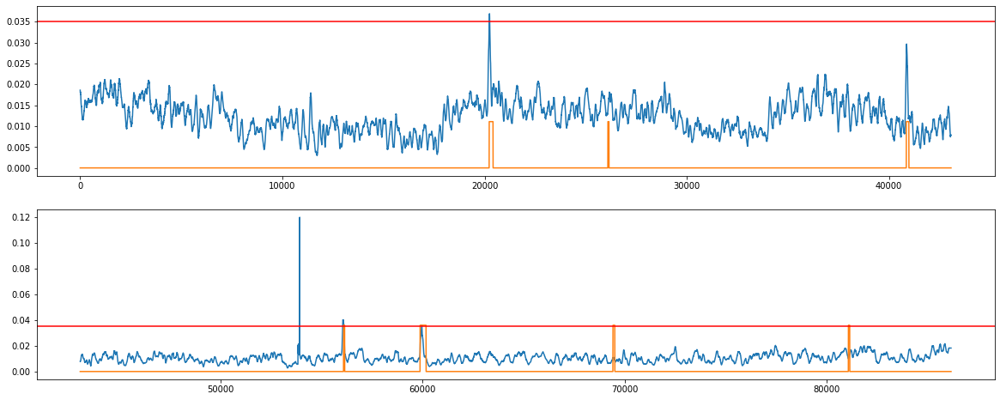

In [130]:
THRESHOLD = 0.035
graph = check_graph(C_ANOMALY_SCORE4, CHECK_ATT, piece=2, THRESHOLD=THRESHOLD)

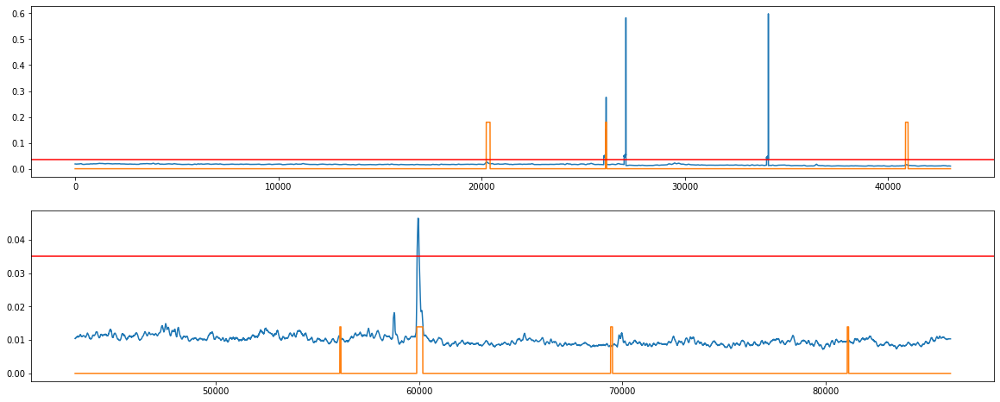

In [131]:
THRESHOLD = 0.035
graph = check_graph(C_ANOMALY_SCORE5, CHECK_ATT, piece=2, THRESHOLD=THRESHOLD)

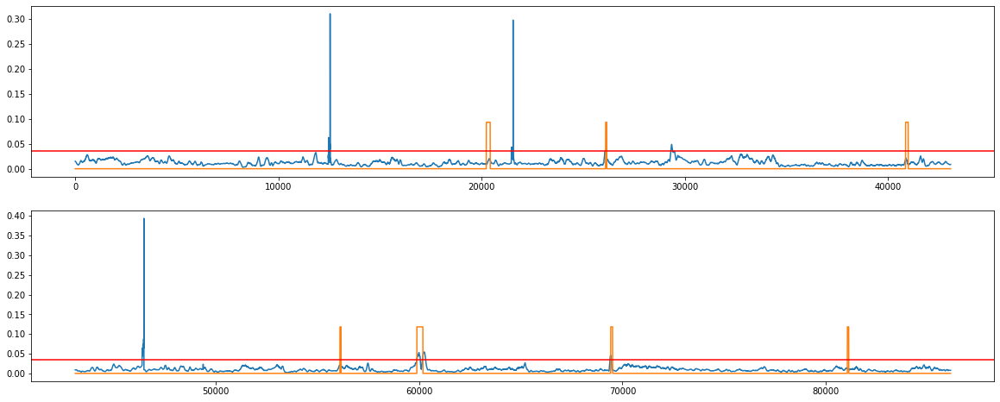

In [132]:
THRESHOLD = 0.035
graph = check_graph(C_ANOMALY_SCORE6, CHECK_ATT, piece=2, THRESHOLD=THRESHOLD)

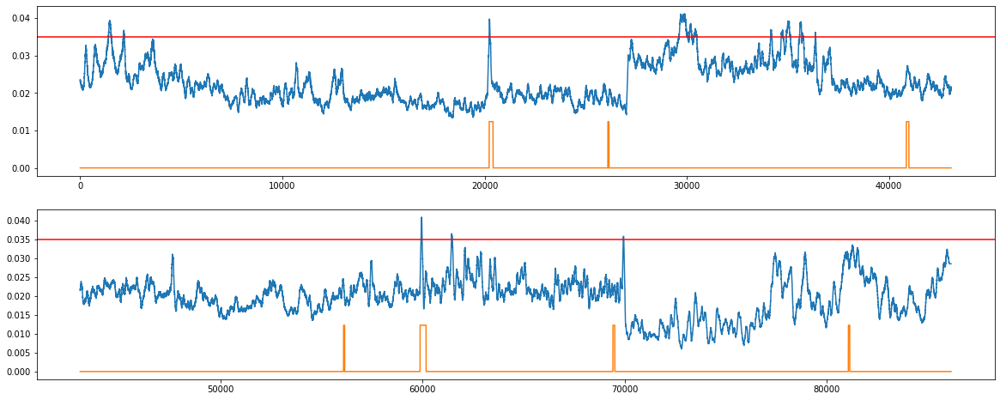

In [133]:
THRESHOLD = 0.035
graph = check_graph(C_ANOMALY_SCORE7, CHECK_ATT, piece=2, THRESHOLD=THRESHOLD)

In [135]:
THRESHOLD1 = 0.03
THRESHOLD2 = 0.05
THRESHOLD3 = 0.025
THRESHOLD4 = 0.035
THRESHOLD6 = 0.035
THRESHOLD7 = 0.025

In [137]:
LABELS1 = put_labels(C_ANOMALY_SCORE1, THRESHOLD1)
LABELS2 = put_labels(C_ANOMALY_SCORE2, THRESHOLD2)
LABELS3 = put_labels(C_ANOMALY_SCORE3, THRESHOLD3)
LABELS4 = put_labels(C_ANOMALY_SCORE4, THRESHOLD4)
LABELS6 = put_labels(C_ANOMALY_SCORE6, THRESHOLD6)
LABELS7 = put_labels(C_ANOMALY_SCORE7, THRESHOLD7)

In [138]:
FINAL_LABELS1 = fill_blank(CHECK_TS, LABELS1, np.array(VALIDATION_DF_RAW[TIMESTAMP_FIELD]))
FINAL_LABELS2 = fill_blank(CHECK_TS, LABELS2, np.array(VALIDATION_DF_RAW[TIMESTAMP_FIELD]))
FINAL_LABELS3 = fill_blank(CHECK_TS, LABELS3, np.array(VALIDATION_DF_RAW[TIMESTAMP_FIELD]))
FINAL_LABELS4 = fill_blank(CHECK_TS, LABELS4, np.array(VALIDATION_DF_RAW[TIMESTAMP_FIELD]))
FINAL_LABELS6 = fill_blank(CHECK_TS, LABELS6, np.array(VALIDATION_DF_RAW[TIMESTAMP_FIELD]))
FINAL_LABELS7 = fill_blank(CHECK_TS, LABELS7, np.array(VALIDATION_DF_RAW[TIMESTAMP_FIELD]))

In [141]:
FINAL_LABELS_whole = FINAL_LABELS1+FINAL_LABELS2+FINAL_LABELS3+FINAL_LABELS4+FINAL_LABELS6+FINAL_LABELS7
FINAL_LABELS_iffy = FINAL_LABELS1+FINAL_LABELS2+FINAL_LABELS3+FINAL_LABELS4+FINAL_LABELS6
FINAL_LABELS_certain = FINAL_LABELS1+FINAL_LABELS2+FINAL_LABELS3

In [142]:
FINAL_LABELS_whole1 = np.array([1 if i > 0 else i for i in FINAL_LABELS_whole])
FINAL_LABELS_iffy1 = np.array([1 if i > 0 else i for i in FINAL_LABELS_iffy])
FINAL_LABELS_certain1 = np.array([1 if i > 0 else i for i in FINAL_LABELS_certain])

In [144]:
FINAL_LABELS_whole

array([0, 0, 0, ..., 1, 1, 1], dtype=int8)

In [146]:
ATTACK_LABELS = put_labels(np.array(VALIDATION_DF_RAW[ATTACK_FIELD]), threshold=0.5)
ATTACK_LABELS, ATTACK_LABELS.shape

(array([0, 0, 0, ..., 0, 0, 0]), (86400,))

In [147]:
TaPR = etapr.evaluate_haicon(anomalies=ATTACK_LABELS, predictions=FINAL_LABELS_whole1)
print(f"F1: {TaPR['f1']:.3f} (TaP: {TaPR['TaP']:.3f}, TaR: {TaPR['TaR']:.3f})")
print(f"# of detected anomalies: {len(TaPR['Detected_Anomalies'])}")
print(f"Detected anomalies: {TaPR['Detected_Anomalies']}")

F1: 0.057 (TaP: 0.031, TaR: 0.412)
# of detected anomalies: 4
Detected anomalies: [<TaPR_pkg.DataManage.Range.Range object at 0x7fe210038970>, <TaPR_pkg.DataManage.Range.Range object at 0x7fe2115dc040>, <TaPR_pkg.DataManage.Range.Range object at 0x7fe1f3be5eb0>, <TaPR_pkg.DataManage.Range.Range object at 0x7fe2115f92b0>]


In [148]:
TaPR = etapr.evaluate_haicon(anomalies=ATTACK_LABELS, predictions=FINAL_LABELS_iffy1)
print(f"F1: {TaPR['f1']:.3f} (TaP: {TaPR['TaP']:.3f}, TaR: {TaPR['TaR']:.3f})")
print(f"# of detected anomalies: {len(TaPR['Detected_Anomalies'])}")
print(f"Detected anomalies: {TaPR['Detected_Anomalies']}")

F1: 0.277 (TaP: 0.222, TaR: 0.368)
# of detected anomalies: 4
Detected anomalies: [<TaPR_pkg.DataManage.Range.Range object at 0x7fe210102760>, <TaPR_pkg.DataManage.Range.Range object at 0x7fe213e66760>, <TaPR_pkg.DataManage.Range.Range object at 0x7fe1f3c6e790>, <TaPR_pkg.DataManage.Range.Range object at 0x7fe2115ceca0>]


In [149]:
TaPR = etapr.evaluate_haicon(anomalies=ATTACK_LABELS, predictions=FINAL_LABELS_certain1)
print(f"F1: {TaPR['f1']:.3f} (TaP: {TaPR['TaP']:.3f}, TaR: {TaPR['TaR']:.3f})")
print(f"# of detected anomalies: {len(TaPR['Detected_Anomalies'])}")
print(f"Detected anomalies: {TaPR['Detected_Anomalies']}")

F1: 0.433 (TaP: 0.589, TaR: 0.342)
# of detected anomalies: 4
Detected anomalies: [<TaPR_pkg.DataManage.Range.Range object at 0x7fe1f3c6eac0>, <TaPR_pkg.DataManage.Range.Range object at 0x7fe1f3c6eaf0>, <TaPR_pkg.DataManage.Range.Range object at 0x7fe214815bb0>, <TaPR_pkg.DataManage.Range.Range object at 0x7fe1f3c6e0a0>]


---

In [45]:
%%time
model.eval()
CHECK_TS, PRED, CHECK_DIST, CHECK_ATT = inference(testloader, model)

CPU times: user 8min 43s, sys: 24.3 s, total: 9min 8s
Wall time: 45.5 s


In [46]:
CHECK_DIST2 = rearrange(CHECK_DIST, 't v -> v t')

In [47]:
att1 = [1, 0, 15, 23, 26, 31, 55, 69, 74, 76]
att2 = [11, 18, 23, 25, 31, 42, 56, 69, 75, 75]
att3 = [1, 9, 19, 21, 22, 26, 72, 75]
att4 = [15, 28, 30, 64]
att5 = [1, 2, 3, 4, 6, 7, 8, 9, 11, 13, 
        15, 16, 17, 18, 20, 21, 22, 23, 25, 26,
       28, 31, 33, 35, 36, 37, 42, 45, 47, 54, 
        56, 60, 63, 66, 67, 69, 74, 75, 76, 78, 
        81, 83, 84]
att6 = [11, 70]
att7 = [0, 5, 15, 80]

In [48]:
ANOMALY_SCORE1 = np.mean(rearrange(CHECK_DIST2[att1], 'v t -> t v'), axis=1)
ANOMALY_SCORE2 = np.mean(rearrange(CHECK_DIST2[att2], 'v t -> t v'), axis=1)
ANOMALY_SCORE3 = np.mean(rearrange(CHECK_DIST2[att3], 'v t -> t v'), axis=1)
ANOMALY_SCORE4 = np.mean(rearrange(CHECK_DIST2[att4], 'v t -> t v'), axis=1)
ANOMALY_SCORE5 = np.mean(rearrange(CHECK_DIST2[att5], 'v t -> t v'), axis=1)
ANOMALY_SCORE6 = np.mean(rearrange(CHECK_DIST2[att6], 'v t -> t v'), axis=1)
ANOMALY_SCORE7 = np.mean(rearrange(CHECK_DIST2[att7], 'v t -> t v'), axis=1)

In [49]:
C_ANOMALY_SCORE1 = range_check(ANOMALY_SCORE1, size=90)
C_ANOMALY_SCORE2 = range_check(ANOMALY_SCORE2, size=90)
C_ANOMALY_SCORE3 = range_check(ANOMALY_SCORE3, size=90)
C_ANOMALY_SCORE4 = range_check(ANOMALY_SCORE4, size=90)
C_ANOMALY_SCORE5 = range_check(ANOMALY_SCORE5, size=90)
C_ANOMALY_SCORE6 = range_check(ANOMALY_SCORE6, size=90)
C_ANOMALY_SCORE7 = range_check(ANOMALY_SCORE7, size=90)

In [50]:
THRESHOLD1 = 0.03
THRESHOLD2 = 0.05
THRESHOLD3 = 0.025
THRESHOLD4 = 0.035
THRESHOLD6 = 0.035
THRESHOLD7 = 0.025

In [54]:
LABELS1 = put_labels(C_ANOMALY_SCORE1, THRESHOLD1)
LABELS2 = put_labels(C_ANOMALY_SCORE2, THRESHOLD2)
LABELS3 = put_labels(C_ANOMALY_SCORE3, THRESHOLD3)
LABELS4 = put_labels(C_ANOMALY_SCORE4, THRESHOLD4)
LABELS6 = put_labels(C_ANOMALY_SCORE6, THRESHOLD6)
LABELS7 = put_labels(C_ANOMALY_SCORE7, THRESHOLD7)

In [55]:
LABELS_whole = LABELS1+LABELS2+LABELS3+LABELS4+LABELS6+LABELS7
LABELS_iffy = LABELS1+LABELS2+LABELS3+LABELS4+LABELS6
LABELS_certain = LABELS1+LABELS2+LABELS3

In [56]:
LABELS_whole1 = np.array([1 if i > 0 else i for i in LABELS_whole])
LABELS_iffy1 = np.array([1 if i > 0 else i for i in LABELS_iffy])
LABELS_certain1 = np.array([1 if i > 0 else i for i in LABELS_certain])

In [61]:
submission = pd.read_csv('./HAICon2021_dataset/sample_submission.csv')
submission.index = submission['timestamp']
submission.loc[CHECK_TS,'attack'] = LABELS_certain1
submission

,timestamp,attack
timestamp,,
2021-07-13 16:00:01,2021-07-13 16:00:01,0.0
2021-07-13 16:00:02,2021-07-13 16:00:02,0.0
2021-07-13 16:00:03,2021-07-13 16:00:03,0.0
2021-07-13 16:00:04,2021-07-13 16:00:04,0.0
2021-07-13 16:00:05,2021-07-13 16:00:05,0.0
...,...,...
2021-07-16 23:59:56,2021-07-16 23:59:56,0.0
2021-07-16 23:59:57,2021-07-16 23:59:57,0.0
2021-07-16 23:59:58,2021-07-16 23:59:58,0.0


In [62]:
submission.to_csv('GPT254_certain.csv', index=False)

---

In [74]:
ANOMALY_SCORE = np.mean(CHECK_DIST, axis=1)

In [75]:
C_ANOMALY_SCORE = range_check(ANOMALY_SCORE, size=80)

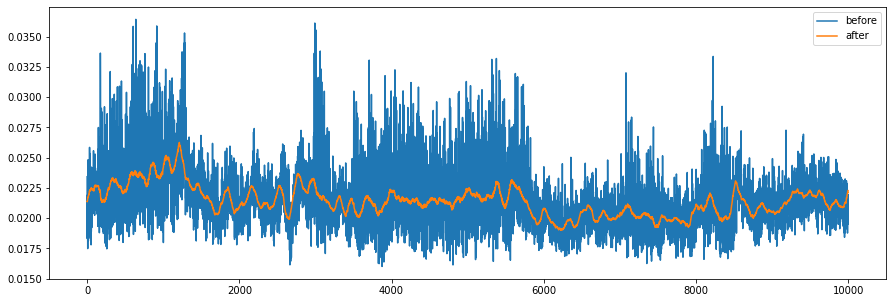

In [58]:
plt.figure(figsize=(15,5))
plt.plot(ANOMALY_SCORE[10000:20000], label='before')
plt.plot(C_ANOMALY_SCORE[10000:20000], label='after')
plt.legend()
plt.show()

In [59]:
CHECK_ATT

array([0., 0., 0., ..., 0., 0., 0.], dtype=float32)

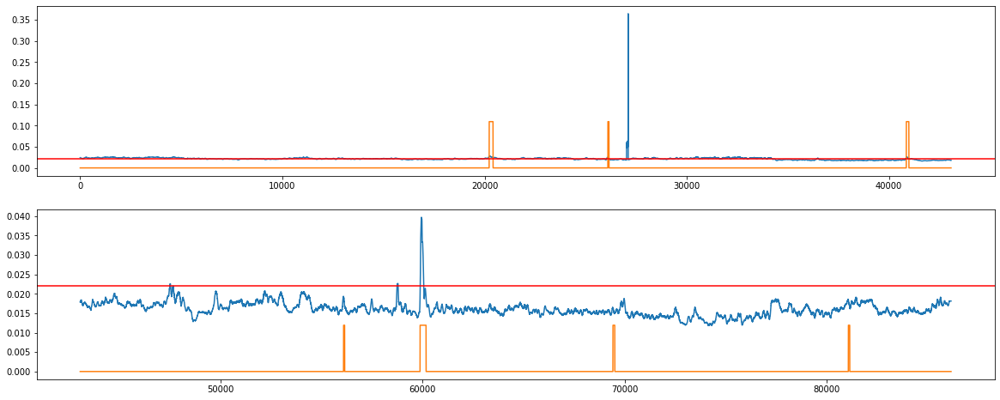

In [76]:
THRESHOLD = 0.022
graph = check_graph(C_ANOMALY_SCORE, CHECK_ATT, piece=2, THRESHOLD=THRESHOLD)

In [52]:
def put_labels(distance, threshold):
    xs = np.zeros_like(distance)
    xs[distance > threshold] = 1
    return xs

In [69]:
LABELS = put_labels(C_ANOMALY_SCORE, THRESHOLD)
LABELS, LABELS.shape

(array([1., 1., 1., ..., 0., 0., 0.]), (86146,))

In [146]:
ATTACK_LABELS = put_labels(np.array(VALIDATION_DF_RAW[ATTACK_FIELD]), threshold=0.5)
ATTACK_LABELS, ATTACK_LABELS.shape

(array([0, 0, 0, ..., 0, 0, 0]), (86400,))

In [53]:
def fill_blank(check_ts, labels, total_ts):
    def ts_generator():
        for t in total_ts:
            yield dateutil.parser.parse(t)

    def label_generator():
        for t, label in zip(check_ts, labels):
            yield dateutil.parser.parse(t), label

    g_ts = ts_generator()
    g_label = label_generator()
    final_labels = []

    try:
        current = next(g_ts)
        ts_label, label = next(g_label)
        while True:
            if current > ts_label:
                ts_label, label = next(g_label)
                continue
            elif current < ts_label:
                final_labels.append(0)
                current = next(g_ts)
                continue
            final_labels.append(label)
            current = next(g_ts)
            ts_label, label = next(g_label)
    except StopIteration:
        return np.array(final_labels, dtype=np.int8)

In [72]:
%%time
FINAL_LABELS = fill_blank(CHECK_TS, LABELS, np.array(VALIDATION_DF_RAW[TIMESTAMP_FIELD]))
FINAL_LABELS.shape

CPU times: user 8 s, sys: 6.47 ms, total: 8 s
Wall time: 7.99 s


(86400,)

In [73]:
TaPR = etapr.evaluate_haicon(anomalies=ATTACK_LABELS, predictions=FINAL_LABELS)
print(f"F1: {TaPR['f1']:.3f} (TaP: {TaPR['TaP']:.3f}, TaR: {TaPR['TaR']:.3f})")
print(f"# of detected anomalies: {len(TaPR['Detected_Anomalies'])}")
print(f"Detected anomalies: {TaPR['Detected_Anomalies']}")

F1: 0.053 (TaP: 0.029, TaR: 0.254)
# of detected anomalies: 2
Detected anomalies: [<TaPR_pkg.DataManage.Range.Range object at 0x7f98536b7430>, <TaPR_pkg.DataManage.Range.Range object at 0x7f9853624d60>]


---

In [74]:
%%time
model.eval()
CHECK_TS, CHECK_DIST, CHECK_ATT = inference(testloader, model)

CPU times: user 8min 4s, sys: 21.6 s, total: 8min 26s
Wall time: 42 s


In [75]:
ANOMALY_SCORE = np.mean(CHECK_DIST, axis=1)

In [76]:
C_ANOMALY_SCORE = range_check(ANOMALY_SCORE, size=30)

<module 'matplotlib.pyplot' from '/opt/conda/lib/python3.8/site-packages/matplotlib/pyplot.py'>

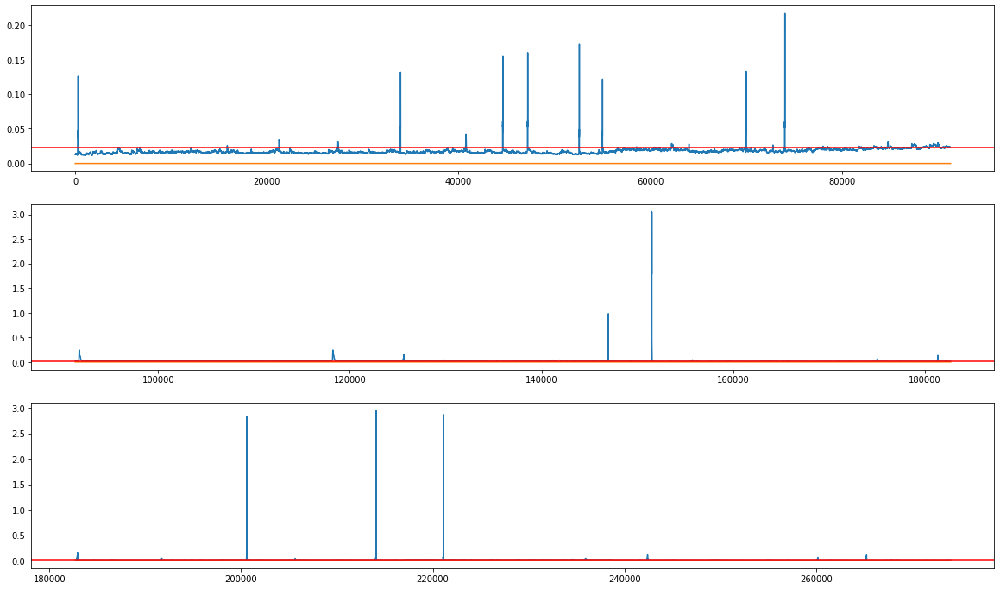

In [77]:
check_graph(C_ANOMALY_SCORE, CHECK_ATT, piece=3, THRESHOLD=THRESHOLD)

In [83]:
LABELS = put_labels(C_ANOMALY_SCORE, THRESHOLD)
LABELS, LABELS.shape

(array([0., 0., 0., ..., 0., 0., 0.]), (274038,))

In [84]:
submission = pd.read_csv('./HAICon2021_dataset/sample_submission.csv')
submission.index = submission['timestamp']
submission.loc[CHECK_TS,'attack'] = LABELS
submission

,timestamp,attack
timestamp,,
2021-07-13 16:00:01,2021-07-13 16:00:01,0.0
2021-07-13 16:00:02,2021-07-13 16:00:02,0.0
2021-07-13 16:00:03,2021-07-13 16:00:03,0.0
2021-07-13 16:00:04,2021-07-13 16:00:04,0.0
2021-07-13 16:00:05,2021-07-13 16:00:05,0.0
...,...,...
2021-07-16 23:59:56,2021-07-16 23:59:56,0.0
2021-07-16 23:59:57,2021-07-16 23:59:57,0.0
2021-07-16 23:59:58,2021-07-16 23:59:58,0.0


In [85]:
submission.to_csv('GPT254_023_80.csv', index=False)

In [92]:
torch.save({'model': model.state_dict(), 
                'Threshold': 0.025, 
               }, './checkpoints/GPTLARGE_1024.tar')

----